#Description

This colab has the results of all samples acquired and analyzed during the Scientific Initiation of Diego de Sá Dias, oriented by Jean Faber de Abreu.

As a notice, the classes are labed as:
  - Class 0: Base Line
  - Class 1: Biceps Femoris Muscle Contractions
  - Class 2: Rectus Femoris Muscle Contractions

# Importing icfunction


In [1]:
%run icfunctions.py
"""from icfunction import data_division
from icfunctioin import shuffering
from icfunctioin import apply_pca
from icfunctioin import apply_lda
from icfunctioin import apply_qda
from icfunctioin import apply_pls
from icfunctioin import apply_svm
from icfunctioin import build_and_apply_ann
from icfunctioin import plot_ROC"""

'from icfunction import data_division\nfrom icfunctioin import shuffering\nfrom icfunctioin import apply_pca\nfrom icfunctioin import apply_lda\nfrom icfunctioin import apply_qda\nfrom icfunctioin import apply_pls\nfrom icfunctioin import apply_svm\nfrom icfunctioin import build_and_apply_ann\nfrom icfunctioin import plot_ROC'

Other Functions

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

contraction_division_window = 500

# Individuo 1- Diego
  

## Fazendo com os dados de 100 repetições seguidas (1ªGravação)

### RAW (Right)

In [70]:
# Biceps Femoral
bf_combined = pd.read_csv('/content/ID1-RAW-BF-Direito-arquivo_combinado.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf_combined = pd.read_csv('/content/ID1-RAW-RF-Direito-arquivo_combinado.txt', delimiter = '\t')


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_df = pd.DataFrame(dados)
id1_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[13.263557086992023, 23.033557086992005, 18.14...",1
1,BF_Contraction_number_1,"[6.2964429130079225, 11.176442913008032, 13.26...",1
2,BF_Contraction_number_2,"[6.2964429130079225, 6.2964429130079225, 35.61...",1
3,BF_Contraction_number_3,"[13.263557086992023, 13.263557086992023, 3.483...",1
4,BF_Contraction_number_4,"[11.176442913008032, 23.033557086992005, 18.14...",1
...,...,...,...
393,RF_BaseLine_number_94,"[23.516479084189996, 52.84647908418992, 38.176...",0
394,RF_BaseLine_number_95,"[28.40647908418987, 33.29647908418974, 28.4064...",0
395,RF_BaseLine_number_96,"[13.746479084190014, 13.746479084190014, 28.40...",0
396,RF_BaseLine_number_97,"[18.626479084190123, 8.856479084190141, 3.9664...",0


Aplying the models on the data

In [71]:
#Shuffling the data
X = np.array(id1_df['Sinal'].tolist())
y = np.array(id1_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 47.1213 ms
Testing/prediction time: 1.6632 ms


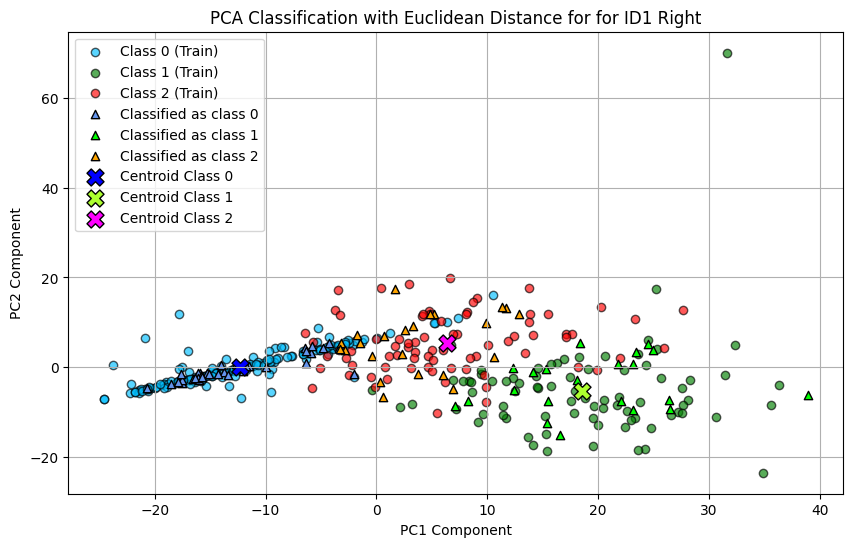

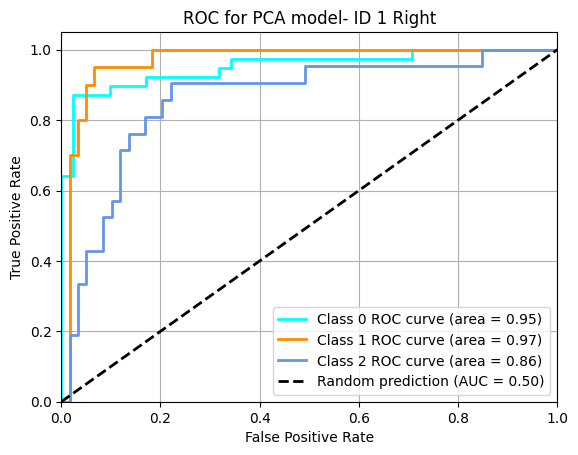

              precision    recall  f1-score   support

           0       0.94      0.87      0.91        39
           1       0.86      0.90      0.88        20
           2       0.70      0.76      0.73        21

    accuracy                           0.85        80
   macro avg       0.83      0.84      0.84        80
weighted avg       0.86      0.85      0.85        80



In [72]:
id1_X_train_pca, id1_pca_centroids, id1_pca_y_score, id1_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1 Right')
#Classification Report
print(classification_report(y_test, id1_pca_y_class_score))

LDA

Training time: 265.7461 ms
Testing/prediction time: 2.0027 ms
Accuracy: 42.50%


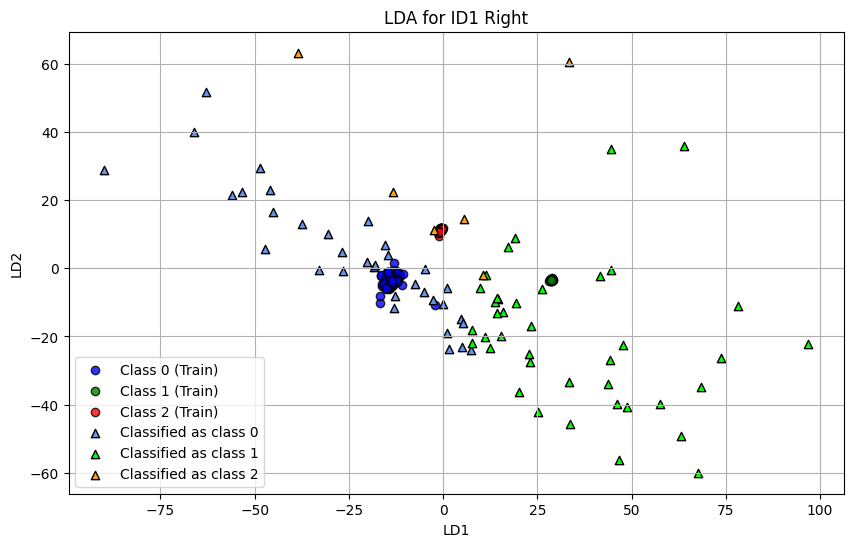

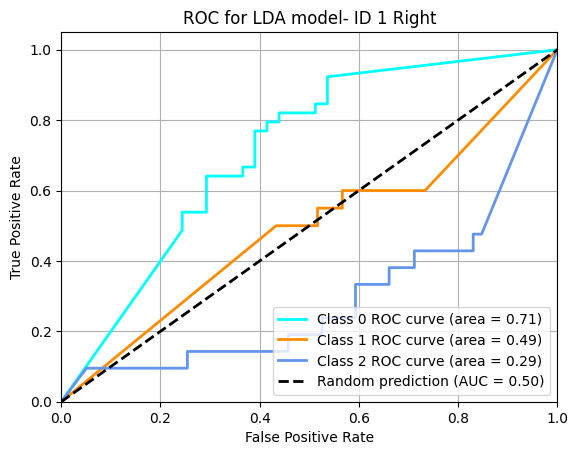

              precision    recall  f1-score   support

           0       0.65      0.56      0.60        39
           1       0.25      0.50      0.33        20
           2       0.33      0.10      0.15        21

    accuracy                           0.42        80
   macro avg       0.41      0.39      0.36        80
weighted avg       0.47      0.42      0.42        80



In [73]:
#Training the model and plotting the predictions
id1_lda_result, id1_lda_X_lda, id1_lda_y_score, id1_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 Right')

#Classification Report
print(classification_report(y_test, id1_lda_y_class_score))

QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 283.6900 ms
Testing/prediction time: 20.3679 ms
Accuracy: 70.00%


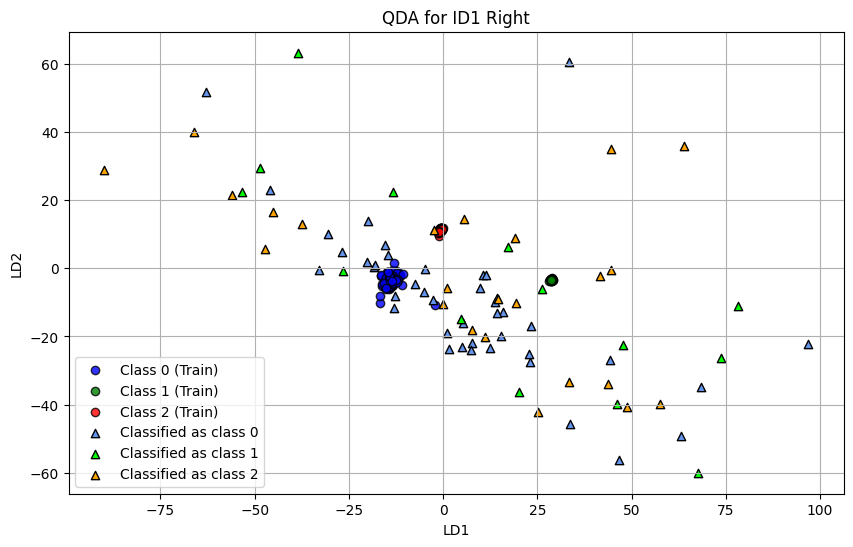

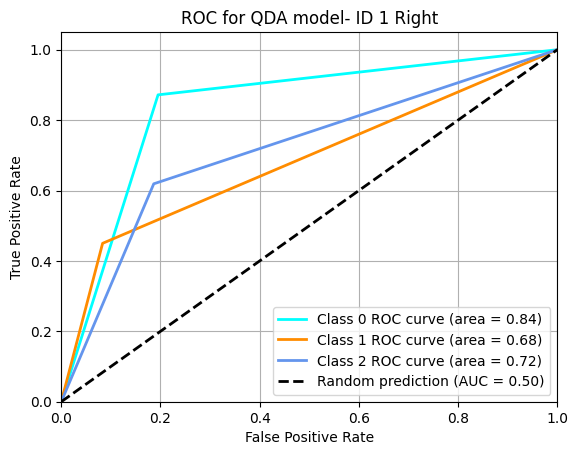

              precision    recall  f1-score   support

           0       0.81      0.87      0.84        39
           1       0.64      0.45      0.53        20
           2       0.54      0.62      0.58        21

    accuracy                           0.70        80
   macro avg       0.66      0.65      0.65        80
weighted avg       0.70      0.70      0.69        80



In [74]:
#Training the model and plotting the predictions
id1_qda_result, id1_qda_X_qda, id1_qda_y_score, id1_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 Right')

#Classification Report
print(classification_report(y_test, id1_qda_y_class_score))

PLS

Training time: 14.8644 ms
Testing/prediction time: 3.1583 ms


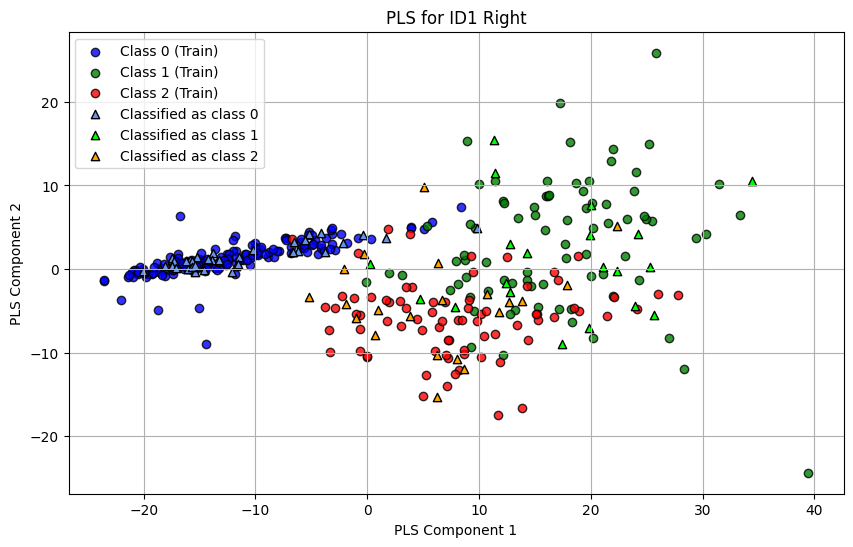

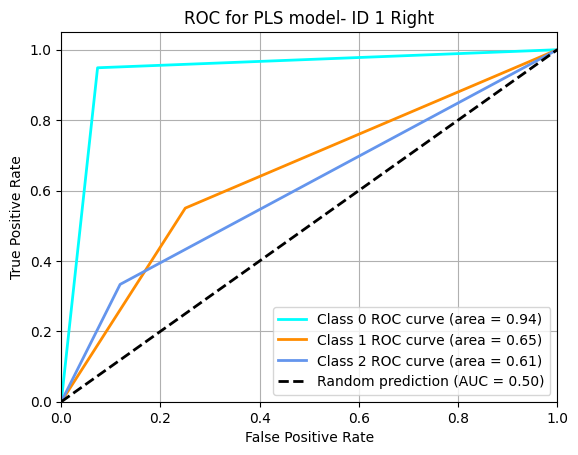

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        39
           1       0.42      0.55      0.48        20
           2       0.50      0.33      0.40        21

    accuracy                           0.69        80
   macro avg       0.62      0.61      0.60        80
weighted avg       0.69      0.69      0.68        80



In [75]:
#Training the model and plotting the predictions
id1_pls_result, id1_pls_X_pls, id1_pls_y_score, id1_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 Right')

#Unbinarizing the data
id1_pls_y_class_score = np.argmax(np.array(id1_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_pls_y_class_score))

SVM

Training time: 221.8935 ms
Testing/prediction time: 36.7124 ms
Accuracy: 92.50%


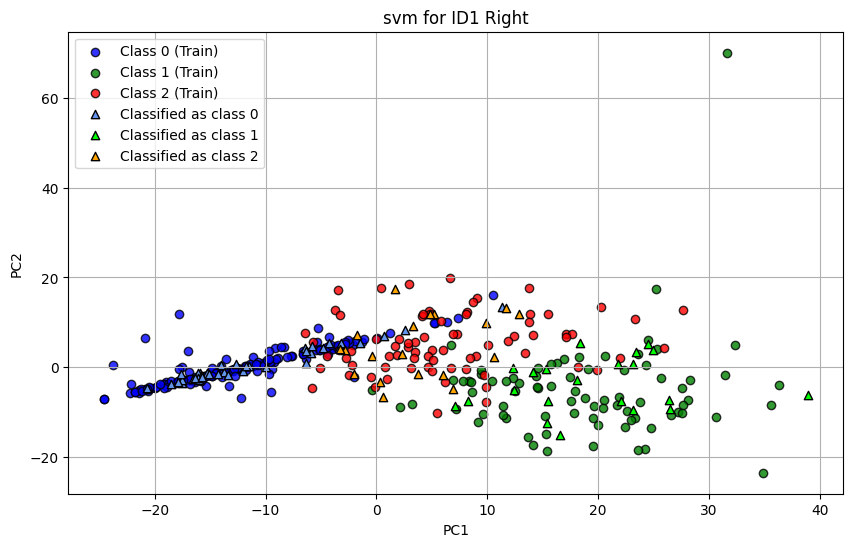

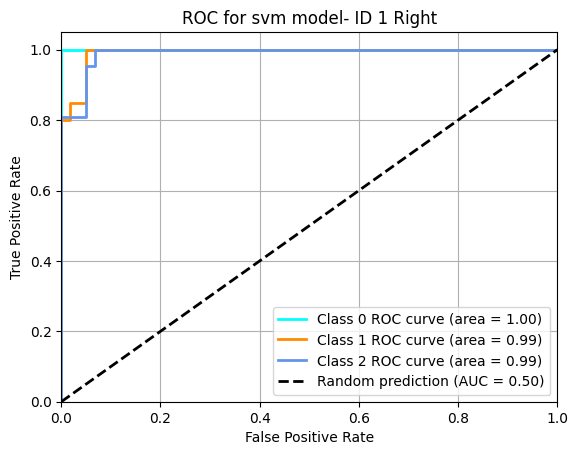

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        39
           1       0.86      0.90      0.88        20
           2       0.89      0.81      0.85        21

    accuracy                           0.93        80
   macro avg       0.91      0.90      0.91        80
weighted avg       0.92      0.93      0.92        80



In [76]:
#Training the model and plotting the predictions
id1_svm_result, id1_svm_X_svm, id1_svm_y_score, id1_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 Right')

#Classification Report
print(classification_report(y_test, id1_svm_y_class_score))

ANN

Training time: 6602.3612 ms
3/3 [==============================] - 0s 6ms/step
Testing/prediction time: 219.5709 ms


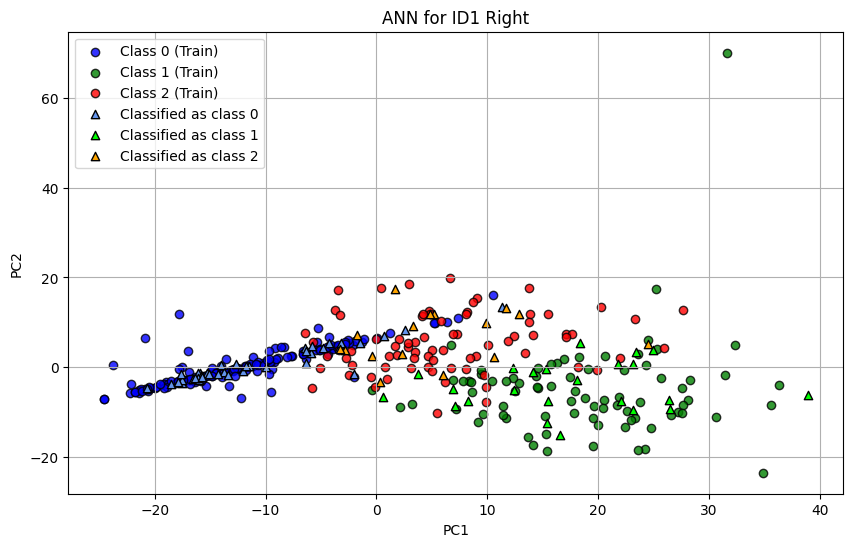

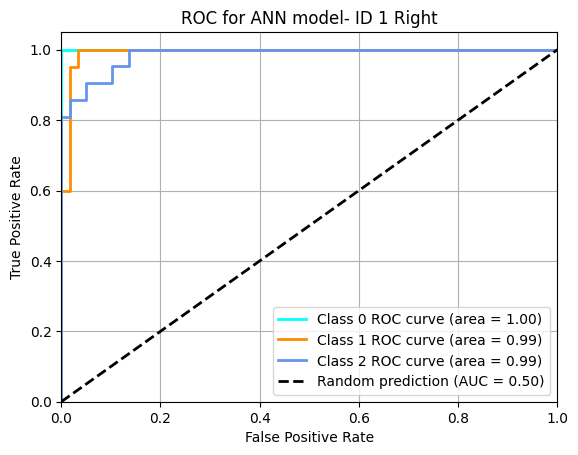

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        39
           1       0.87      1.00      0.93        20
           2       1.00      0.76      0.86        21

    accuracy                           0.94        80
   macro avg       0.94      0.92      0.92        80
weighted avg       0.94      0.94      0.93        80



In [77]:
id1_ann_model, id1_ann_y_score, id1_ann_y_class_score, id1_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title='ANN for ID1 Right')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 1 Right')

#Classification Report
print(classification_report(y_test, id1_ann_y_class_score))


### RAW (Left)

In [62]:
# Biceps Femoral
bf_combined = pd.read_csv('/content/ID1-RAW-BF-Esquerdo-arquivo_combinado.txt.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf_combined = pd.read_csv('/content/ID1-RAW-RF-Esquerdo-arquivo_combinado.txt', delimiter = '\t')


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_df = pd.DataFrame(dados)


# Filtrando as linhas onde 'Sinal' é um array vazio
id1_df = id1_df[id1_df['Sinal'].apply(lambda x: len(x) != 0)]

id1_df

,Label,Sinal,Classe
1,BF_Contraction_number_1,"[19.343751819200406, 97.95624818079932, 195.71...",1
2,BF_Contraction_number_2,"[122.39624818079938, 34.426248180799575, 4.683...",1
3,BF_Contraction_number_3,"[43.78375181920046, 63.74624818079974, 132.176...",1
4,BF_Contraction_number_4,"[39.306248180799685, 127.2862481807997, 176.16...",1
5,BF_Contraction_number_5,"[9.986248180799521, 34.00375181920026, 87.7637...",1
...,...,...,...
395,RF_BaseLine_number_97,"[28.26159162769136, 28.26159162769136, 18.4915...",0
396,RF_BaseLine_number_98,"[25.498408372308404, 20.618408372308295, 8.711...",0
397,RF_BaseLine_number_99,"[13.601591627691505, 5.948408372308222, 25.498...",0
398,RF_BaseLine_number_100,"[28.26159162769136, 23.371591627691487, 23.371...",0


Aplying the models on the data

In [63]:
#Shuffling the data
X = np.array(id1_df['Sinal'].tolist())
y = np.array(id1_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 48.8818 ms
Testing/prediction time: 1.4474 ms


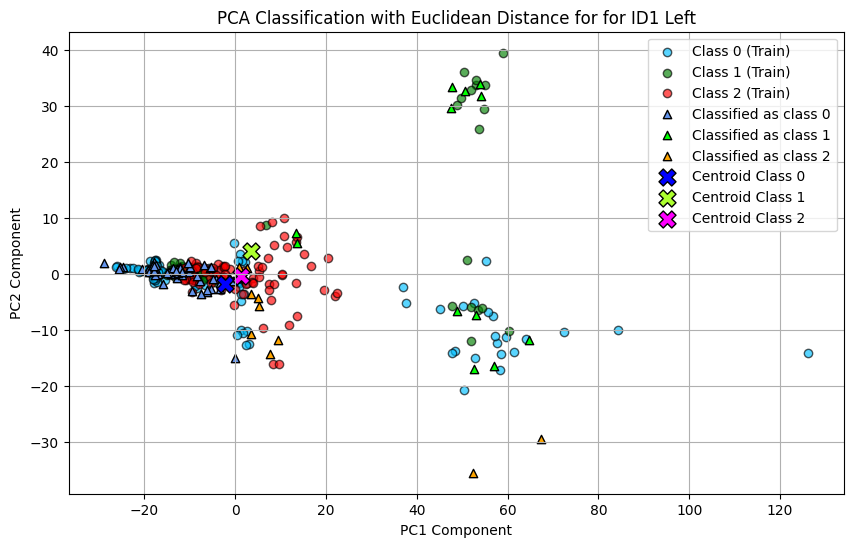

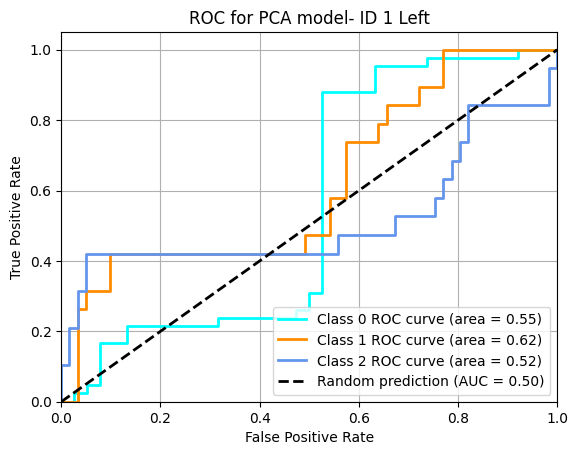

              precision    recall  f1-score   support

           0       0.64      0.86      0.73        42
           1       0.50      0.32      0.39        19
           2       0.67      0.42      0.52        19

    accuracy                           0.62        80
   macro avg       0.60      0.53      0.55        80
weighted avg       0.61      0.62      0.60        80



In [64]:
id1_X_train_pca, id1_pca_centroids, id1_pca_y_score, id1_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1 Left')
#Classification Report
print(classification_report(y_test, id1_pca_y_class_score))

LDA

Training time: 387.9807 ms
Testing/prediction time: 2.1045 ms
Accuracy: 46.25%


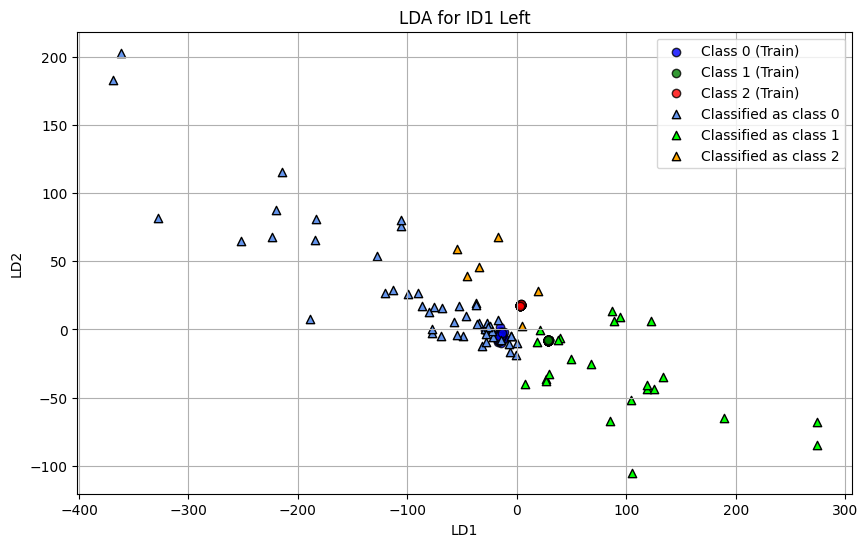

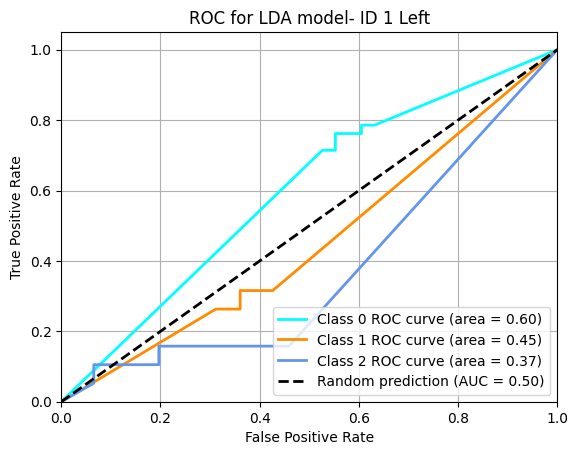

              precision    recall  f1-score   support

           0       0.60      0.71      0.65        42
           1       0.21      0.26      0.23        19
           2       0.33      0.11      0.16        19

    accuracy                           0.46        80
   macro avg       0.38      0.36      0.35        80
weighted avg       0.44      0.46      0.44        80



In [65]:
#Training the model and plotting the predictions
id1_lda_result, id1_lda_X_lda, id1_lda_y_score, id1_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 Left')

#Classification Report
print(classification_report(y_test, id1_lda_y_class_score))

QDA

Training time: 135.5054 ms
Testing/prediction time: 18.2171 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 52.50%


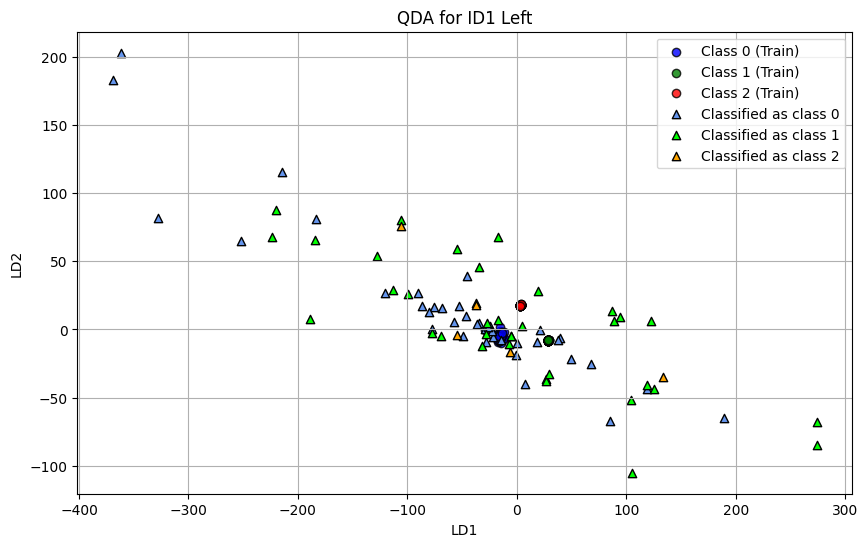

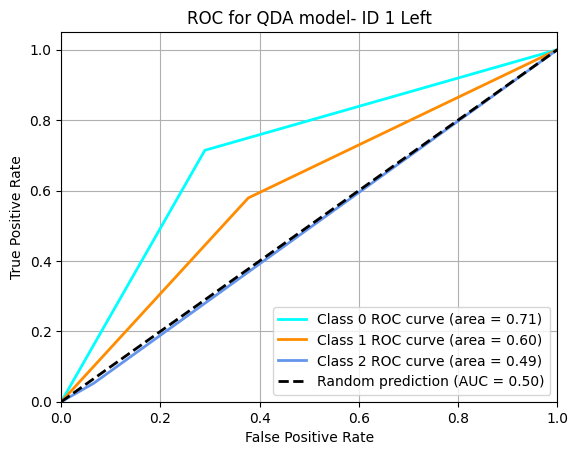

              precision    recall  f1-score   support

           0       0.73      0.71      0.72        42
           1       0.32      0.58      0.42        19
           2       0.20      0.05      0.08        19

    accuracy                           0.53        80
   macro avg       0.42      0.45      0.41        80
weighted avg       0.51      0.53      0.50        80



In [66]:
#Training the model and plotting the predictions
id1_qda_result, id1_qda_X_qda, id1_qda_y_score, id1_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 Left')

#Classification Report
print(classification_report(y_test, id1_qda_y_class_score))

PLS

Training time: 41.9114 ms
Testing/prediction time: 10.3049 ms


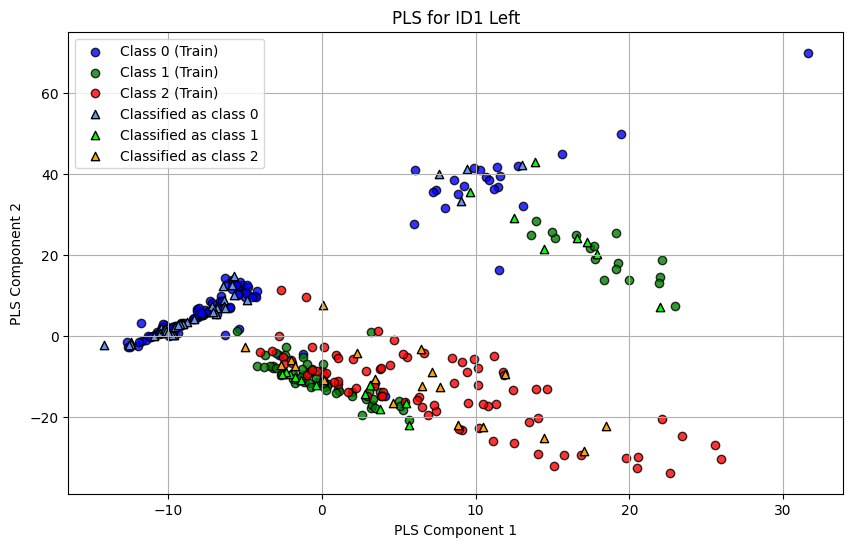

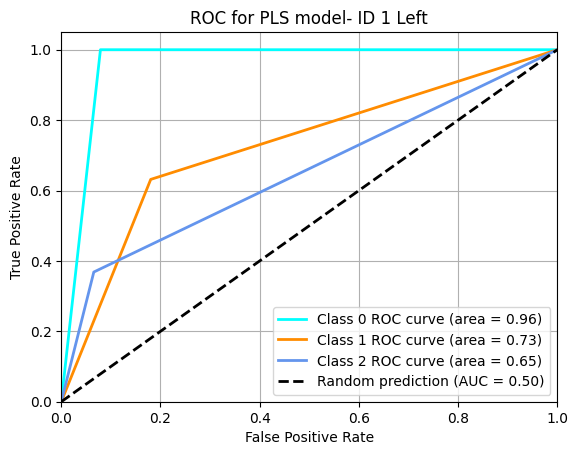

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        42
           1       0.52      0.63      0.57        19
           2       0.64      0.37      0.47        19

    accuracy                           0.76        80
   macro avg       0.69      0.67      0.66        80
weighted avg       0.75      0.76      0.75        80



In [67]:
#Training the model and plotting the predictions
id1_pls_result, id1_pls_X_pls, id1_pls_y_score, id1_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 Left')

#Unbinarizing the data
id1_pls_y_class_score = np.argmax(np.array(id1_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_pls_y_class_score))

SVM

Training time: 404.1393 ms
Testing/prediction time: 40.2591 ms
Accuracy: 92.50%


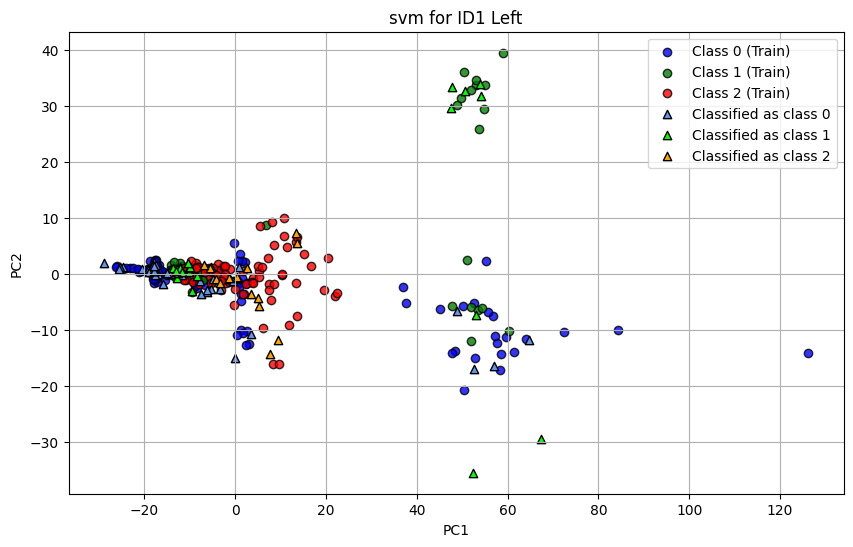

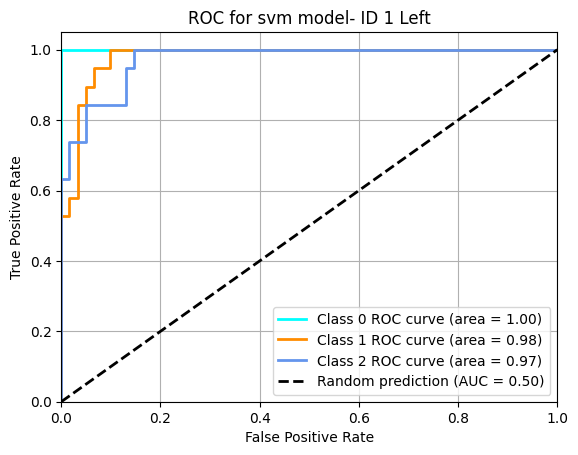

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        42
           1       0.82      0.95      0.88        19
           2       0.93      0.74      0.82        19

    accuracy                           0.93        80
   macro avg       0.91      0.89      0.90        80
weighted avg       0.93      0.93      0.92        80



In [68]:
#Training the model and plotting the predictions
id1_svm_result, id1_svm_X_svm, id1_svm_y_score, id1_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 Left')

#Classification Report
print(classification_report(y_test, id1_svm_y_class_score))

ANN

Training time: 6867.9886 ms
3/3 [==============================] - 0s 5ms/step
Testing/prediction time: 464.0582 ms


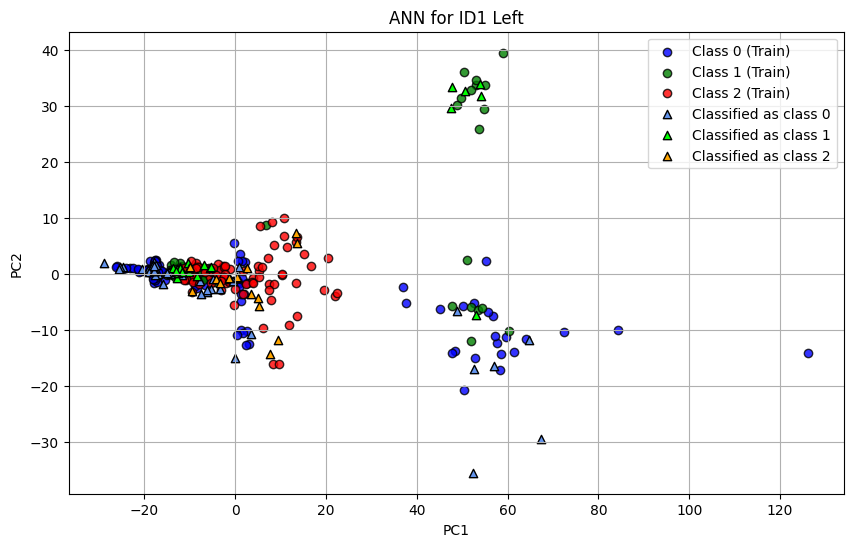

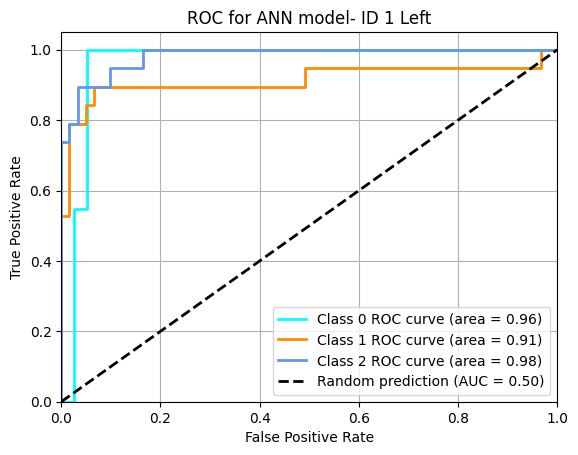

              precision    recall  f1-score   support

           0       0.93      1.00      0.97        42
           1       0.84      0.84      0.84        19
           2       0.94      0.79      0.86        19

    accuracy                           0.91        80
   macro avg       0.90      0.88      0.89        80
weighted avg       0.91      0.91      0.91        80



In [69]:
id1_ann_model, id1_ann_y_score, id1_ann_y_class_score, id1_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ANN for ID1 Left')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 1 Left')

#Classification Report
print(classification_report(y_test, id1_ann_y_class_score))


## Fazendo com os dados de 50 repetições seguidas (2ªGravação)

### RAW (Right) com os dados de um dia só

In [88]:
#Biceps femoral

bf = pd.read_csv('/content/RAW-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/RAW-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_df = pd.DataFrame(dados)
id1_50_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[2.433924404825575, 21.99392440482552, 21.9939...",1
1,BF_Contraction_number_1,"[75.76607559517424, 41.54607559517444, 17.1160...",1
2,BF_Contraction_number_2,"[7.336075595174407, 17.116075595174152, 26.886...",1
3,BF_Contraction_number_3,"[65.9860755951745, 61.09607559517417, 90.42607...",1
4,BF_Contraction_number_4,"[26.886075595174134, 21.99607559517426, 12.226...",1
...,...,...,...
197,RF_BaseLine_number_46,"[21.179543885037674, 11.399543885037929, 11.39...",0
198,RF_BaseLine_number_47,"[76.58045611496209, 61.91045611496202, 37.4804...",0
199,RF_BaseLine_number_48,"[71.69045611496222, 86.35045611496207, 76.5804...",0
200,RF_BaseLine_number_49,"[13.040456114962126, 27.70045611496198, 27.700...",0


Applying the models

In [89]:
#Shuffling the data
X = np.array(id1_50_df['Sinal'].tolist())
y = np.array(id1_50_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)


#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 95.2086 ms
Testing/prediction time: 8.6241 ms


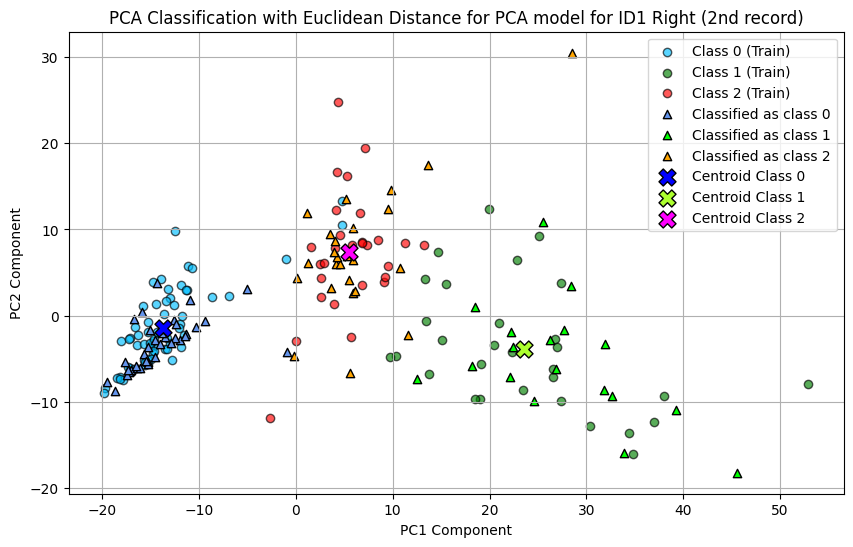

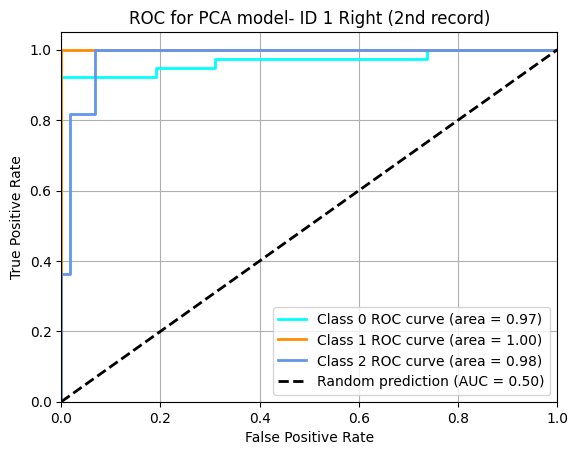

              precision    recall  f1-score   support

           0       0.95      0.92      0.94        39
           1       1.00      0.90      0.95        20
           2       0.80      0.91      0.85        22

    accuracy                           0.91        81
   macro avg       0.92      0.91      0.91        81
weighted avg       0.92      0.91      0.92        81



In [90]:
id1_50_X_train_pca, id1_50_pca_centroids, id1_50_pca_y_score, id1_50_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PCA model for ID1 Right (2nd record)')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1 Right (2nd record)')
#Classification Report
print(classification_report(y_test, id1_50_pca_y_class_score))

LDA

Training time: 58.3134 ms
Testing/prediction time: 1.9994 ms
Accuracy: 87.65%


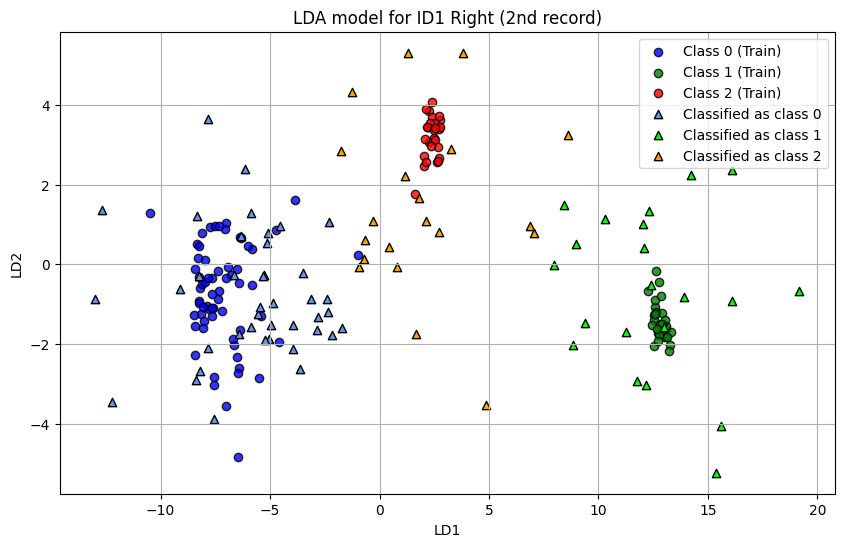

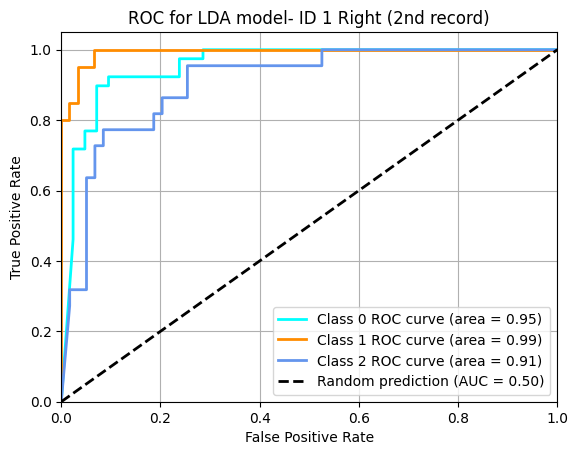

              precision    recall  f1-score   support

           0       0.90      0.92      0.91        39
           1       0.90      0.95      0.93        20
           2       0.80      0.73      0.76        22

    accuracy                           0.88        81
   macro avg       0.87      0.87      0.87        81
weighted avg       0.87      0.88      0.87        81



In [91]:
#LDA

#Training the model and plotting the predictions
id1_50_lda_result, id1_50_lda_X_lda, id1_50_lda_y_score, id1_50_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA model for ID1 Right (2nd record)')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 Right (2nd record)')

#Classification Report
print(classification_report(y_test, id1_50_lda_y_class_score))

QDA

Training time: 37.3292 ms
Testing/prediction time: 13.2358 ms
Accuracy: 43.21%


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


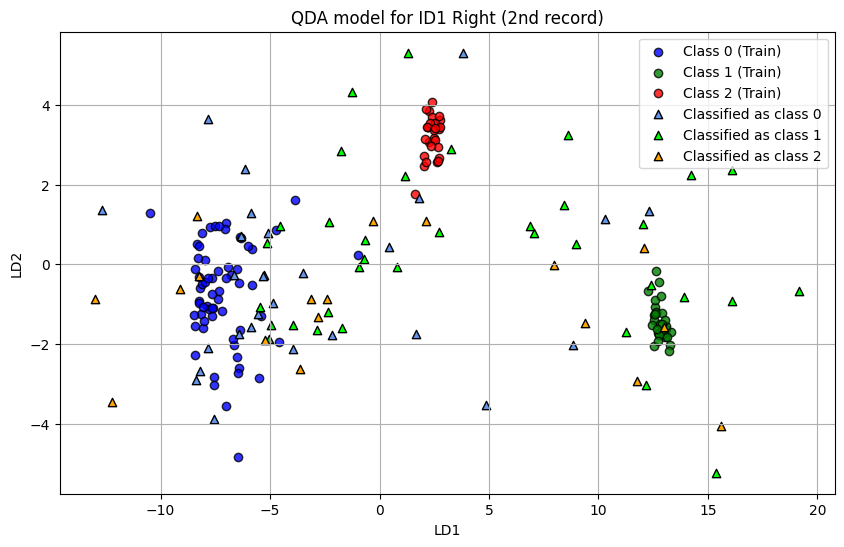

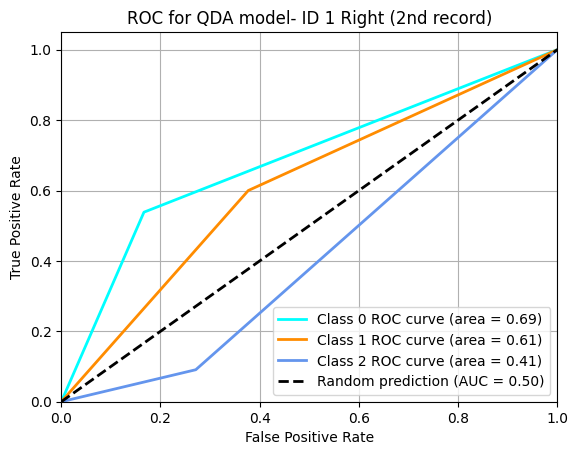

              precision    recall  f1-score   support

           0       0.75      0.54      0.63        39
           1       0.34      0.60      0.44        20
           2       0.11      0.09      0.10        22

    accuracy                           0.43        81
   macro avg       0.40      0.41      0.39        81
weighted avg       0.48      0.43      0.44        81



In [92]:
#QDA
#Training the model and plotting the predictions
id1_50_qda_result, id1_50_qda_X_qda, id1_50_qda_y_score, id1_50_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA model for ID1 Right (2nd record)')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 Right (2nd record)')

#Classification Report
print(classification_report(y_test, id1_50_qda_y_class_score))

PLS

Training time: 26.1281 ms
Testing/prediction time: 6.0723 ms


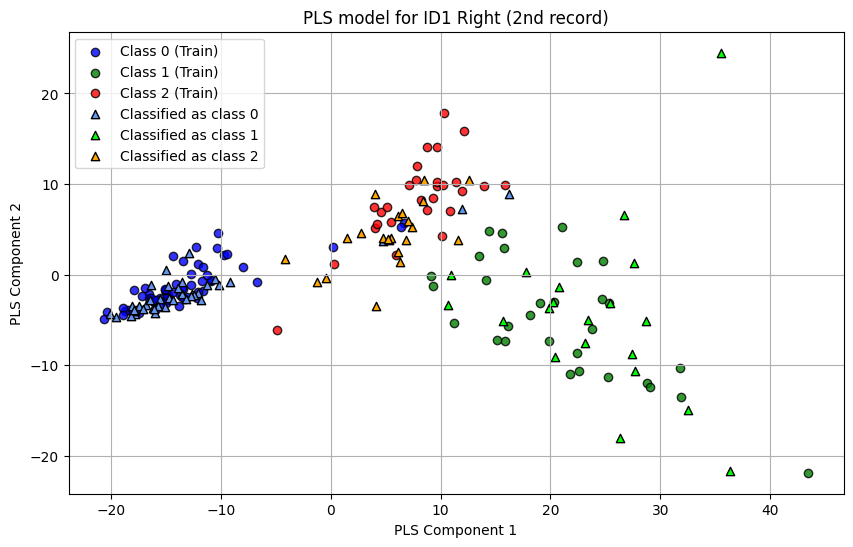

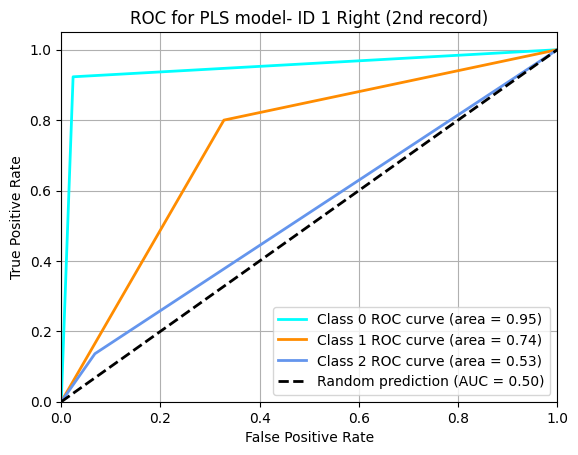

              precision    recall  f1-score   support

           0       0.95      0.92      0.94        39
           1       0.44      0.80      0.57        20
           2       0.43      0.14      0.21        22

    accuracy                           0.68        81
   macro avg       0.61      0.62      0.57        81
weighted avg       0.68      0.68      0.65        81



In [93]:
#PLS

#Training the model and plotting the predictions
id1_50_pls_result, id1_50_pls_X_pls, id1_50_pls_y_score, id1_50_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS model for ID1 Right (2nd record)')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 Right (2nd record)')

#Unbinarizing the data
id1_50_pls_y_class_score = np.argmax(np.array(id1_50_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_50_pls_y_class_score))

SVM

Training time: 66.6652 ms
Testing/prediction time: 17.8292 ms
Accuracy: 93.83%


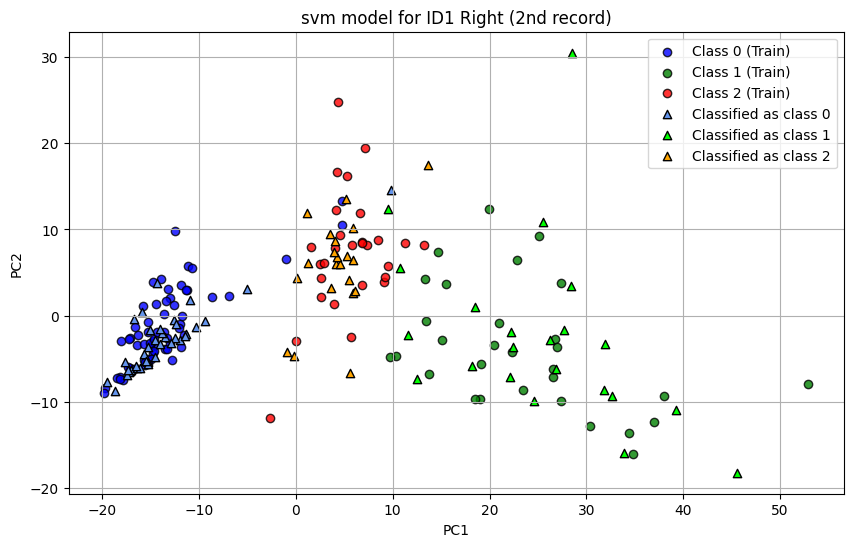

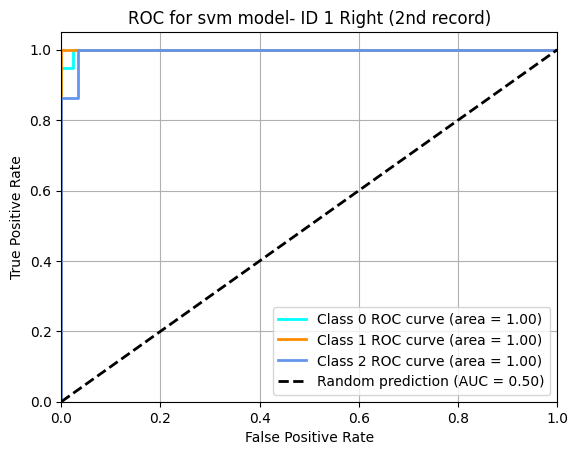

              precision    recall  f1-score   support

           0       0.97      0.95      0.96        39
           1       0.91      1.00      0.95        20
           2       0.90      0.86      0.88        22

    accuracy                           0.94        81
   macro avg       0.93      0.94      0.93        81
weighted avg       0.94      0.94      0.94        81



In [94]:
#SVM

#Training the model and plotting the predictions
id1_50_svm_result, id1_50_svm_X_svm, id1_50_svm_y_score, id1_50_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm model for ID1 Right (2nd record)')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 Right (2nd record)')

#Classification Report
print(classification_report(y_test, id1_50_svm_y_class_score))

ANN

Training time: 4876.0347 ms


3/3 [==============================] - 0s 5ms/step
Testing/prediction time: 349.1709 ms


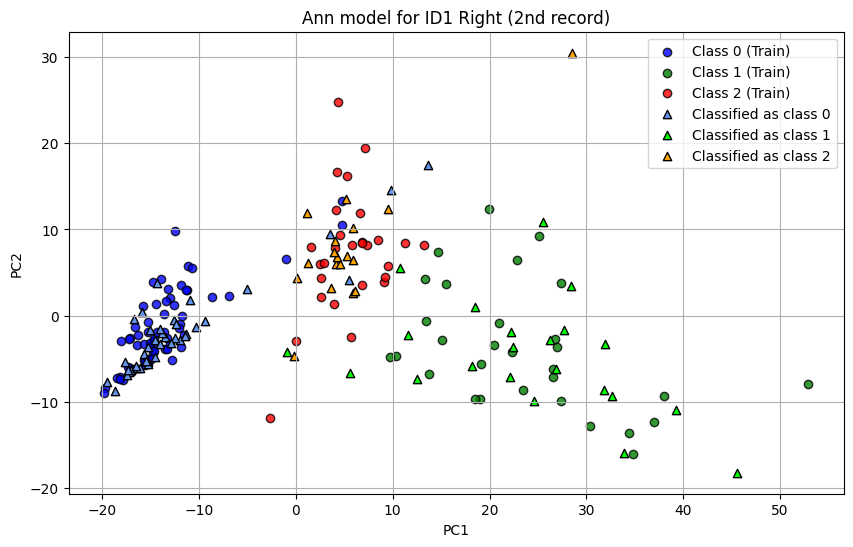

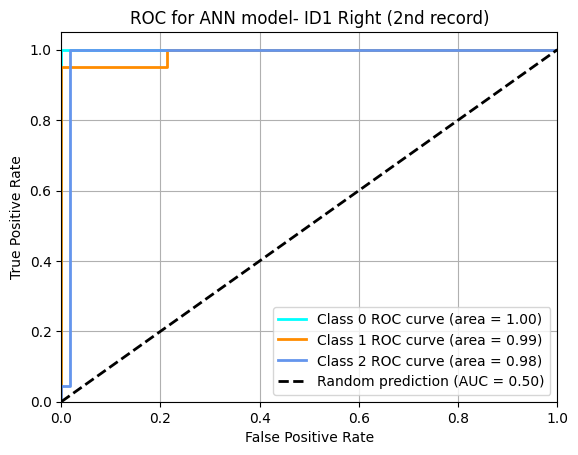

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        39
           1       0.86      0.95      0.90        20
           2       0.94      0.77      0.85        22

    accuracy                           0.93        81
   macro avg       0.92      0.91      0.91        81
weighted avg       0.93      0.93      0.92        81



In [95]:
#ANN

id1_50_ann_model, id1_50_ann_y_score, id1_50_ann_y_class_score, id1_50_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'Ann model for ID1 Right (2nd record)')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 Right (2nd record)')

#Classification Report
print(classification_report(y_test, id1_50_ann_y_class_score))

### RAW (Left) com os dados de um dia só

In [99]:
#Biceps femoral

bf = pd.read_csv('/content/RAW-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/RAW-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_df = pd.DataFrame(dados)

# Filtrando as linhas onde 'Sinal' é um array vazio
id1_50_df = id1_50_df[id1_50_df['Sinal'].apply(lambda x: len(x) != 0)]

id1_50_df

,Label,Sinal,Classe
1,BF_Contraction_number_1,"[22.82457903422346, 52.15457903422384, 57.0445...",1
2,BF_Contraction_number_2,"[42.37457903422364, 37.494579034223534, 32.604...",1
3,BF_Contraction_number_3,"[32.60457903422366, 37.494579034223534, 32.604...",1
4,BF_Contraction_number_4,"[22.82457903422346, 37.494579034223534, 47.264...",1
5,BF_Contraction_number_5,"[3.274579034223734, 1.605420965776375, 8.16457...",1
...,...,...,...
197,RF_BaseLine_number_46,"[5.334732603409975, 24.884732603410157, 39.554...",0
198,RF_BaseLine_number_47,"[23.985267396589734, 43.535267396589916, 23.98...",0
199,RF_BaseLine_number_48,"[4.435267396590007, 5.334732603409975, 5.33473...",0
200,RF_BaseLine_number_49,"[49.32473260341021, 34.66473260341036, 34.6647...",0


Applying the models

In [100]:
#Shuffling the data
X = np.array(id1_50_df['Sinal'].tolist())
y = np.array(id1_50_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)


#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA ( REFAZER AQUI PORQUE EU APERTEI SEM QUERER!!!)

In [ ]:
id1_50_X_train_pca, id1_50_pca_centroids, id1_50_pca_y_score, id1_50_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id1_50_pca_y_class_score))

LDA

Training time: 49.7956 ms
Testing/prediction time: 3.1455 ms
Accuracy: 82.72%


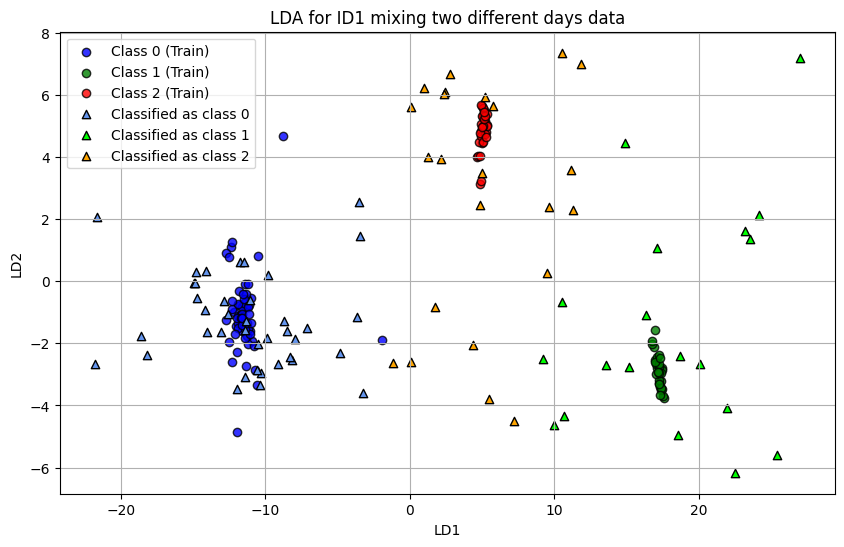

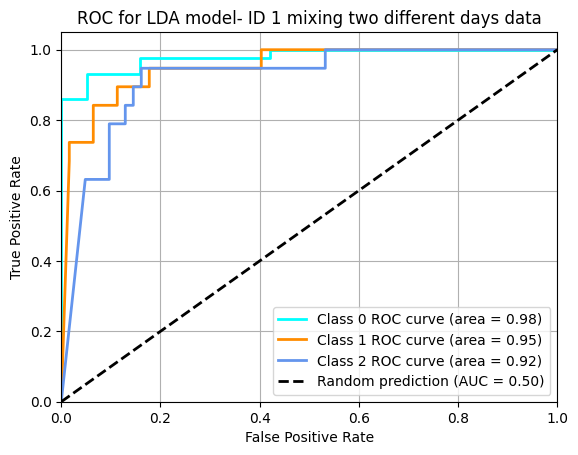

              precision    recall  f1-score   support

           0       0.95      0.86      0.90        43
           1       0.79      0.79      0.79        19
           2       0.65      0.79      0.71        19

    accuracy                           0.83        81
   macro avg       0.80      0.81      0.80        81
weighted avg       0.84      0.83      0.83        81



In [102]:
#LDA

#Training the model and plotting the predictions
id1_50_lda_result, id1_50_lda_X_lda, id1_50_lda_y_score, id1_50_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_50_lda_y_class_score))

QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 21.1880 ms
Testing/prediction time: 5.5144 ms
Accuracy: 48.15%


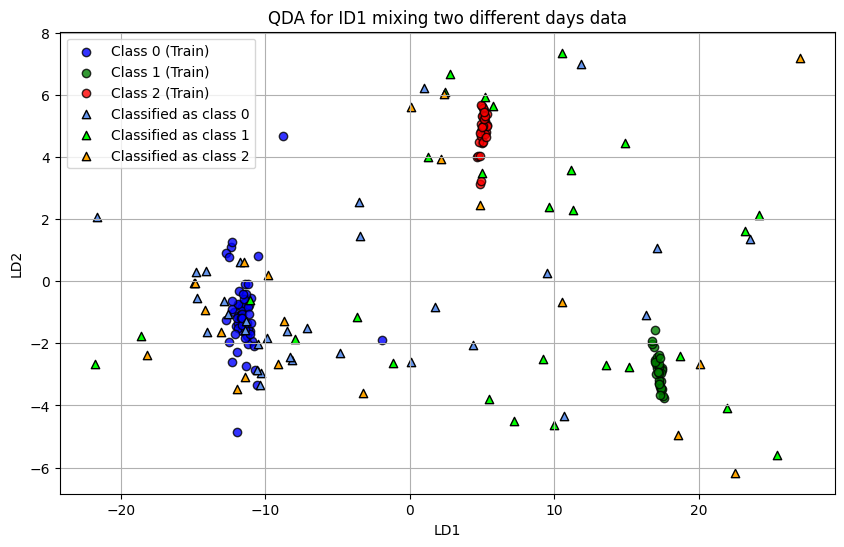

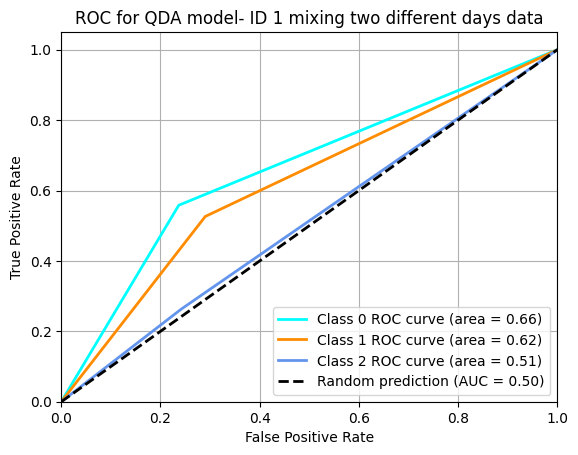

              precision    recall  f1-score   support

           0       0.73      0.56      0.63        43
           1       0.36      0.53      0.43        19
           2       0.25      0.26      0.26        19

    accuracy                           0.48        81
   macro avg       0.44      0.45      0.44        81
weighted avg       0.53      0.48      0.50        81



In [103]:
#QDA
#Training the model and plotting the predictions
id1_50_qda_result, id1_50_qda_X_qda, id1_50_qda_y_score, id1_50_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_50_qda_y_class_score))

PLS

Training time: 9.6135 ms
Testing/prediction time: 6.1953 ms


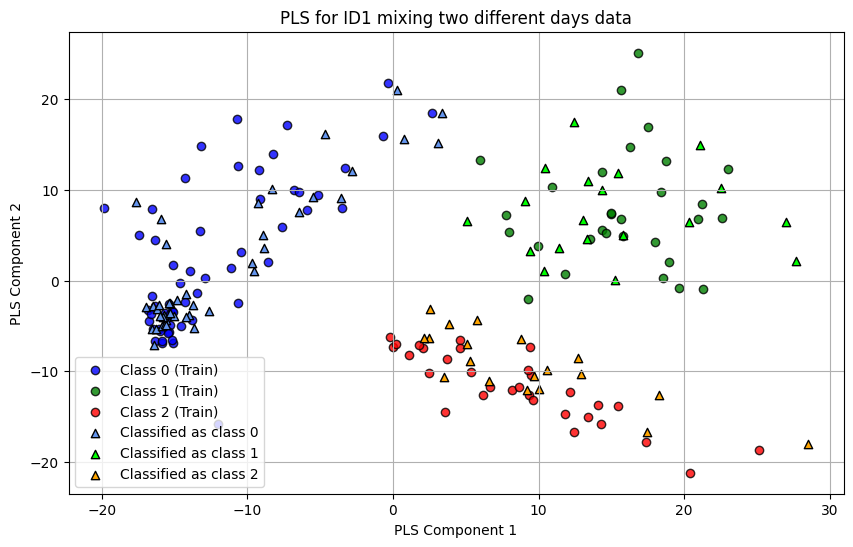

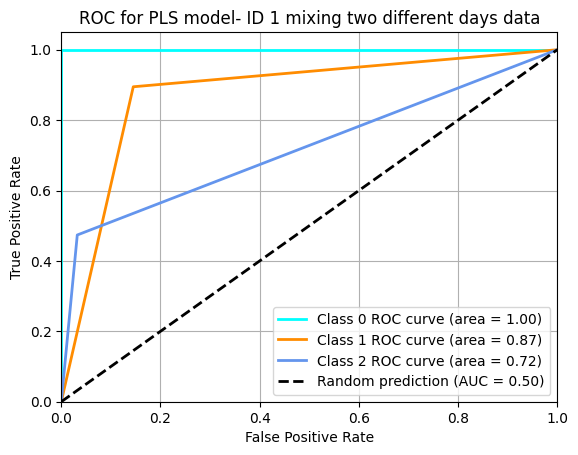

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        43
           1       0.65      0.89      0.76        19
           2       0.82      0.47      0.60        19

    accuracy                           0.85        81
   macro avg       0.82      0.79      0.78        81
weighted avg       0.86      0.85      0.84        81



In [104]:
#PLS

#Training the model and plotting the predictions
id1_50_pls_result, id1_50_pls_X_pls, id1_50_pls_y_score, id1_50_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 mixing two different days data')

#Unbinarizing the data
id1_50_pls_y_class_score = np.argmax(np.array(id1_50_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_50_pls_y_class_score))

SVM

Training time: 37.8673 ms
Testing/prediction time: 14.2622 ms
Accuracy: 98.77%


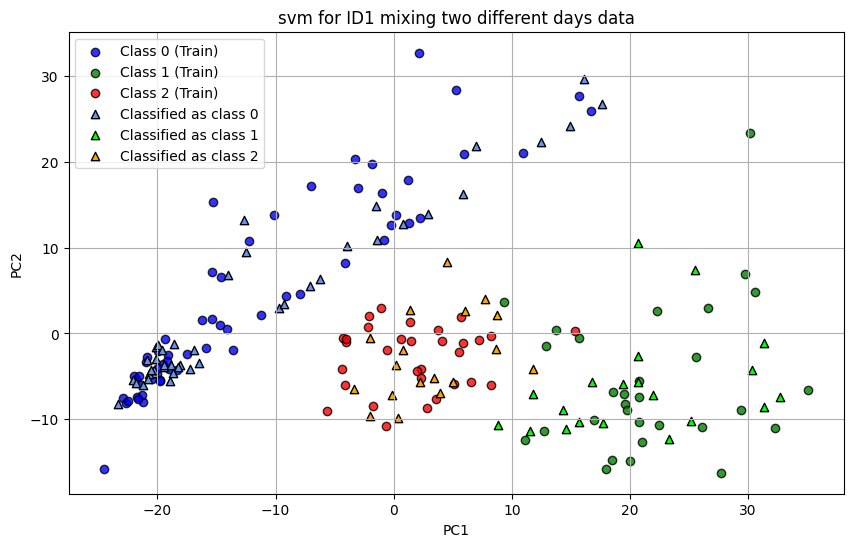

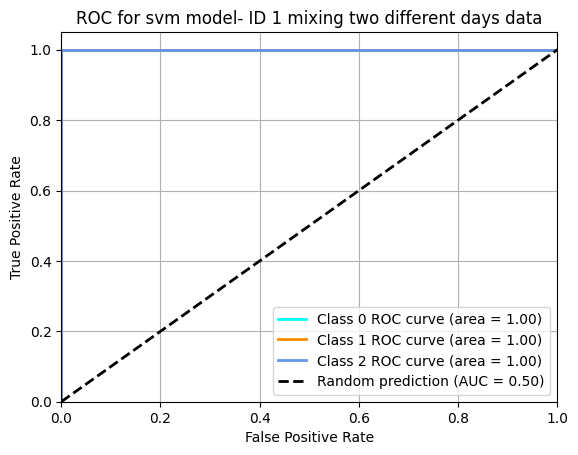

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        43
           1       0.95      1.00      0.97        19
           2       1.00      0.95      0.97        19

    accuracy                           0.99        81
   macro avg       0.98      0.98      0.98        81
weighted avg       0.99      0.99      0.99        81



In [105]:
#SVM

#Training the model and plotting the predictions
id1_50_svm_result, id1_50_svm_X_svm, id1_50_svm_y_score, id1_50_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_50_svm_y_class_score))



ANN

Training time: 2473.5107 ms
3/3 [==============================] - 0s 4ms/step
Testing/prediction time: 263.2930 ms


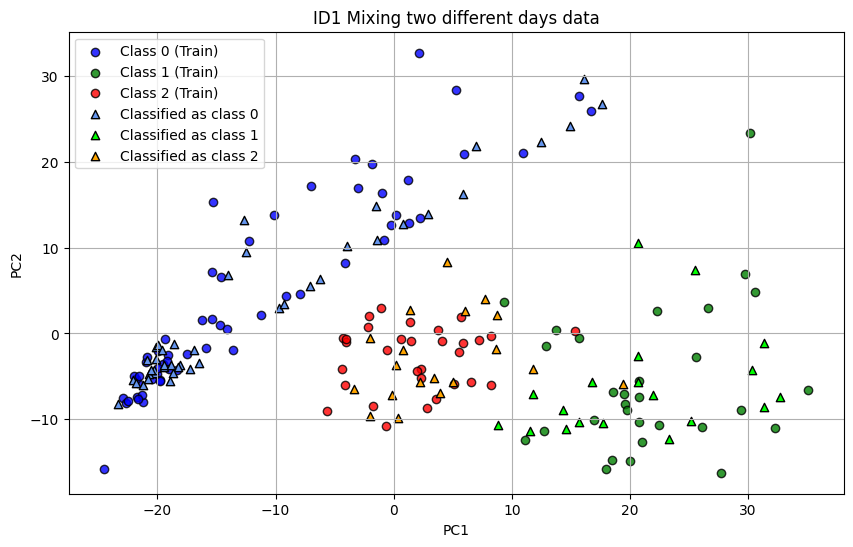

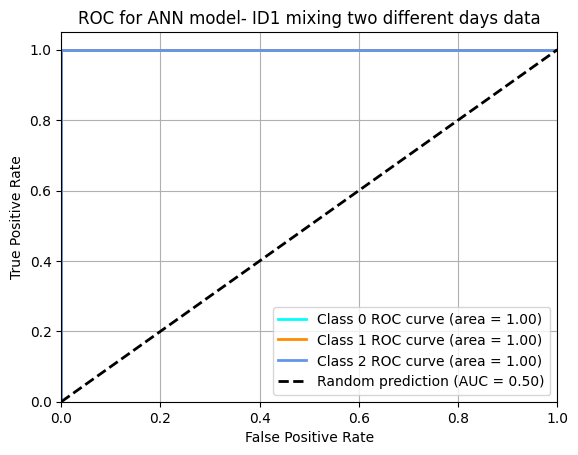

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        43
           1       1.00      1.00      1.00        19
           2       1.00      1.00      1.00        19

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [107]:
#ANN

id1_50_ann_model, id1_50_ann_y_score, id1_50_ann_y_class_score, id1_50_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ID1 Mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_50_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_50_ann_y_class_score))

### RAW (Right) com os dados misturados

In [109]:
#Biceps femoral

bf1 = pd.read_csv('/content/Dif-ID1-RAW1-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/RAW-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/Dif-ID1-RAW1-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/RAW-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
mixed_id1_df = pd.DataFrame(dados)
mixed_id1_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[20.362905039755788, 15.472905039755915, 20.36...",1
1,BF_Contraction_number_1,"[57.84709496024425, 33.407094960244194, 52.957...",1
2,BF_Contraction_number_2,"[57.84709496024425, 62.72709496024436, 23.6270...",1
3,BF_Contraction_number_3,"[48.0670949602445, 52.957094960244376, 52.9570...",1
4,BF_Contraction_number_4,"[52.957094960244376, 52.957094960244376, 62.72...",1
...,...,...,...
375,RF_BaseLine_number_85,"[24.10214782002504, 14.322147820025293, 14.322...",0
376,RF_BaseLine_number_86,"[73.65785217997473, 58.98785217997465, 34.5578...",0
377,RF_BaseLine_number_87,"[68.76785217997485, 83.4278521799747, 73.65785...",0
378,RF_BaseLine_number_88,"[10.117852179974761, 24.777852179974616, 24.77...",0


Applying the models

In [110]:
#Shuffling the data
X = np.array(mixed_id1_df['Sinal'].tolist())
y = np.array(mixed_id1_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 95.8824 ms
Testing/prediction time: 2.7335 ms


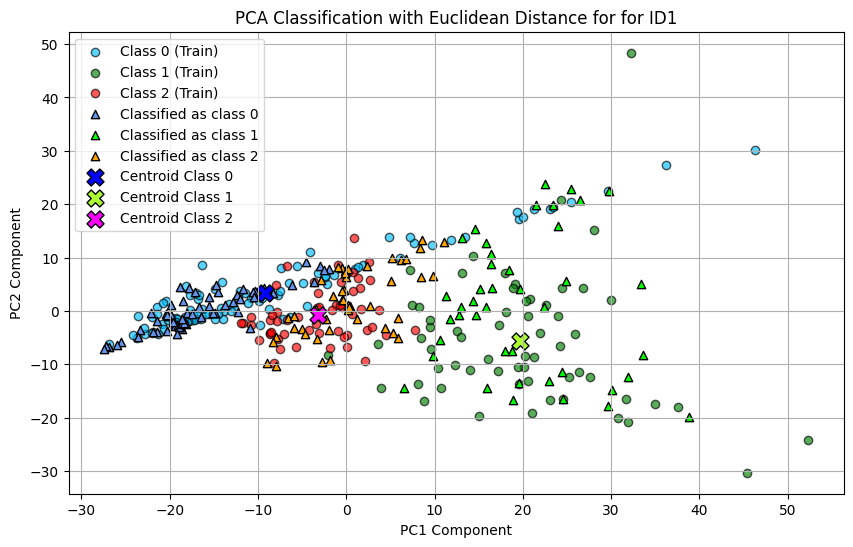

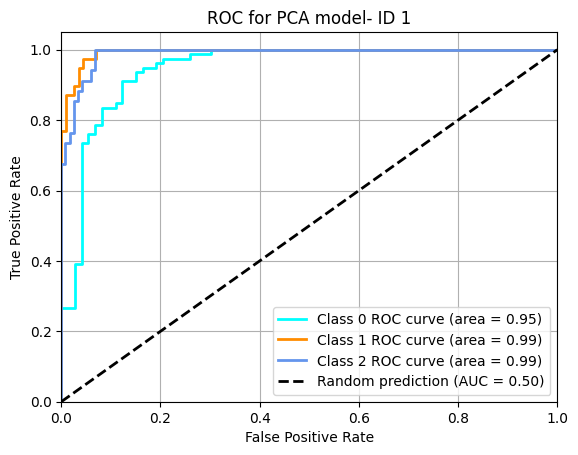

              precision    recall  f1-score   support

           0       0.95      0.76      0.85        79
           1       0.88      0.95      0.91        39
           2       0.66      0.91      0.77        34

    accuracy                           0.84       152
   macro avg       0.83      0.87      0.84       152
weighted avg       0.87      0.84      0.84       152



In [111]:
mixed_id1_X_train_pca, mixed_id1_pca_centroids, mixed_id1_pca_y_score, mixed_id1_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, mixed_id1_pca_y_class_score))

LDA

Training time: 140.7189 ms
Testing/prediction time: 12.0873 ms
Accuracy: 61.18%


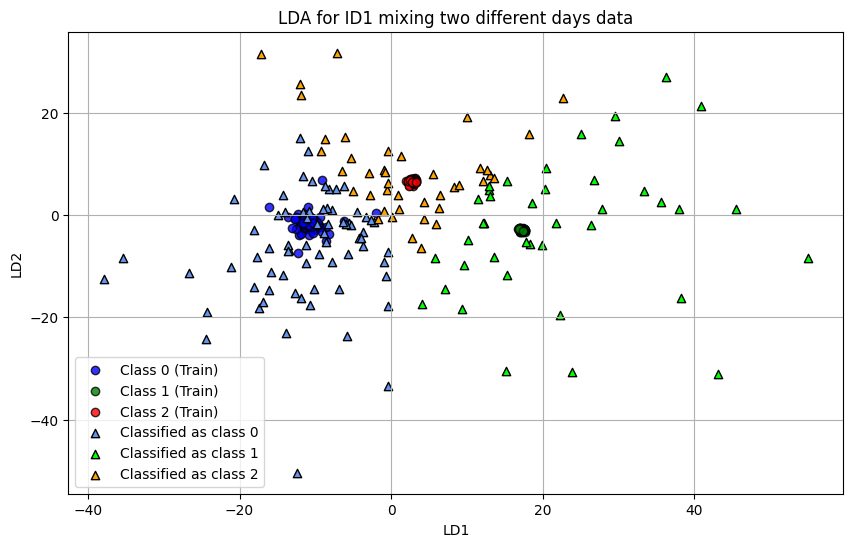

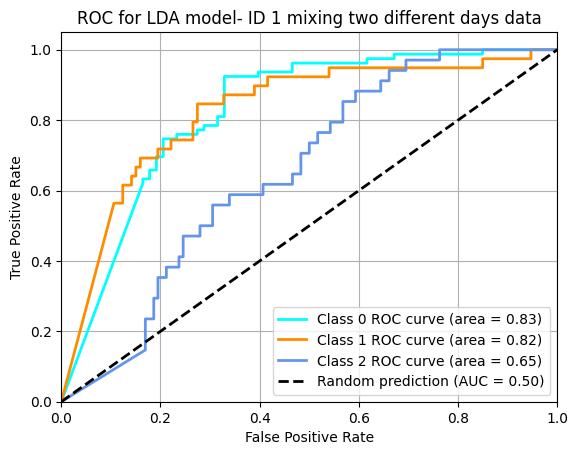

              precision    recall  f1-score   support

           0       0.79      0.71      0.75        79
           1       0.60      0.62      0.61        39
           2       0.32      0.38      0.35        34

    accuracy                           0.61       152
   macro avg       0.57      0.57      0.57       152
weighted avg       0.63      0.61      0.62       152



In [112]:
#Training the model and plotting the predictions
mixed_id1_lda_result, mixed_id1_lda_X_lda, mixed_id1_lda_y_score, mixed_id1_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_lda_y_class_score))


QDA

Training time: 90.0431 ms
Testing/prediction time: 28.0461 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 56.58%


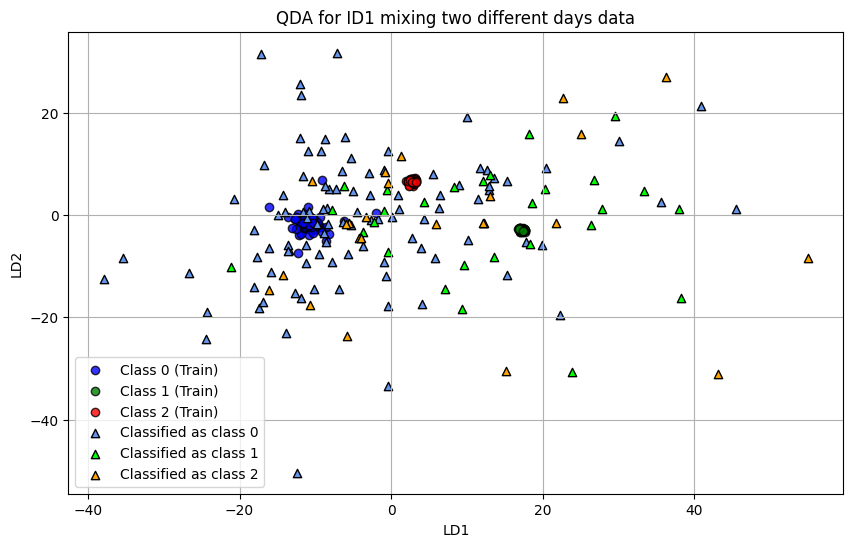

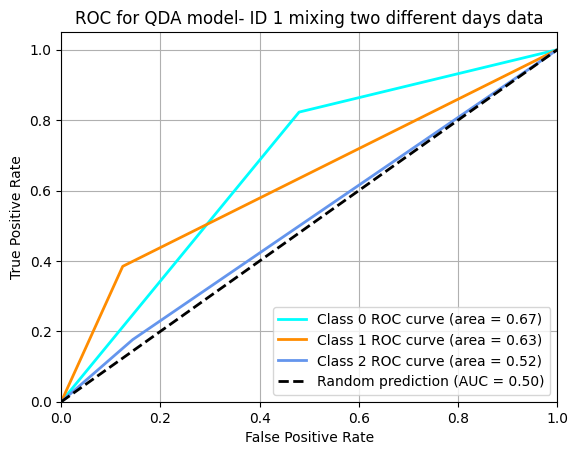

              precision    recall  f1-score   support

           0       0.65      0.82      0.73        79
           1       0.52      0.38      0.44        39
           2       0.26      0.18      0.21        34

    accuracy                           0.57       152
   macro avg       0.48      0.46      0.46       152
weighted avg       0.53      0.57      0.54       152



In [113]:
#Training the model and plotting the predictions
mixed_id1_qda_result, mixed_id1_qda_X_qda, mixed_id1_qda_y_score, mixed_id1_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_qda_y_class_score))


PLS

Training time: 13.1164 ms
Testing/prediction time: 3.9141 ms


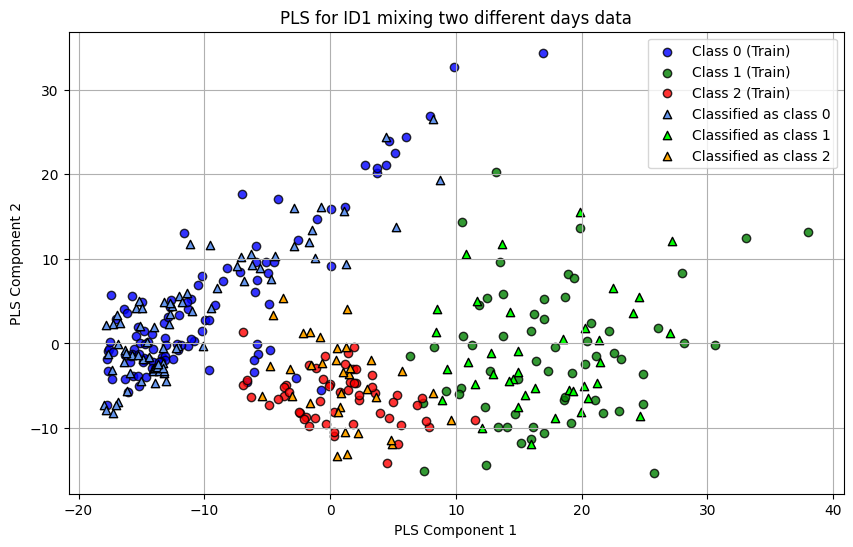

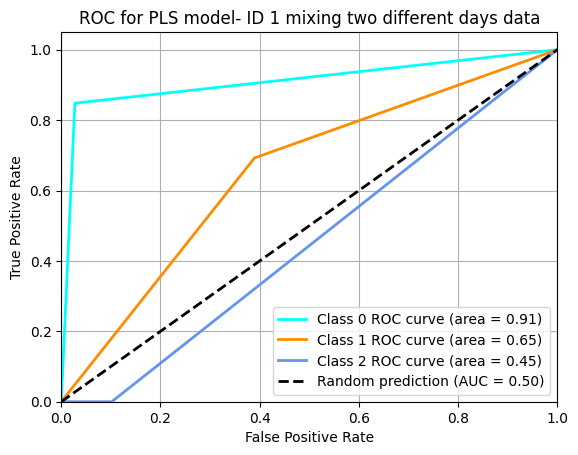

              precision    recall  f1-score   support

           0       0.97      0.85      0.91        79
           1       0.38      0.69      0.49        39
           2       0.00      0.00      0.00        34

    accuracy                           0.62       152
   macro avg       0.45      0.51      0.47       152
weighted avg       0.60      0.62      0.60       152



In [114]:
#Training the model and plotting the predictions
mixed_id1_pls_result, mixed_id1_pls_X_pls, mixed_id1_pls_y_score, mixed_id1_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 mixing two different days data')

#Unbinarizing the data
mixed_id1_pls_y_class_score = np.argmax(np.array(mixed_id1_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, mixed_id1_pls_y_class_score))


SVM

Training time: 103.6651 ms
Testing/prediction time: 63.6425 ms
Accuracy: 96.71%


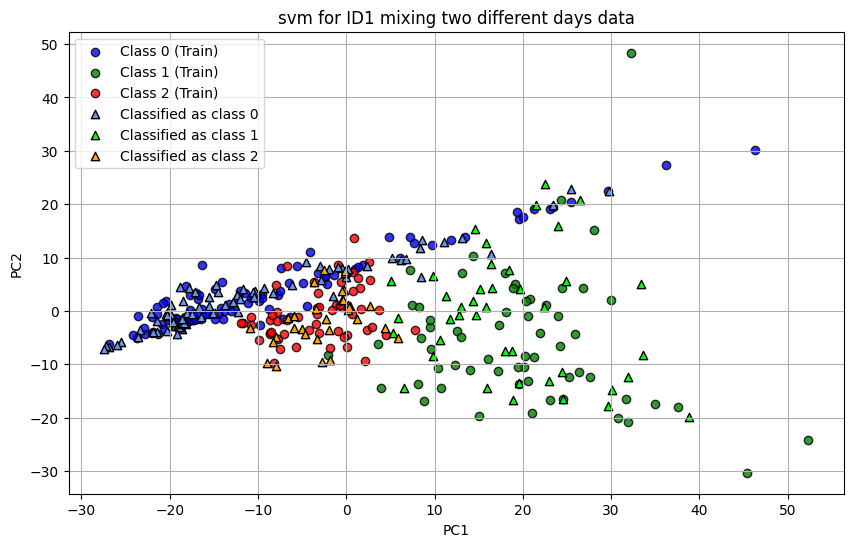

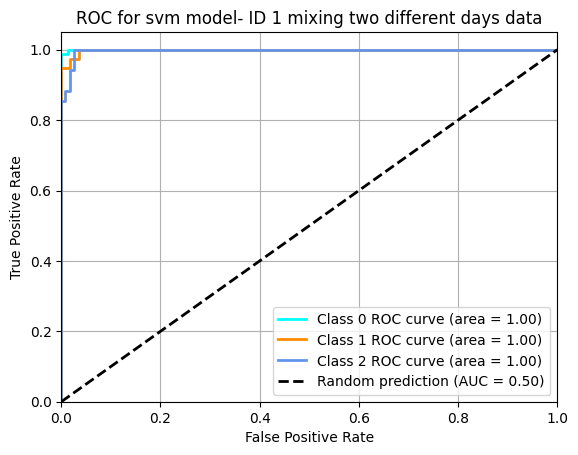

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        79
           1       0.93      0.97      0.95        39
           2       0.97      0.88      0.92        34

    accuracy                           0.97       152
   macro avg       0.96      0.95      0.96       152
weighted avg       0.97      0.97      0.97       152



In [115]:
#Training the model and plotting the predictions
mixed_id1_svm_result, mixed_id1_svm_X_svm, mixed_id1_svm_y_score, mixed_id1_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_svm_y_class_score))

ANN

Training time: 3537.3716 ms
5/5 [==============================] - 0s 3ms/step
Testing/prediction time: 144.2852 ms


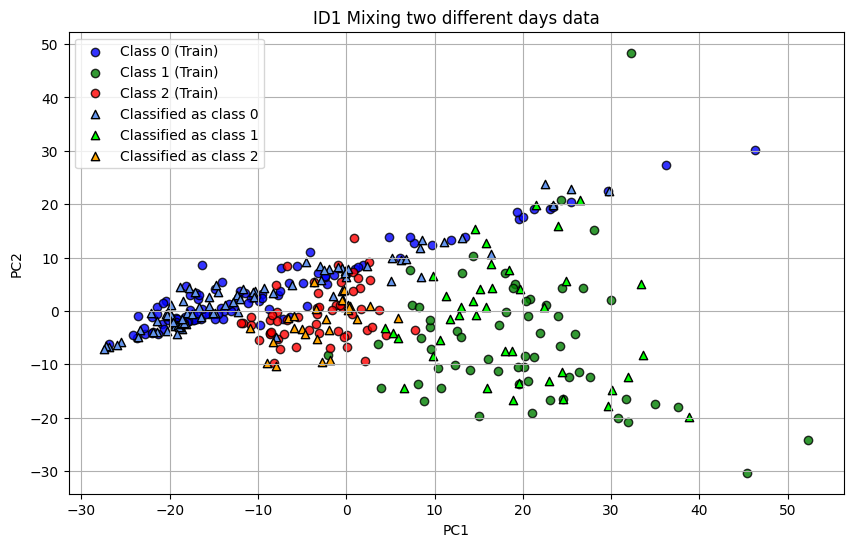

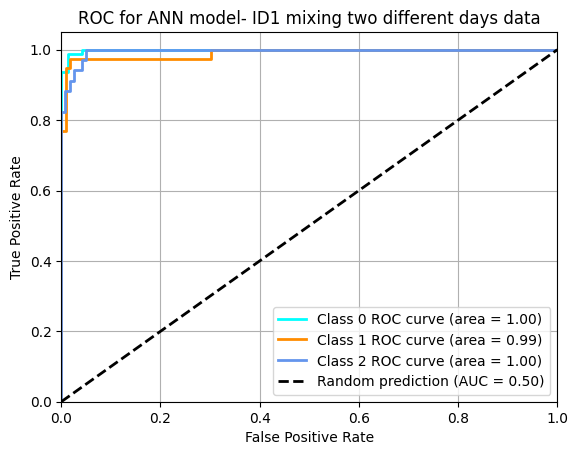

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        79
           1       0.95      0.97      0.96        39
           2       1.00      0.74      0.85        34

    accuracy                           0.93       152
   macro avg       0.95      0.90      0.92       152
weighted avg       0.94      0.93      0.93       152



In [116]:
mixed_id1_ann_model, mixed_id1_ann_y_score, mixed_id1_ann_y_class_score, mixed_id1_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ID1 Mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_ann_y_class_score))

### RAW (Left) com os dados misturados

In [121]:
#Biceps femoral

bf1 = pd.read_csv('/content/Dif-ID1-RAW1-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/RAW-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/Dif-ID1-RAW1-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/RAW-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
mixed_id1_df = pd.DataFrame(dados)

# Filtrando as linhas onde 'Sinal' é um array vazio
mixed_id1_df = mixed_id1_df[mixed_id1_df['Sinal'].apply(lambda x: len(x) != 0)]

mixed_id1_df


,Label,Sinal,Classe
1,BF_Contraction_number_1,"[20.85567834407584, 28.01432165592405, 86.6643...",1
2,BF_Contraction_number_2,"[152.8256783440761, 147.93567834407577, 118.61...",1
3,BF_Contraction_number_3,"[42.674321655923904, 86.66432165592414, 155.09...",1
4,BF_Contraction_number_4,"[40.415678344075786, 128.38567834407604, 152.8...",1
5,BF_Contraction_number_5,"[74.62567834407582, 18.244321655924068, 140.43...",1
...,...,...,...
399,RF_BaseLine_number_96,"[39.152847923822264, 58.702847923822446, 73.37...",0
400,RF_BaseLine_number_97,"[9.832847923822555, 9.717152076177626, 9.83284...",0
401,RF_BaseLine_number_98,"[29.382847923822283, 39.152847923822264, 39.15...",0
402,RF_BaseLine_number_99,"[83.1428479238225, 68.48284792382265, 68.48284...",0


Applying the models


In [122]:
#Shuffling the data
X = np.array(mixed_id1_df['Sinal'].tolist())
y = np.array(mixed_id1_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 54.3728 ms
Testing/prediction time: 2.8973 ms


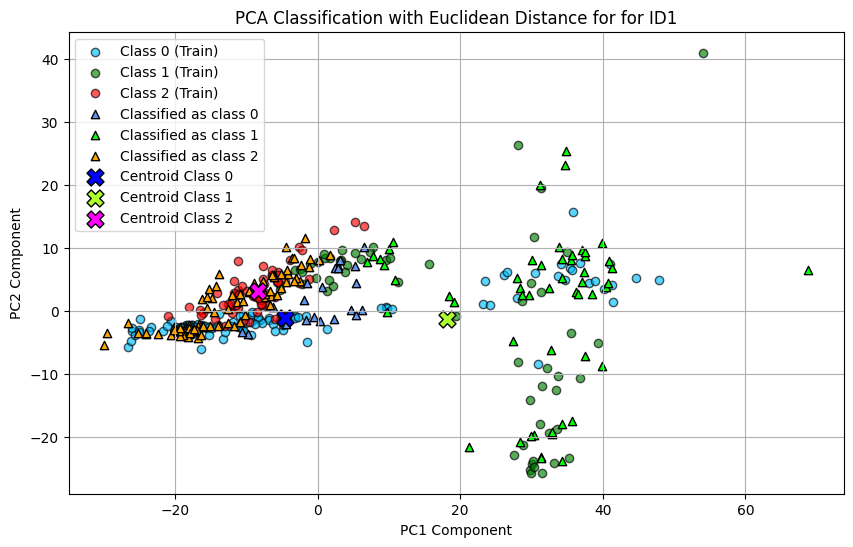

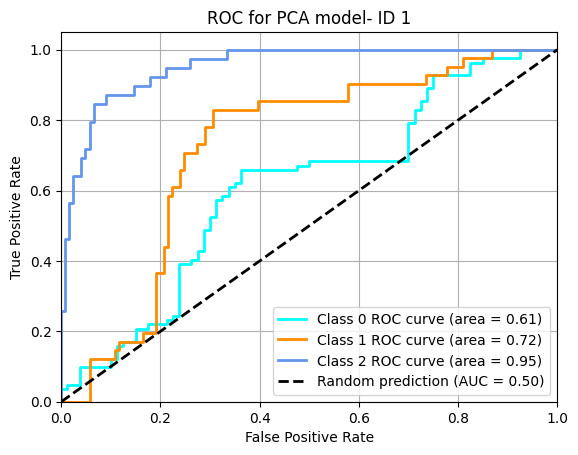

              precision    recall  f1-score   support

           0       0.50      0.13      0.21        82
           1       0.48      0.63      0.55        41
           2       0.43      0.95      0.59        39

    accuracy                           0.46       162
   macro avg       0.47      0.57      0.45       162
weighted avg       0.48      0.46      0.39       162



In [123]:
#PCA
mixed_id1_X_train_pca, mixed_id1_pca_centroids, mixed_id1_pca_y_score, mixed_id1_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, mixed_id1_pca_y_class_score))


LDA

Training time: 120.0979 ms
Testing/prediction time: 5.5237 ms
Accuracy: 82.72%


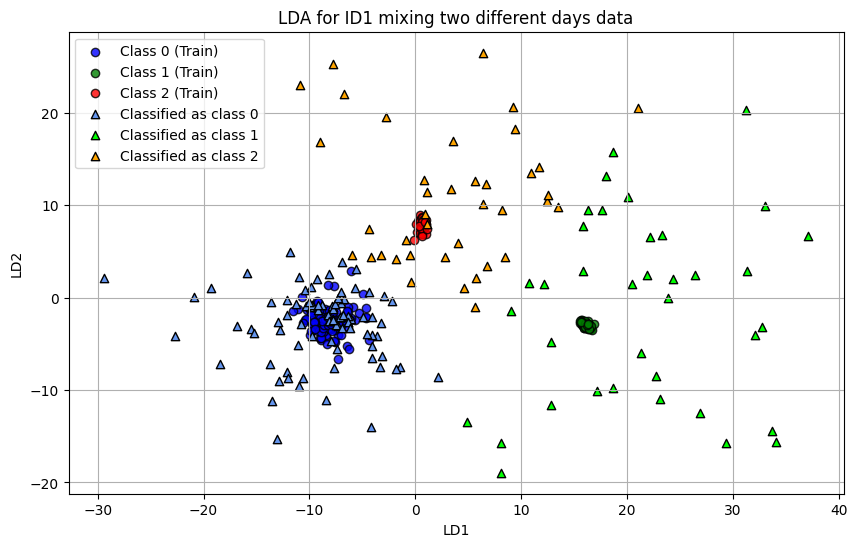

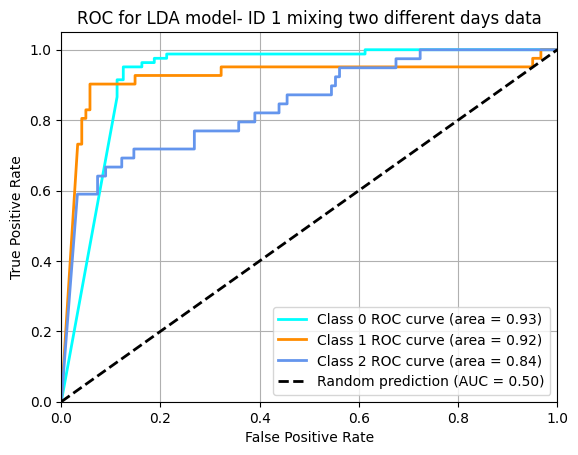

              precision    recall  f1-score   support

           0       0.88      0.93      0.90        82
           1       0.86      0.78      0.82        41
           2       0.67      0.67      0.67        39

    accuracy                           0.83       162
   macro avg       0.81      0.79      0.80       162
weighted avg       0.83      0.83      0.83       162



In [124]:
#Training the model and plotting the predictions
mixed_id1_lda_result, mixed_id1_lda_X_lda, mixed_id1_lda_y_score, mixed_id1_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_lda_y_class_score))


QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 189.2340 ms
Testing/prediction time: 63.9770 ms
Accuracy: 54.32%


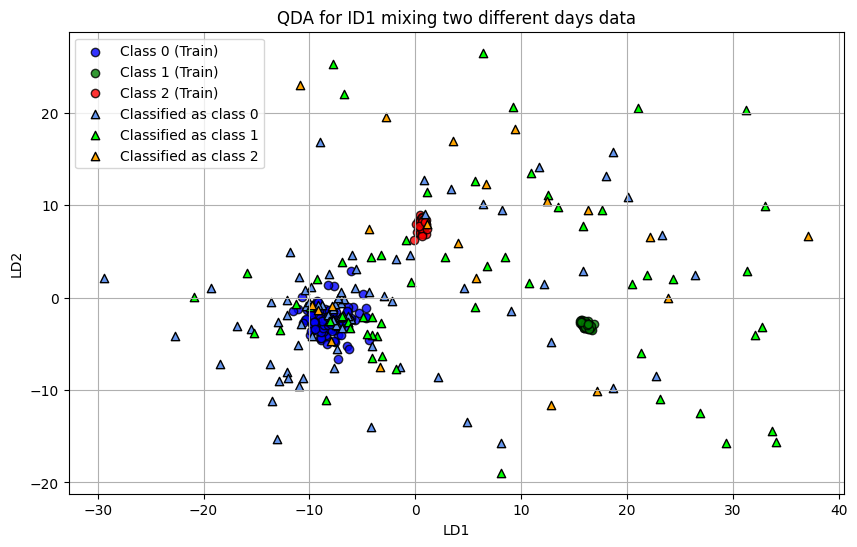

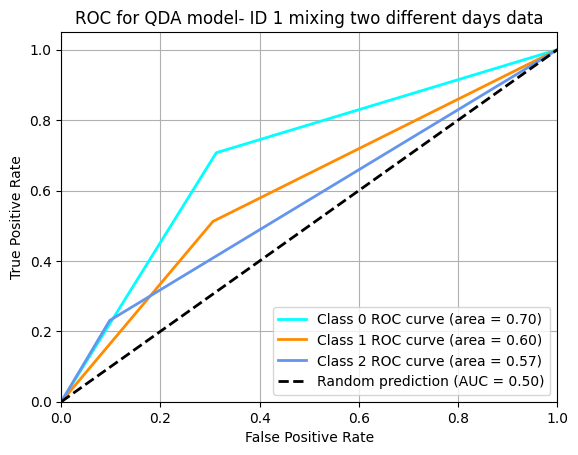

              precision    recall  f1-score   support

           0       0.70      0.71      0.70        82
           1       0.36      0.51      0.42        41
           2       0.43      0.23      0.30        39

    accuracy                           0.54       162
   macro avg       0.50      0.48      0.48       162
weighted avg       0.55      0.54      0.54       162



In [125]:
#Training the model and plotting the predictions
mixed_id1_qda_result, mixed_id1_qda_X_qda, mixed_id1_qda_y_score, mixed_id1_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_qda_y_class_score))


PLS

Training time: 19.4681 ms
Testing/prediction time: 7.0603 ms


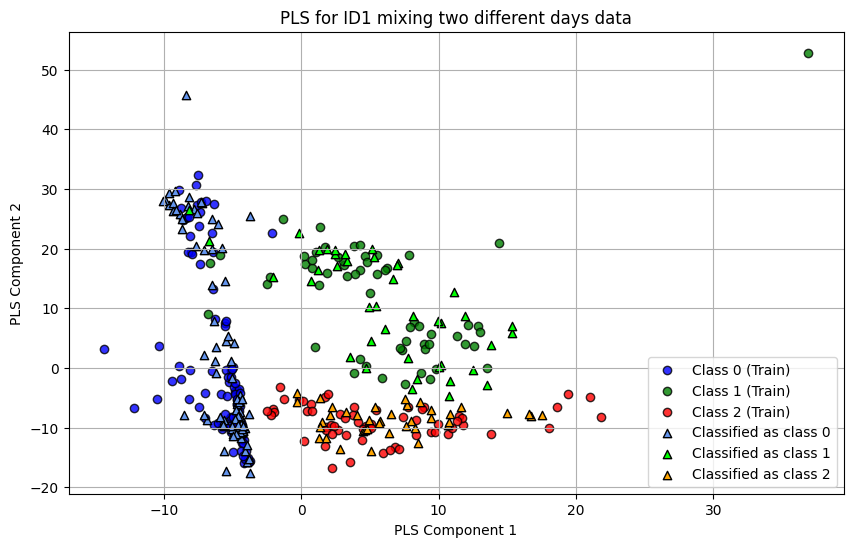

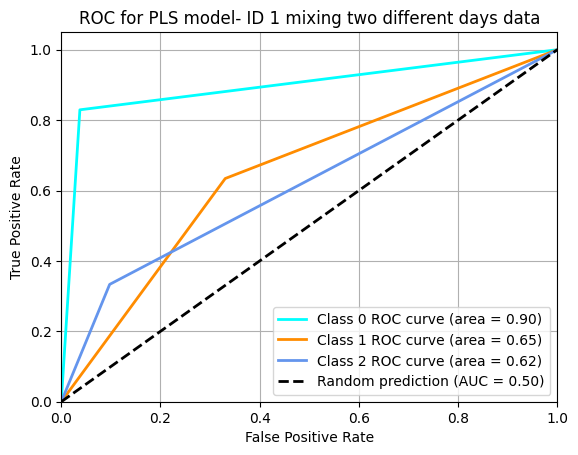

              precision    recall  f1-score   support

           0       0.96      0.83      0.89        82
           1       0.39      0.63      0.49        41
           2       0.52      0.33      0.41        39

    accuracy                           0.66       162
   macro avg       0.62      0.60      0.59       162
weighted avg       0.71      0.66      0.67       162



In [126]:
#Training the model and plotting the predictions
mixed_id1_pls_result, mixed_id1_pls_X_pls, mixed_id1_pls_y_score, mixed_id1_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 mixing two different days data')

#Unbinarizing the data
mixed_id1_pls_y_class_score = np.argmax(np.array(mixed_id1_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, mixed_id1_pls_y_class_score))


SVM

Training time: 97.8465 ms
Testing/prediction time: 48.8882 ms
Accuracy: 96.91%


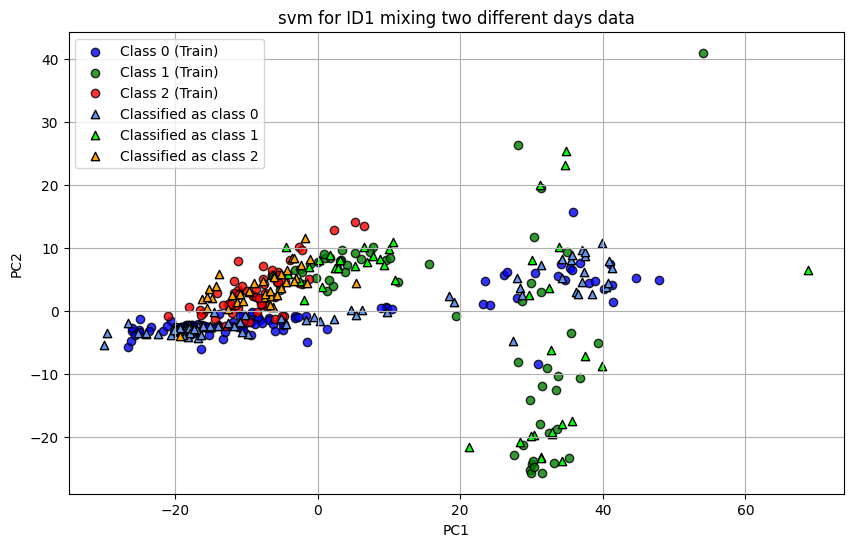

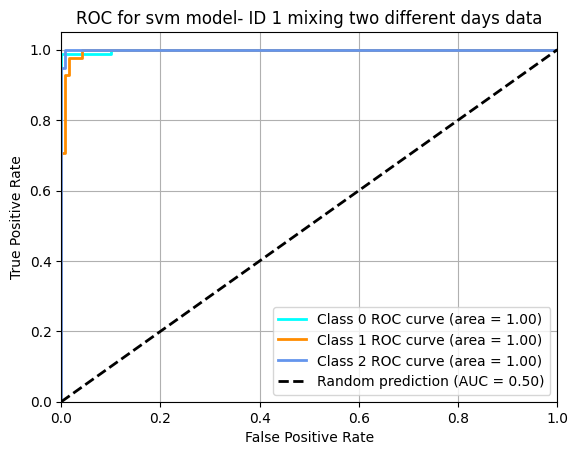

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        82
           1       0.91      0.98      0.94        41
           2       0.97      0.97      0.97        39

    accuracy                           0.97       162
   macro avg       0.96      0.97      0.97       162
weighted avg       0.97      0.97      0.97       162



In [127]:
#Training the model and plotting the predictions
mixed_id1_svm_result, mixed_id1_svm_X_svm, mixed_id1_svm_y_score, mixed_id1_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_svm_y_class_score))


ANN

Training time: 2203.8689 ms
6/6 [==============================] - 0s 3ms/step
Testing/prediction time: 156.4760 ms


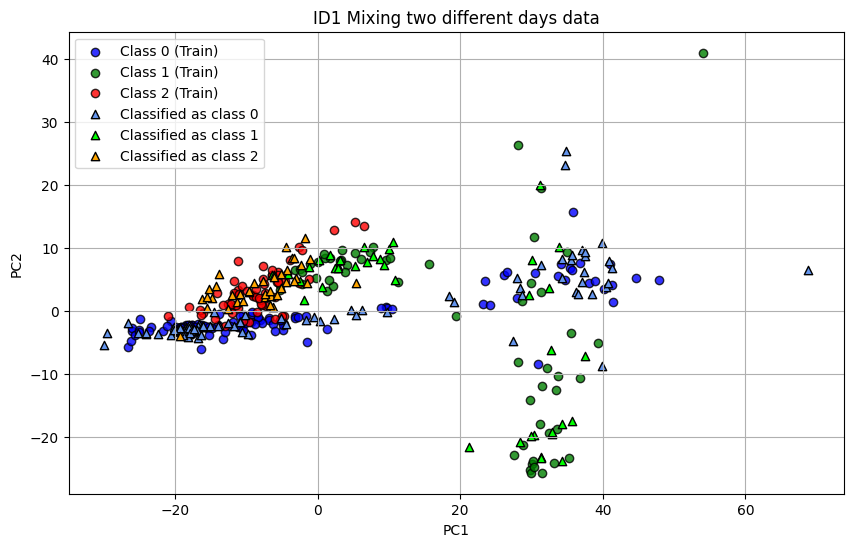

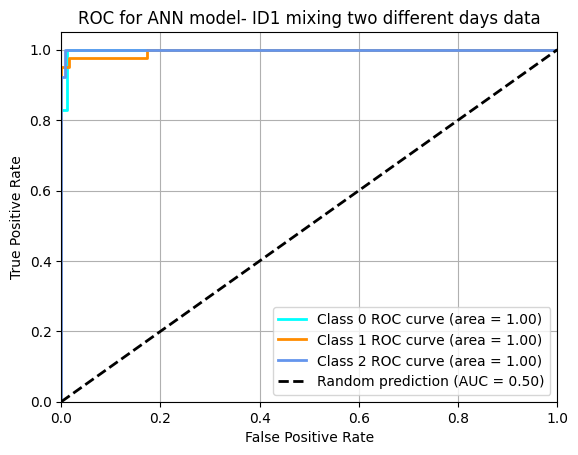

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        82
           1       1.00      0.95      0.97        41
           2       0.97      1.00      0.99        39

    accuracy                           0.99       162
   macro avg       0.99      0.98      0.99       162
weighted avg       0.99      0.99      0.99       162



In [128]:
mixed_id1_ann_model, mixed_id1_ann_y_score, mixed_id1_ann_y_class_score, mixed_id1_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ID1 Mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= mixed_id1_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 mixing two different days data')

#Classification Report
print(classification_report(y_test, mixed_id1_ann_y_class_score))

### RAW (Right) treinado com um dia e testado com o outro dia

Training data

In [142]:
'''
Dataframe de treinamento referente aos dados de:
1-'/content/RAW-BF-Direito-50ContracoesSucessivas.txt'
2-'/content/RAW-RF-Direito-50ContracoesSucessivas.txt'
Treinada na seção "RAW (Direito) com os dados de um dia só"
'''
#Biceps femoral

bf = pd.read_csv('/content/RAW-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/RAW-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_df = pd.DataFrame(dados)
id1_50_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[2.433924404825575, 21.99392440482552, 21.9939...",1
1,BF_Contraction_number_1,"[75.76607559517424, 41.54607559517444, 17.1160...",1
2,BF_Contraction_number_2,"[7.336075595174407, 17.116075595174152, 26.886...",1
3,BF_Contraction_number_3,"[65.9860755951745, 61.09607559517417, 90.42607...",1
4,BF_Contraction_number_4,"[26.886075595174134, 21.99607559517426, 12.226...",1
...,...,...,...
197,RF_BaseLine_number_46,"[21.179543885037674, 11.399543885037929, 11.39...",0
198,RF_BaseLine_number_47,"[76.58045611496209, 61.91045611496202, 37.4804...",0
199,RF_BaseLine_number_48,"[71.69045611496222, 86.35045611496207, 76.5804...",0
200,RF_BaseLine_number_49,"[13.040456114962126, 27.70045611496198, 27.700...",0


Testing data

In [143]:
#Biceps femoral

bf = pd.read_csv('/content/Dif-ID1-RAW1-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/Dif-ID1-RAW1-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_test_df = pd.DataFrame(dados)
id1_50_test_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[42.64660394278644, 37.75660394278657, 42.6466...",1
1,BF_Contraction_number_1,"[35.563396057213595, 11.12339605721354, 30.673...",1
2,BF_Contraction_number_2,"[35.563396057213595, 40.443396057213704, 1.343...",1
3,BF_Contraction_number_3,"[25.78339605721385, 30.673396057213722, 30.673...",1
4,BF_Contraction_number_4,"[30.673396057213722, 30.673396057213722, 40.44...",1
...,...,...,...
177,RF_BaseLine_number_36,"[15.674745722389616, 20.56474572238949, 15.674...",0
178,RF_BaseLine_number_37,"[38.08525427761015, 33.195254277610275, 23.425...",0
179,RF_BaseLine_number_38,"[1.0147457223897618, 10.794745722389507, 20.56...",0
180,RF_BaseLine_number_39,"[82.07525427761038, 77.18525427761051, 67.4152...",0


Preparing X and y vectors (training and testing)

In [144]:
from sklearn.preprocessing import StandardScaler

X_train = np.array(id1_50_df['Sinal'].tolist())
y_train = np.array(id1_50_df['Classe'])

X_test = np.array(id1_50_test_df['Sinal'].tolist())
y_test = np.array(id1_50_test_df['Classe'])

#shuffling the data
X_train,y_train,_ = shuffering(x= X_train, y= y_train, times = 11)
X_test,y_test,_ = shuffering(x= X_test, y= y_test, times = 11)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10
The data was shuffled 10 times with the last random state parameter being also 10


Applying the models

PCA

Training time: 29.7484 ms
Testing/prediction time: 2.9092 ms


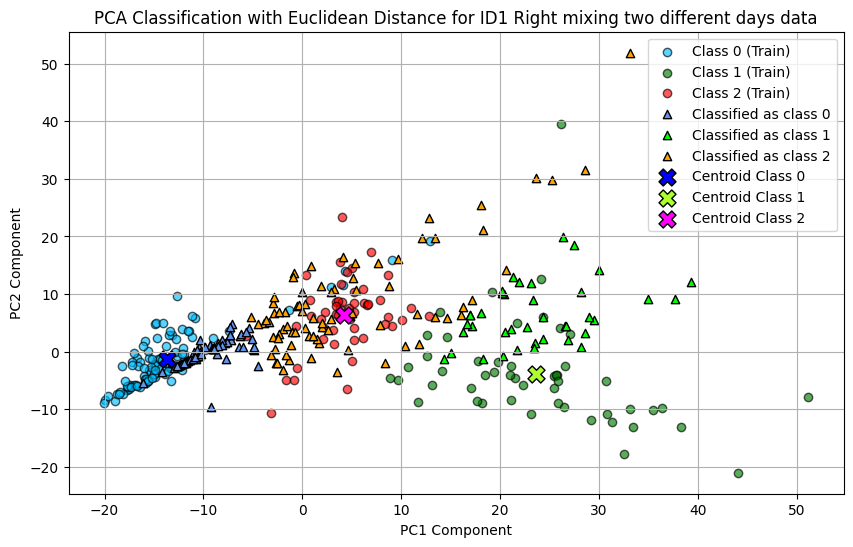

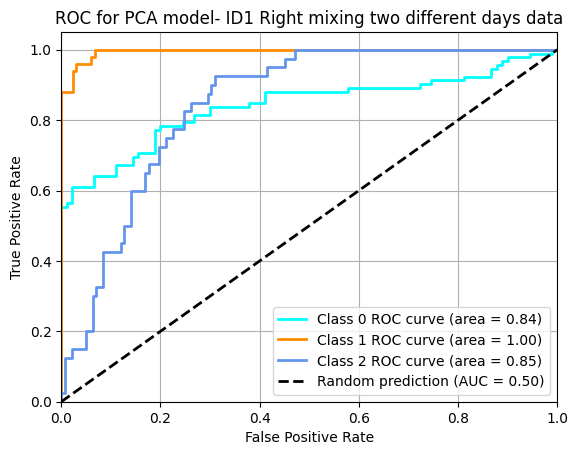

              precision    recall  f1-score   support

           0       0.91      0.64      0.75        92
           1       1.00      0.78      0.88        50
           2       0.44      0.85      0.58        40

    accuracy                           0.73       182
   macro avg       0.78      0.76      0.73       182
weighted avg       0.83      0.73      0.75       182



In [145]:
#PCA
id1_difDay_X_train_pca, id1_difDay_pca_centroids, id1_difDay_pca_y_score, id1_difDay_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='ID1 Right mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID1 Right mixing two different days data')
#Classification Report
print(classification_report(y_test, id1_difDay_pca_y_class_score))

LDA

Training time: 85.3360 ms
Testing/prediction time: 9.2635 ms
Accuracy: 70.33%


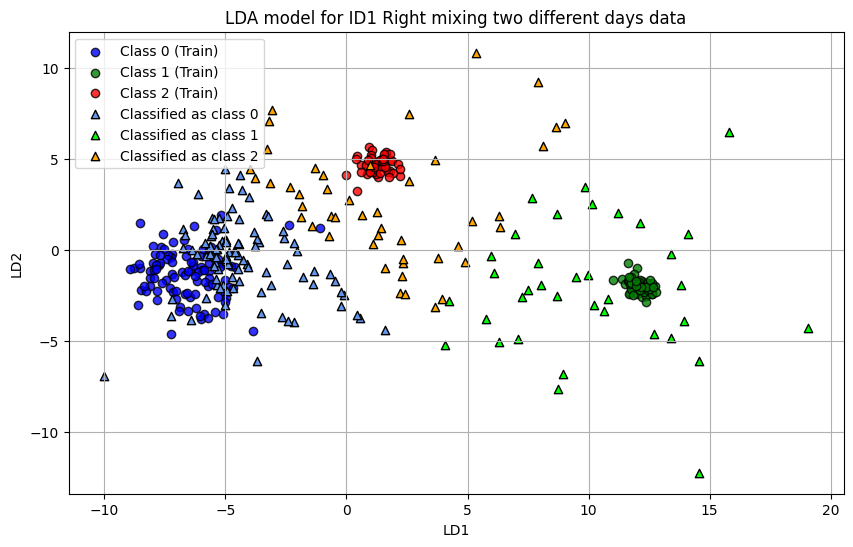

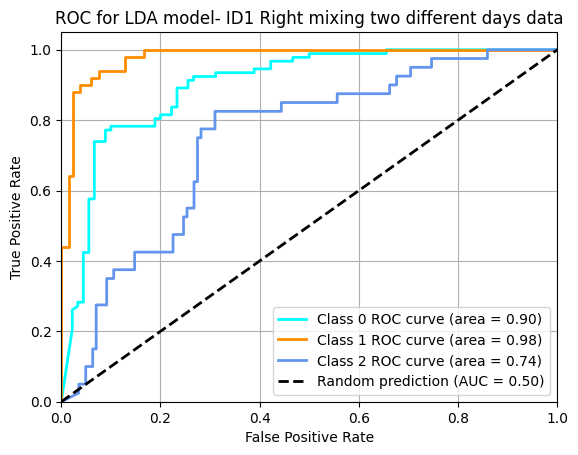

              precision    recall  f1-score   support

           0       0.79      0.85      0.82        92
           1       0.92      0.66      0.77        50
           2       0.36      0.42      0.39        40

    accuracy                           0.70       182
   macro avg       0.69      0.64      0.66       182
weighted avg       0.73      0.70      0.71       182



In [146]:
#LDA

#Training the model and plotting the predictions
id1_difDay_lda_result, id1_difDay_lda_X_lda, id1_difDay_lda_y_score, id1_difDay_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA model for ID1 Right mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID1 Right mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_lda_y_class_score))

QDA

Training time: 49.3891 ms
Testing/prediction time: 23.6337 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 45.60%


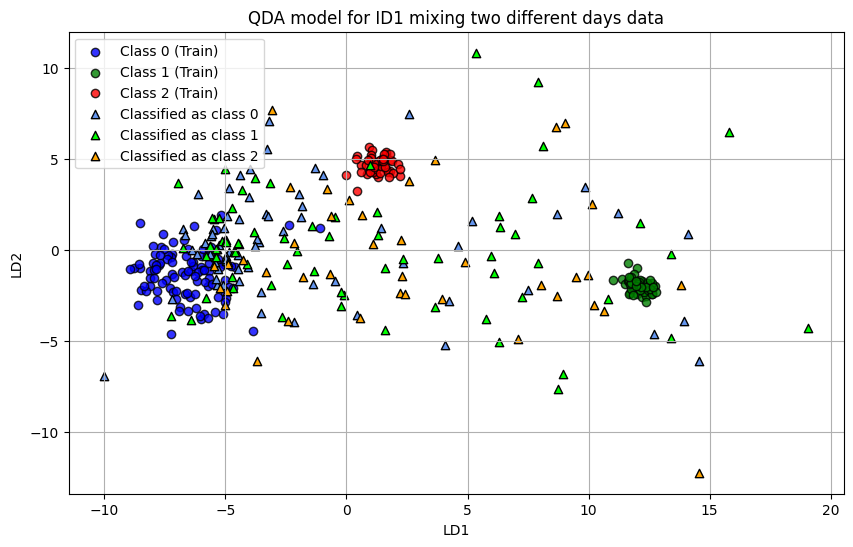

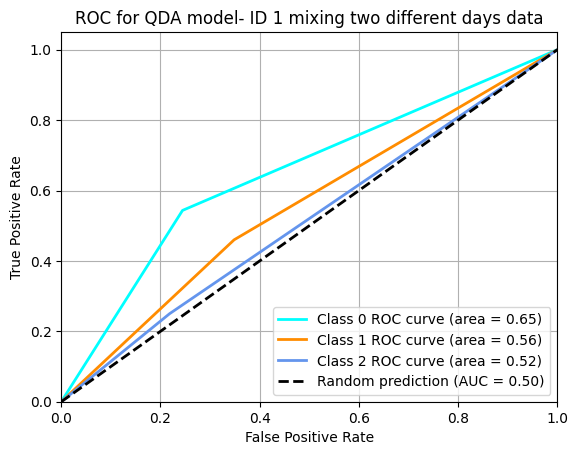

              precision    recall  f1-score   support

           0       0.69      0.54      0.61        92
           1       0.33      0.46      0.39        50
           2       0.24      0.25      0.25        40

    accuracy                           0.46       182
   macro avg       0.42      0.42      0.41       182
weighted avg       0.50      0.46      0.47       182



In [147]:
#QDA
#Training the model and plotting the predictions
id1_difDay_qda_result, id1_difDay_qda_X_qda, id1_difDay_qda_y_score, id1_difDay_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA model for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_qda_y_class_score))

PLS

Training time: 23.6583 ms
Testing/prediction time: 8.4908 ms


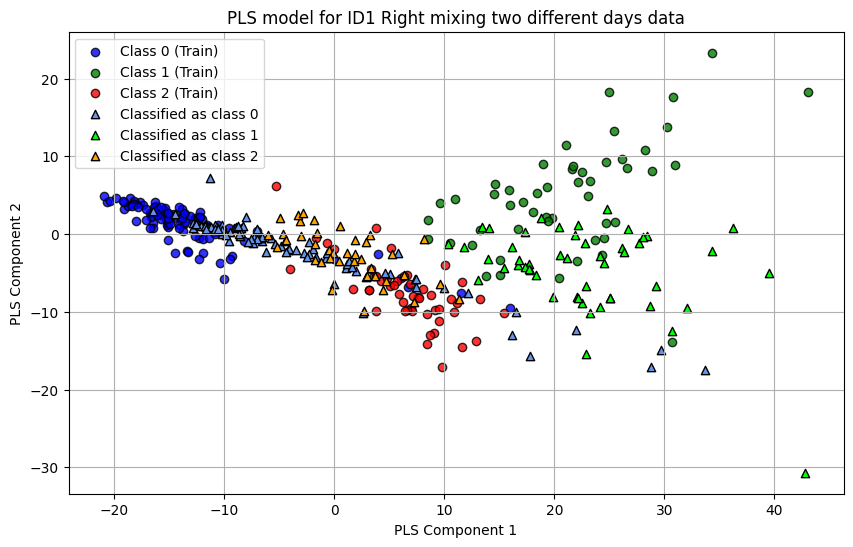

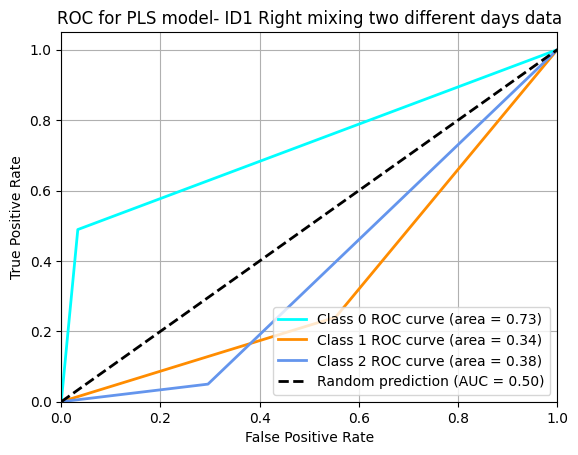

              precision    recall  f1-score   support

           0       0.91      0.52      0.66        92
           1       0.14      0.24      0.18        50
           2       0.05      0.05      0.05        40

    accuracy                           0.34       182
   macro avg       0.36      0.27      0.30       182
weighted avg       0.51      0.34      0.39       182



In [148]:
#PLS

#Training the model and plotting the predictions
id1_difDay_pls_result, id1_difDay_pls_X_pls, id1_difDay_pls_y_score, id1_difDay_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS model for ID1 Right mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID1 Right mixing two different days data')

#Unbinarizing the data
id1_difDay_pls_y_class_score = np.argmax(np.array(id1_difDay_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_difDay_pls_y_class_score))

SVM

Training time: 214.8662 ms
Testing/prediction time: 139.3402 ms
Accuracy: 86.81%


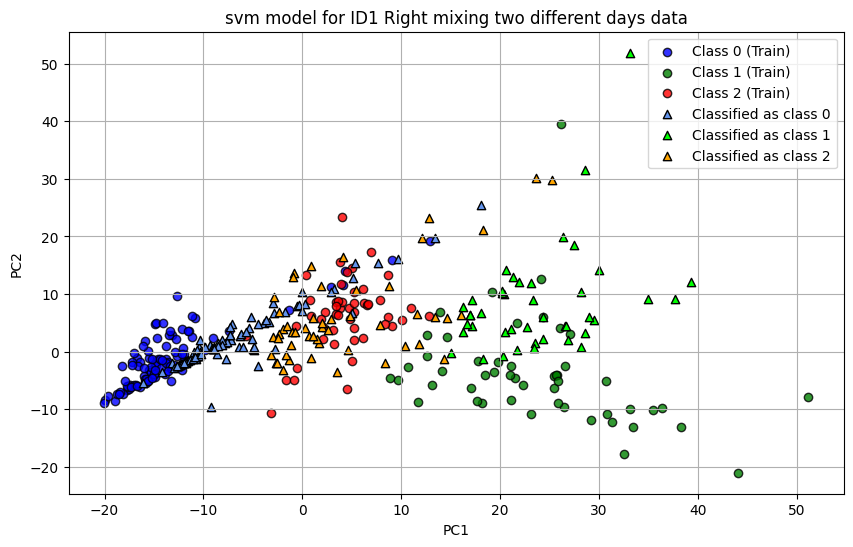

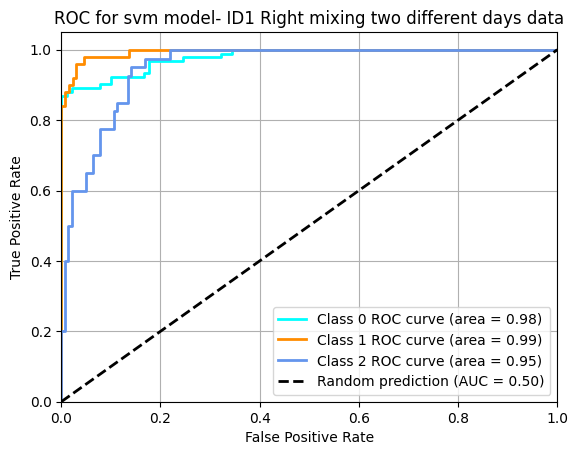

              precision    recall  f1-score   support

           0       0.93      0.89      0.91        92
           1       0.98      0.84      0.90        50
           2       0.67      0.85      0.75        40

    accuracy                           0.87       182
   macro avg       0.86      0.86      0.85       182
weighted avg       0.89      0.87      0.87       182



In [149]:
#SVM

#Training the model and plotting the predictions
id1_difDay_svm_result, id1_difDay_svm_X_svm, id1_difDay_svm_y_score, id1_difDay_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm model for ID1 Right mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID1 Right mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_svm_y_class_score))

ANN

Training time: 3947.5152 ms
6/6 [==============================] - 0s 4ms/step
Testing/prediction time: 226.9728 ms


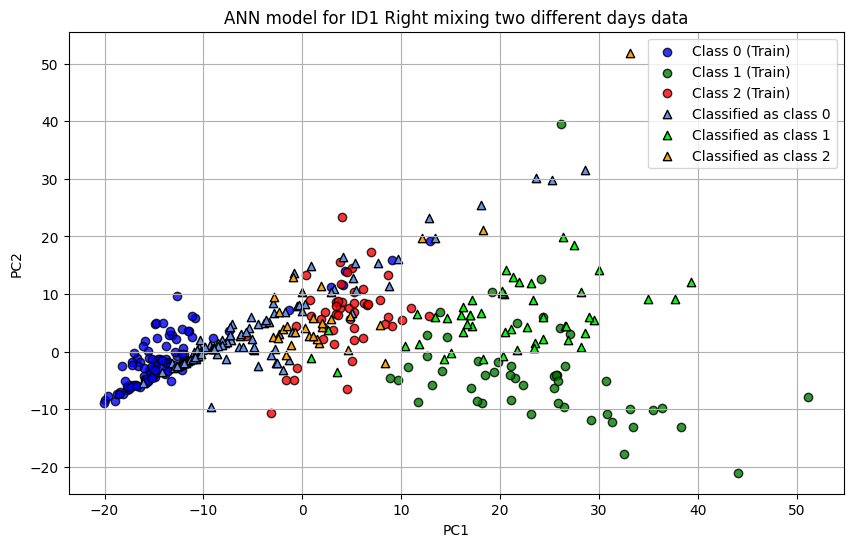

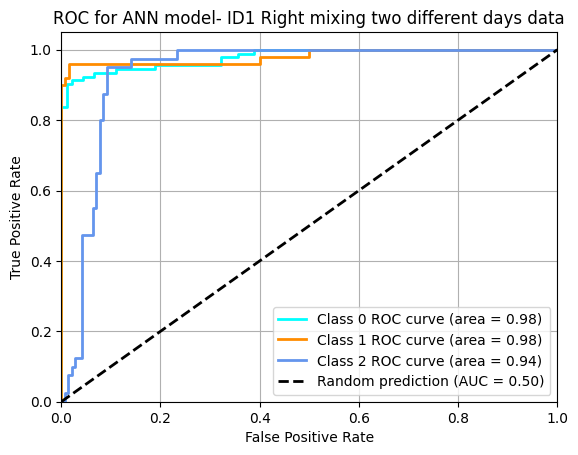

              precision    recall  f1-score   support

           0       0.84      0.95      0.89        92
           1       0.94      0.96      0.95        50
           2       0.74      0.50      0.60        40

    accuracy                           0.85       182
   macro avg       0.84      0.80      0.81       182
weighted avg       0.84      0.85      0.84       182



In [150]:
#ANN
id1_difDay_ann_model, id1_difDay_ann_y_score, id1_difDay_ann_y_class_score, id1_difDay_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ANN model for ID1 Right mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 Right mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_ann_y_class_score))

### RAW (Left) treinado com um dia e testado com o outro

In [151]:
'''
Dataframe de treinamento referente aos dados de:
1-'/content/RAW-BF-Esquerdo-50ContracoesSucessivas.txt'
2-'/content/RAW-RF-Esquerdo-50ContracoesSucessivas.txt'
Treinada na seção "RAW (Direito) com os dados de um dia só"
'''

#Biceps femoral

bf = pd.read_csv('/content/RAW-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')


#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/RAW-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_df = pd.DataFrame(dados)

# Filtrando as linhas onde 'Sinal' é um array vazio
id1_50_df = id1_50_df[id1_50_df['Sinal'].apply(lambda x: len(x) != 0)]

id1_50_df

,Label,Sinal,Classe
1,BF_Contraction_number_1,"[22.82457903422346, 52.15457903422384, 57.0445...",1
2,BF_Contraction_number_2,"[42.37457903422364, 37.494579034223534, 32.604...",1
3,BF_Contraction_number_3,"[32.60457903422366, 37.494579034223534, 32.604...",1
4,BF_Contraction_number_4,"[22.82457903422346, 37.494579034223534, 47.264...",1
5,BF_Contraction_number_5,"[3.274579034223734, 1.605420965776375, 8.16457...",1
...,...,...,...
197,RF_BaseLine_number_46,"[5.334732603409975, 24.884732603410157, 39.554...",0
198,RF_BaseLine_number_47,"[23.985267396589734, 43.535267396589916, 23.98...",0
199,RF_BaseLine_number_48,"[4.435267396590007, 5.334732603409975, 5.33473...",0
200,RF_BaseLine_number_49,"[49.32473260341021, 34.66473260341036, 34.6647...",0


Testing data

In [152]:
#Biceps femoral

bf = pd.read_csv('/content/Dif-ID1-RAW1-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
bf_amplitude = np.array(bf['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf = pd.read_csv('/content/Dif-ID1-RAW1-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')

#Dividing Data
rf_amplitude = np.array(rf['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_50_test_df = pd.DataFrame(dados)
id1_50_test_df


,Label,Sinal,Classe
0,BF_Contraction_number_0,"[42.64660394278644, 37.75660394278657, 42.6466...",1
1,BF_Contraction_number_1,"[35.563396057213595, 11.12339605721354, 30.673...",1
2,BF_Contraction_number_2,"[35.563396057213595, 40.443396057213704, 1.343...",1
3,BF_Contraction_number_3,"[25.78339605721385, 30.673396057213722, 30.673...",1
4,BF_Contraction_number_4,"[30.673396057213722, 30.673396057213722, 40.44...",1
...,...,...,...
177,RF_BaseLine_number_36,"[15.674745722389616, 20.56474572238949, 15.674...",0
178,RF_BaseLine_number_37,"[38.08525427761015, 33.195254277610275, 23.425...",0
179,RF_BaseLine_number_38,"[1.0147457223897618, 10.794745722389507, 20.56...",0
180,RF_BaseLine_number_39,"[82.07525427761038, 77.18525427761051, 67.4152...",0


Preparing X and y vectors (training and testing)

In [153]:
from sklearn.preprocessing import StandardScaler

X_train = np.array(id1_50_df['Sinal'].tolist())
y_train = np.array(id1_50_df['Classe'])

X_test = np.array(id1_50_test_df['Sinal'].tolist())
y_test = np.array(id1_50_test_df['Classe'])

#shuffling the data
X_train,y_train,_ = shuffering(x= X_train, y= y_train, times = 11)
X_test,y_test,_ = shuffering(x= X_test, y= y_test, times = 11)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10
The data was shuffled 10 times with the last random state parameter being also 10


Applying the models

PCA

Training time: 73.5033 ms
Testing/prediction time: 2.9020 ms


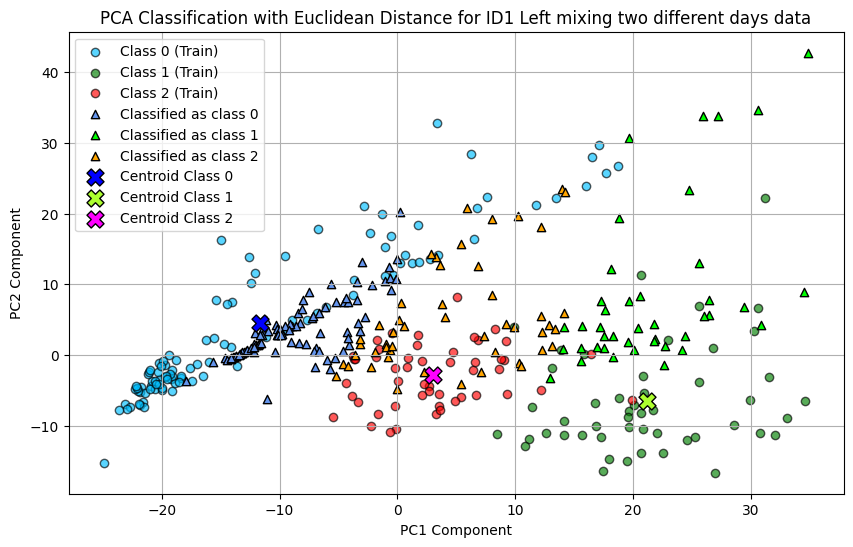

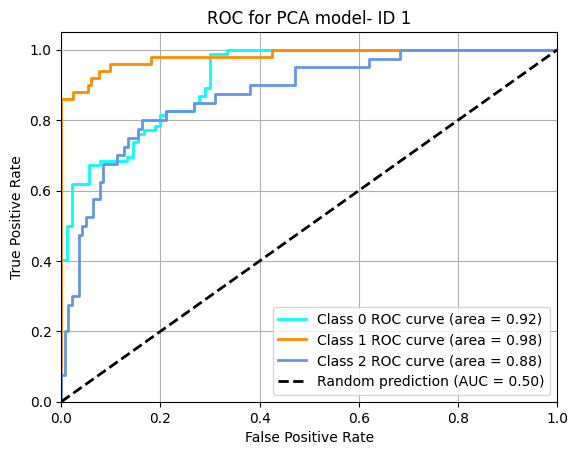

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        92
           1       0.90      0.74      0.81        50
           2       0.49      0.60      0.54        40

    accuracy                           0.75       182
   macro avg       0.74      0.72      0.73       182
weighted avg       0.77      0.75      0.76       182



In [154]:
#PCA
id1_difDay_X_train_pca, id1_difDay_pca_centroids, id1_difDay_pca_y_score, id1_difDay_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='ID1 Left mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id1_difDay_pca_y_class_score))


LDA

Training time: 291.7094 ms
Testing/prediction time: 4.6477 ms
Accuracy: 60.44%


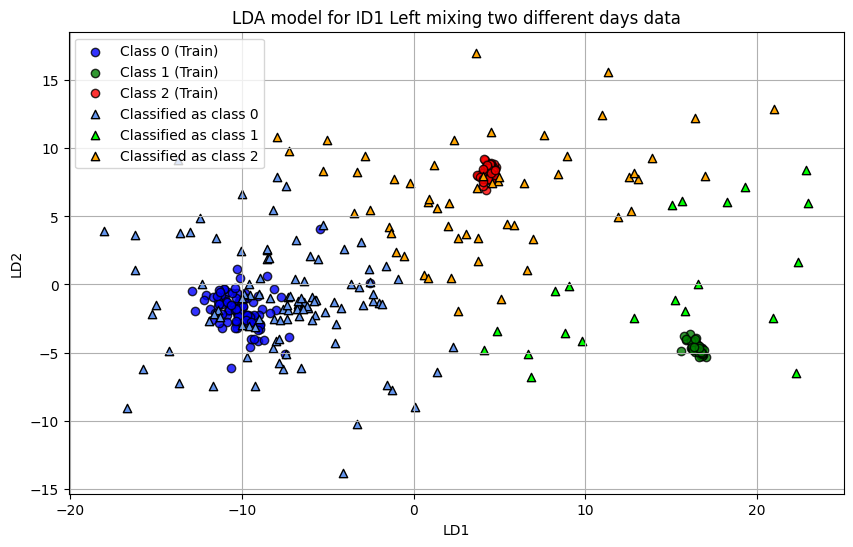

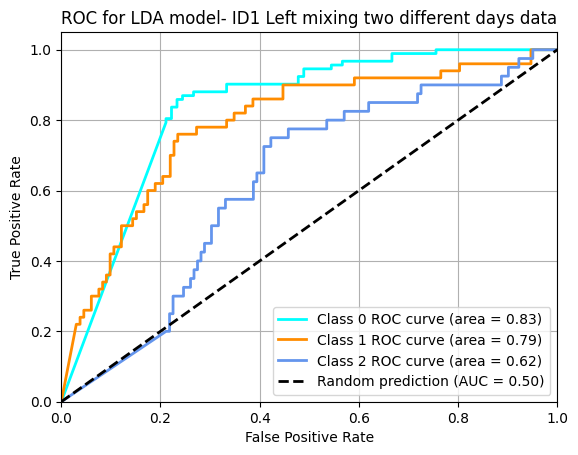

              precision    recall  f1-score   support

           0       0.77      0.88      0.82        92
           1       0.62      0.26      0.37        50
           2       0.29      0.40      0.33        40

    accuracy                           0.60       182
   macro avg       0.56      0.51      0.51       182
weighted avg       0.62      0.60      0.59       182



In [155]:
#LDA

#Training the model and plotting the predictions
id1_difDay_lda_result, id1_difDay_lda_X_lda, id1_difDay_lda_y_score, id1_difDay_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA model for ID1 Left mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID1 Left mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_lda_y_class_score))


QDA

Training time: 67.3585 ms
Testing/prediction time: 58.1334 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 59.89%


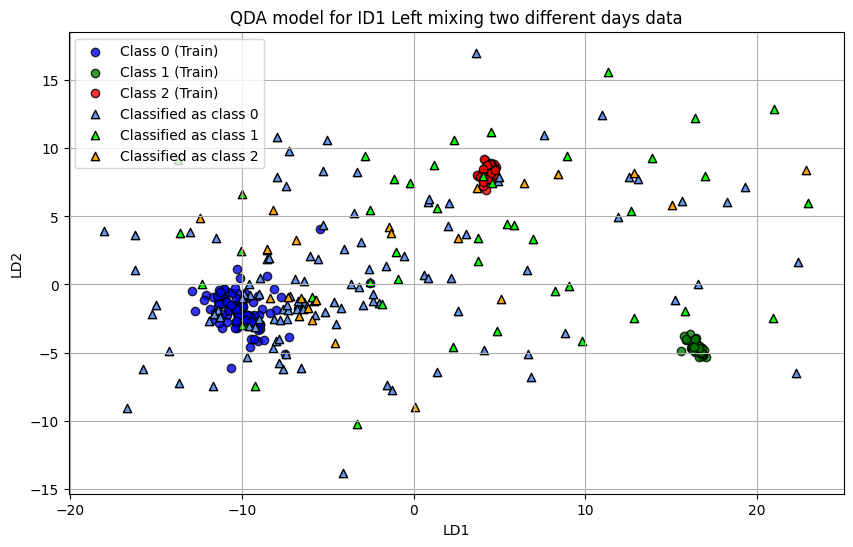

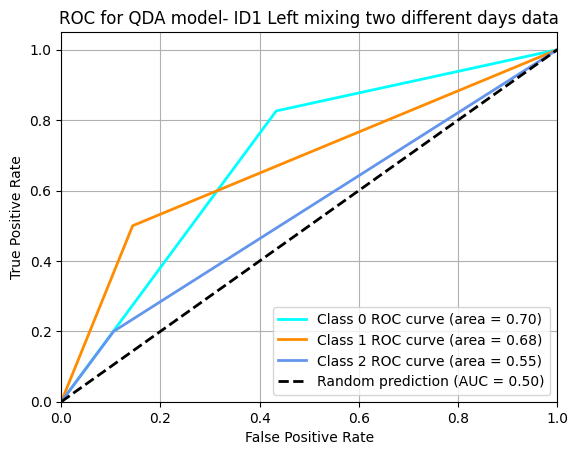

              precision    recall  f1-score   support

           0       0.66      0.83      0.73        92
           1       0.57      0.50      0.53        50
           2       0.35      0.20      0.25        40

    accuracy                           0.60       182
   macro avg       0.53      0.51      0.51       182
weighted avg       0.57      0.60      0.57       182



In [156]:
#QDA
#Training the model and plotting the predictions
id1_difDay_qda_result, id1_difDay_qda_X_qda, id1_difDay_qda_y_score, id1_difDay_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA model for ID1 Left mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID1 Left mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_qda_y_class_score))

PLS

Training time: 36.6192 ms
Testing/prediction time: 11.0469 ms


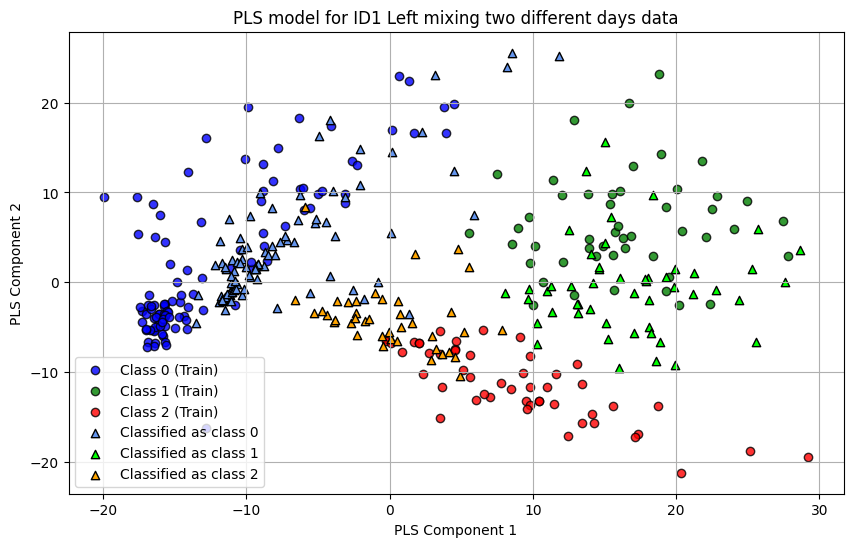

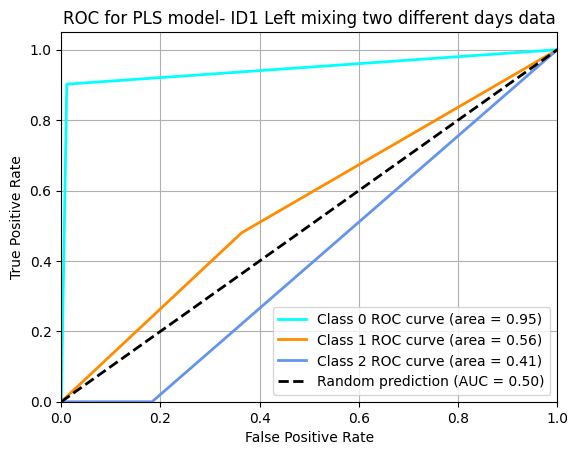

              precision    recall  f1-score   support

           0       0.99      0.90      0.94        92
           1       0.33      0.48      0.39        50
           2       0.00      0.00      0.00        40

    accuracy                           0.59       182
   macro avg       0.44      0.46      0.45       182
weighted avg       0.59      0.59      0.58       182



In [157]:
#PLS

#Training the model and plotting the predictions
id1_difDay_pls_result, id1_difDay_pls_X_pls, id1_difDay_pls_y_score, id1_difDay_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS model for ID1 Left mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID1 Left mixing two different days data')

#Unbinarizing the data
id1_difDay_pls_y_class_score = np.argmax(np.array(id1_difDay_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_difDay_pls_y_class_score))

SVM

Training time: 158.1955 ms
Testing/prediction time: 114.4438 ms
Accuracy: 82.42%


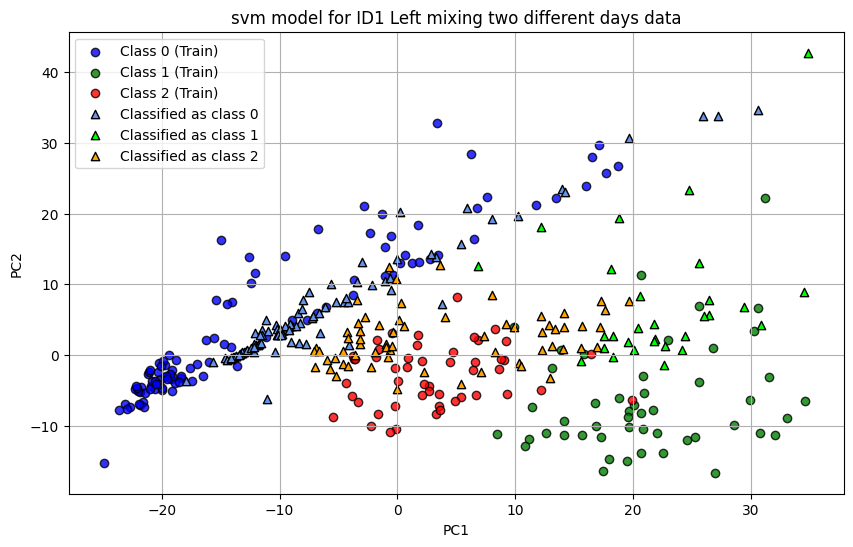

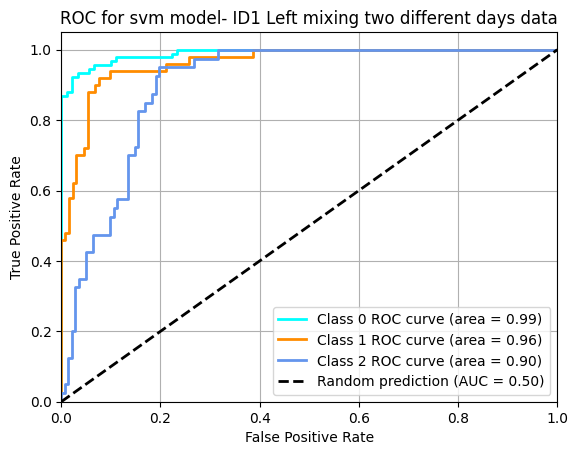

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        92
           1       0.93      0.54      0.68        50
           2       0.58      0.93      0.71        40

    accuracy                           0.82       182
   macro avg       0.83      0.80      0.78       182
weighted avg       0.87      0.82      0.82       182



In [158]:
#SVM

#Training the model and plotting the predictions
id1_difDay_svm_result, id1_difDay_svm_X_svm, id1_difDay_svm_y_score, id1_difDay_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm model for ID1 Left mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID1 Left mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_svm_y_class_score))

ANN

Training time: 3058.2340 ms
6/6 [==============================] - 0s 3ms/step
Testing/prediction time: 181.5417 ms


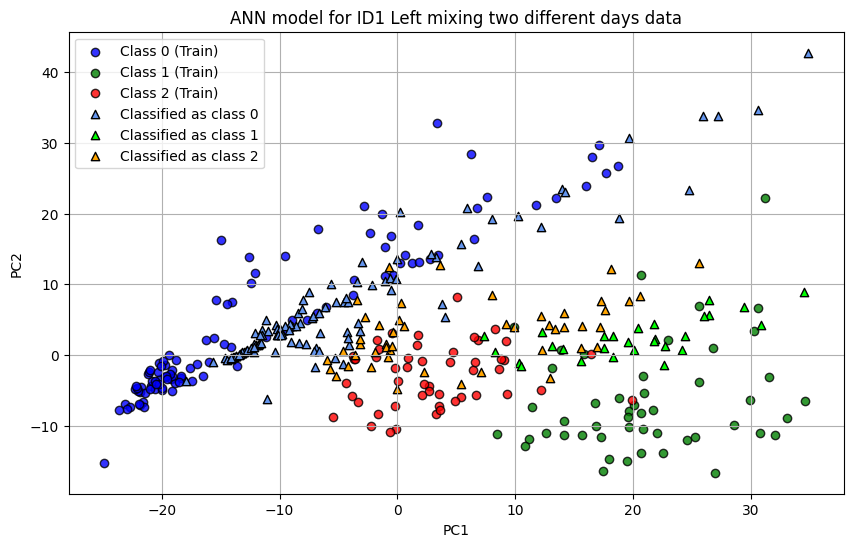

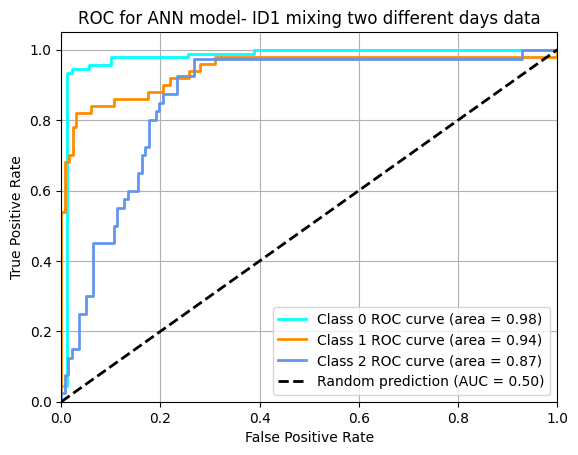

              precision    recall  f1-score   support

           0       0.85      0.98      0.91        92
           1       0.96      0.54      0.69        50
           2       0.54      0.65      0.59        40

    accuracy                           0.79       182
   macro avg       0.79      0.72      0.73       182
weighted avg       0.81      0.79      0.78       182



In [159]:
#ANN
id1_difDay_ann_model, id1_difDay_ann_y_score, id1_difDay_ann_y_class_score, id1_difDay_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ANN model for ID1 Left mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_difDay_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_difDay_ann_y_class_score))

## Fazendo teste com TODOS os sinais misturados (2ªGravação)

### RAW (Right)

In [174]:
#Biceps femoral

bf1 = pd.read_csv('/content/Dif-ID1-RAW1-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/Dif-ID1-RAW2-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
bf3 = pd.read_csv('/content/RAW-BF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
bf4 = pd.read_csv('/content/BF-Direito-RAW-10ContracoesSucessivasEmPe.txt', delimiter = '\t')
bf5 = pd.read_csv('/content/BF-Direito-RAW-10ContracoesSucessivasDeitado.txt', delimiter = '\t')
bf6 = pd.read_csv('/content/ID1-RAW-BF-Direito-arquivo_combinado.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2, bf3, bf4, bf5, bf6], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/Dif-ID1-RAW1-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/Dif-ID1-RAW2-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
rf3 = pd.read_csv('/content/Dif-ID1-RAW2-RF-Direito-50ContracoesSucessivas.txt', delimiter = '\t')
rf4 = pd.read_csv('/content/RF-Direito-RAW-10ContracoesSucessivas.txt', delimiter = '\t')
rf5 = pd.read_csv('/content/RF-Direito-RAW-10ContracoesRapidasSucessivas.txt', delimiter = '\t')
rf6 = pd.read_csv('/content/ID1-RAW-RF-Direito-arquivo_combinado.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2, rf3, rf4, rf5, rf6], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_tudo_df = pd.DataFrame(dados)
id1_tudo_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[4.845585423371176, 0.04441457662869652, 4.845...",1
1,BF_Contraction_number_1,"[73.36441457662886, 48.924414576628806, 68.474...",1
2,BF_Contraction_number_2,"[73.36441457662886, 78.24441457662897, 39.1444...",1
3,BF_Contraction_number_3,"[63.584414576629115, 68.47441457662899, 68.474...",1
4,BF_Contraction_number_4,"[68.47441457662899, 68.47441457662899, 78.2444...",1
...,...,...,...
1049,RF_BaseLine_number_248,"[25.94484531637181, 55.27484531637174, 40.6048...",0
1050,RF_BaseLine_number_249,"[30.834845316371684, 35.72484531637156, 30.834...",0
1051,RF_BaseLine_number_250,"[16.17484531637183, 16.17484531637183, 30.8348...",0
1052,RF_BaseLine_number_251,"[21.05484531637194, 11.284845316371957, 6.3948...",0


Applying the models

In [175]:
#Shuffling the data
X = np.array(id1_tudo_df['Sinal'].tolist())
y = np.array(id1_tudo_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)


#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 67.6279 ms
Testing/prediction time: 5.0011 ms


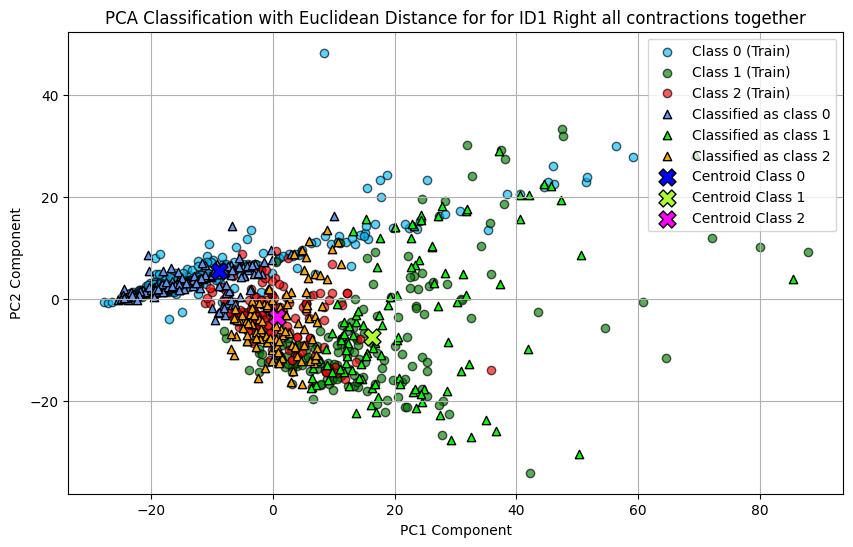

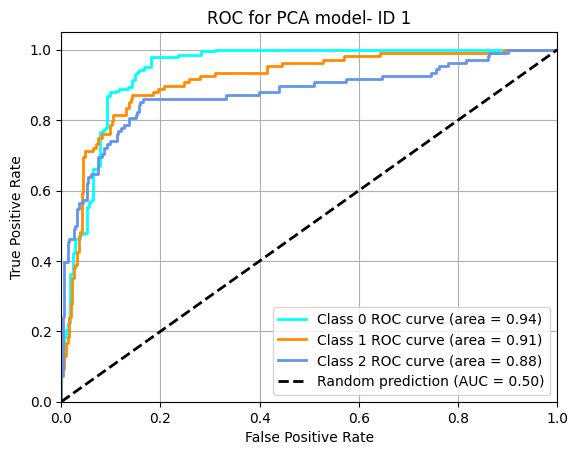

              precision    recall  f1-score   support

           0       0.90      0.87      0.89       206
           1       0.72      0.72      0.72       108
           2       0.66      0.71      0.69       108

    accuracy                           0.79       422
   macro avg       0.76      0.77      0.77       422
weighted avg       0.80      0.79      0.79       422



In [176]:
id1_tudo_X_train_pca, id1_tudo_pca_centroids, id1_tudo_pca_y_score, id1_tudo_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1 Right all contractions together')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id1_tudo_pca_y_class_score))

LDA

Training time: 984.9551 ms
Testing/prediction time: 12.2259 ms
Accuracy: 65.17%


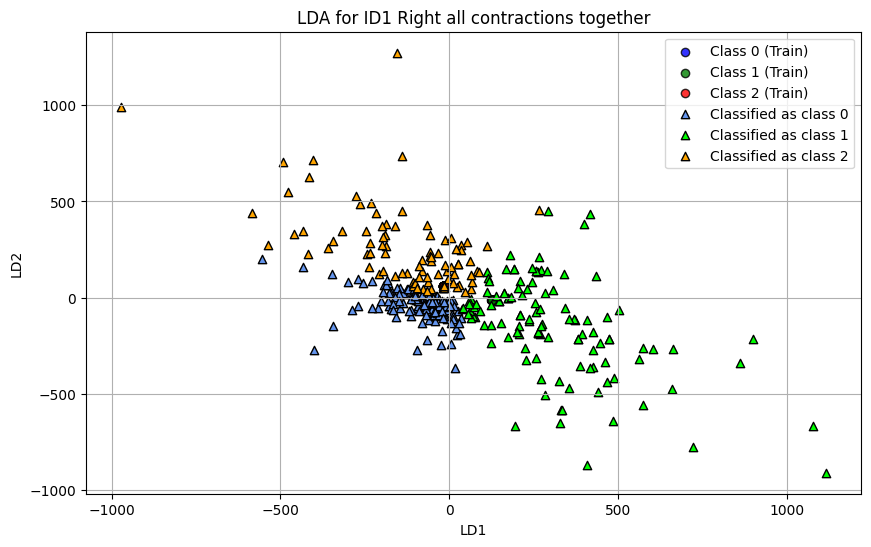

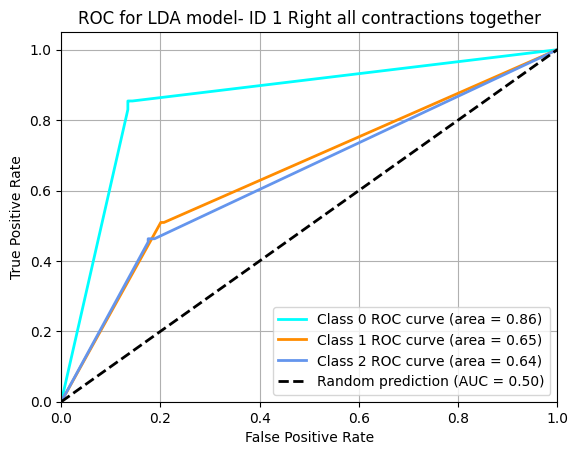

              precision    recall  f1-score   support

           0       0.85      0.83      0.84       206
           1       0.47      0.51      0.49       108
           2       0.47      0.45      0.46       108

    accuracy                           0.65       422
   macro avg       0.60      0.60      0.60       422
weighted avg       0.66      0.65      0.65       422



In [177]:
#LDA

#Training the model and plotting the predictions
id1_tudo_lda_result, id1_tudo_lda_X_lda, id1_tudo_lda_y_score, id1_tudo_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 Right all contractions together')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 Right all contractions together')

#Classification Report
print(classification_report(y_test, id1_tudo_lda_y_class_score))


QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 358.5050 ms
Testing/prediction time: 121.8891 ms
Accuracy: 36.49%


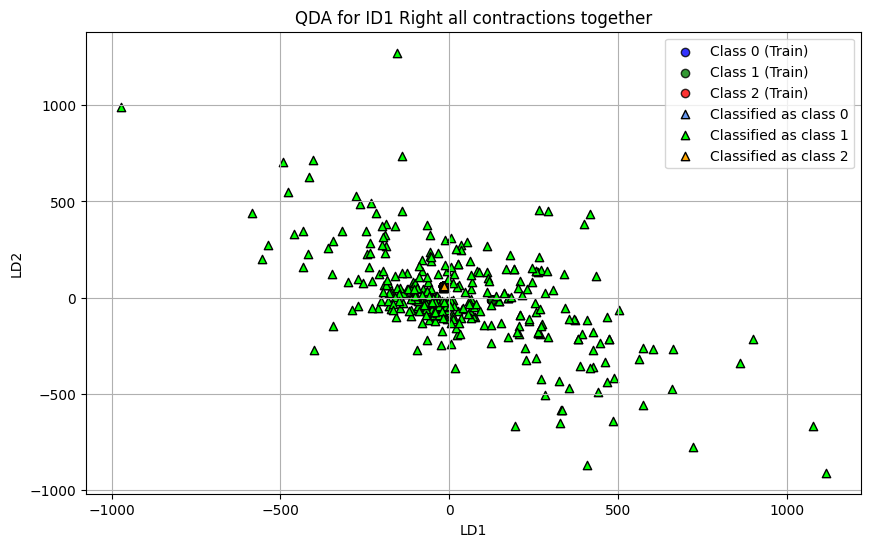

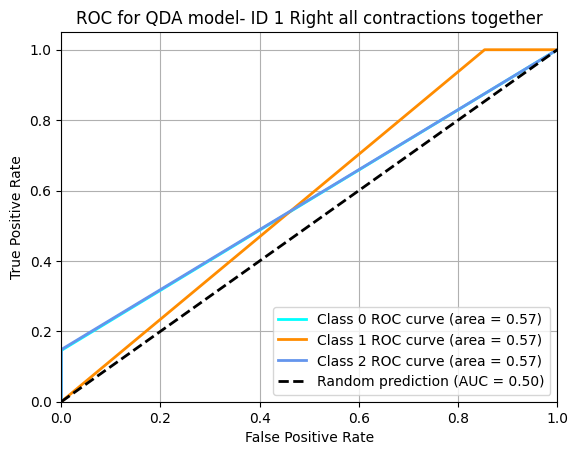

              precision    recall  f1-score   support

           0       1.00      0.15      0.25       206
           1       0.29      1.00      0.45       108
           2       1.00      0.15      0.26       108

    accuracy                           0.36       422
   macro avg       0.76      0.43      0.32       422
weighted avg       0.82      0.36      0.30       422



In [178]:
#QDA
#Training the model and plotting the predictions
id1_tudo_qda_result, id1_tudo_qda_X_qda, id1_tudo_qda_y_score, id1_tudo_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 Right all contractions together')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 Right all contractions together')

#Classification Report
print(classification_report(y_test, id1_tudo_qda_y_class_score))


PLS

Training time: 52.4633 ms
Testing/prediction time: 19.1834 ms


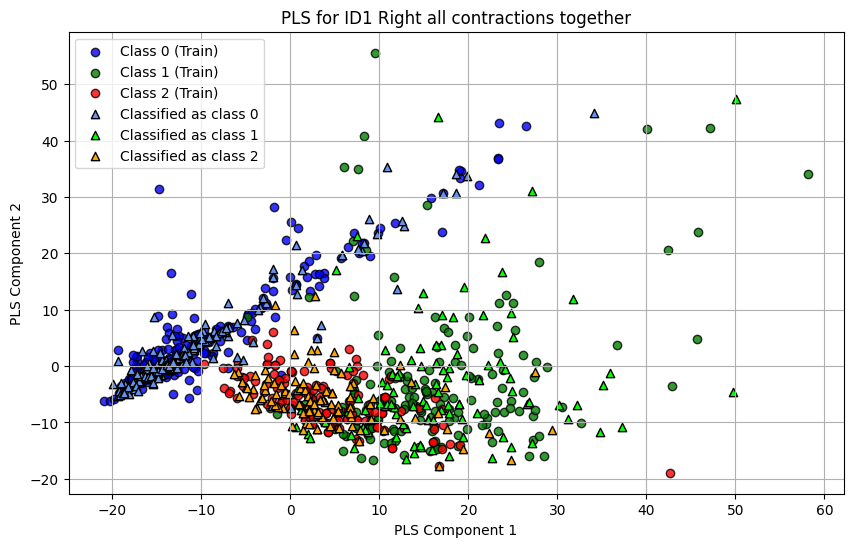

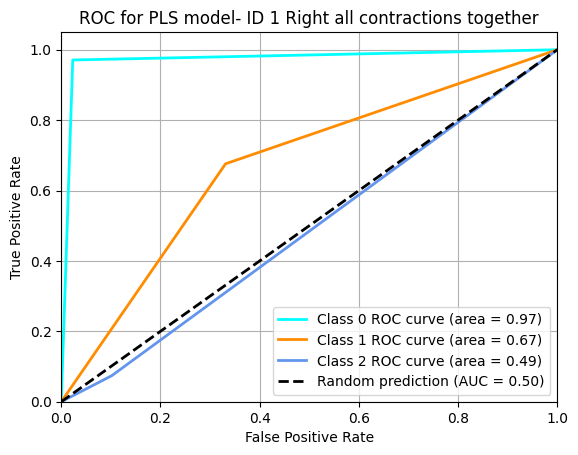

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       206
           1       0.41      0.68      0.51       108
           2       0.20      0.07      0.11       108

    accuracy                           0.67       422
   macro avg       0.53      0.57      0.53       422
weighted avg       0.63      0.67      0.63       422



In [179]:
#PLS

#Training the model and plotting the predictions
id1_tudo_pls_result, id1_tudo_pls_X_pls, id1_tudo_pls_y_score, id1_tudo_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 Right all contractions together')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 Right all contractions together')

#Unbinarizing the data
id1_tudo_pls_y_class_score = np.argmax(np.array(id1_tudo_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_tudo_pls_y_class_score))


SVM

Training time: 1142.7846 ms
Testing/prediction time: 412.3721 ms
Accuracy: 92.42%


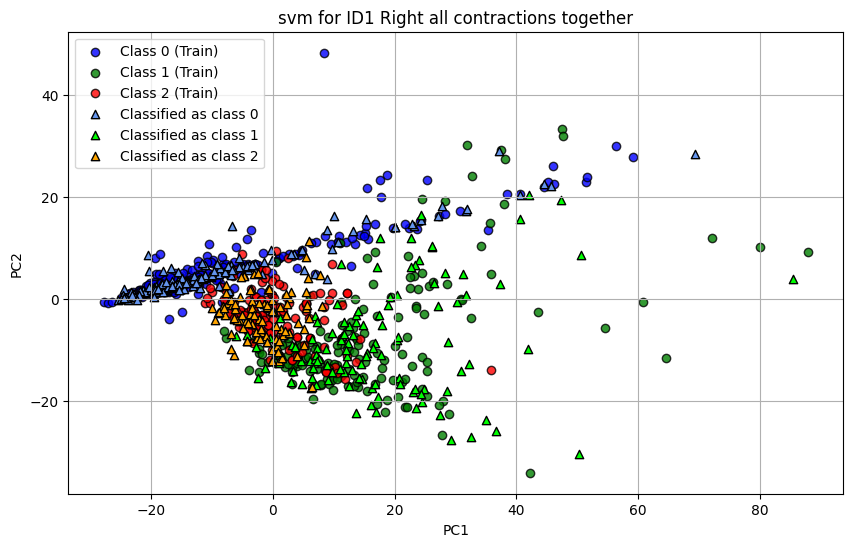

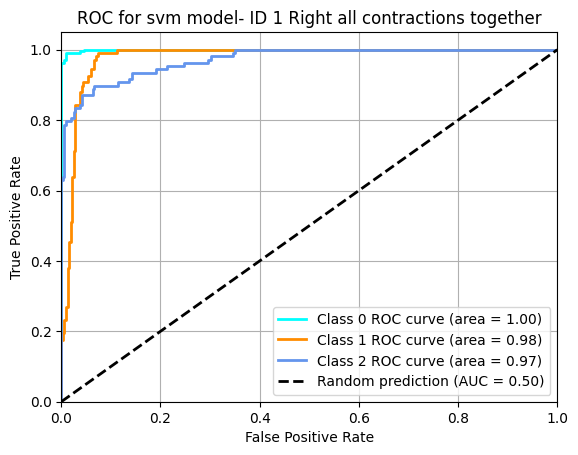

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       206
           1       0.84      0.94      0.89       108
           2       0.89      0.82      0.86       108

    accuracy                           0.92       422
   macro avg       0.91      0.91      0.91       422
weighted avg       0.93      0.92      0.92       422



In [180]:
#SVM

#Training the model and plotting the predictions
id1_tudo_svm_result, id1_tudo_svm_X_svm, id1_tudo_svm_y_score, id1_tudo_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 Right all contractions together')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 Right all contractions together')

#Classification Report
print(classification_report(y_test, id1_tudo_svm_y_class_score))

ANN

Training time: 12871.9795 ms
14/14 [==============================] - 0s 3ms/step
Testing/prediction time: 242.3048 ms


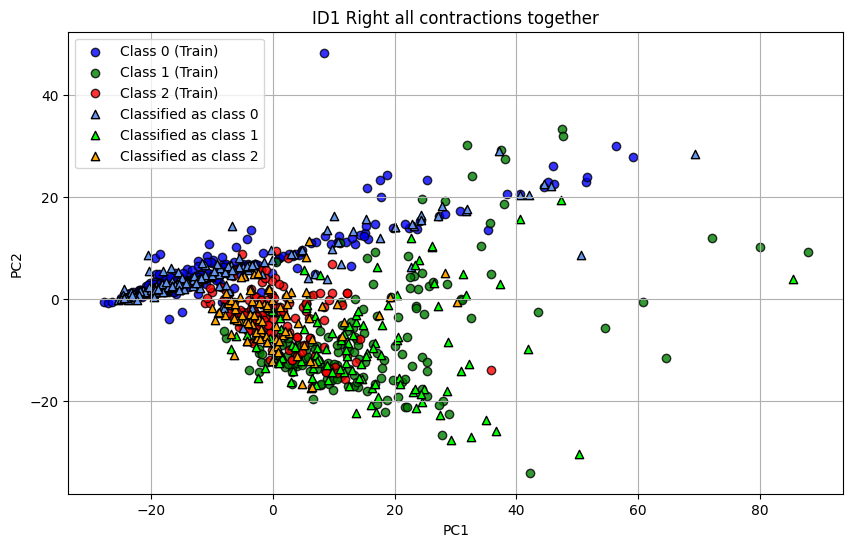

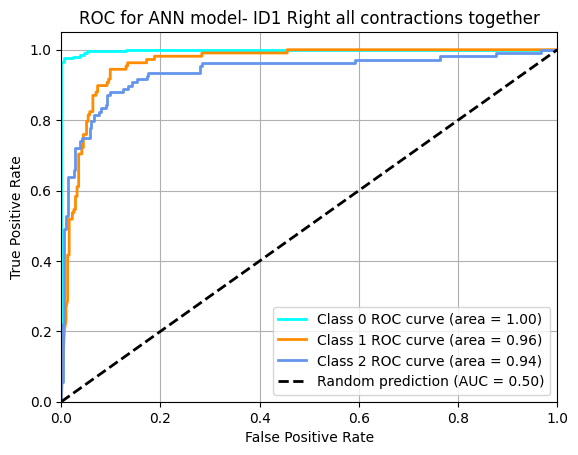

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       206
           1       0.82      0.87      0.85       108
           2       0.86      0.75      0.80       108

    accuracy                           0.90       422
   macro avg       0.88      0.87      0.87       422
weighted avg       0.90      0.90      0.90       422



In [181]:
#ANN

id1_tudo_ann_model, id1_tudo_ann_y_score, id1_tudo_ann_y_class_score, id1_tudo_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ID1 Right all contractions together')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 Right all contractions together')

#Classification Report
print(classification_report(y_test, id1_tudo_ann_y_class_score))

### RAW (Left)  !!!!!!!!!!!!!!!!!!!!!!!!

In [190]:
"""bf1 = pd.read_csv('/content/ID1-RAW1-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID1-RAW2-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf3 = pd.read_csv('/content/ID1-RAW3-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf4 = pd.read_csv('/content/ID1-RAW4-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')

bf_combined = pd.concat([bf1, bf2, bf3, bf4], ignore_index=True)

#Salvar o arquivo combinado se quiser
bf_combined.to_csv('/content/ID1-RAW-BF-Esquerdo-arquivo_combinado.txt', sep='\t', index=False)

rf1 = pd.read_csv('/content/ID1-RAW1-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID1-RAW2-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf3 = pd.read_csv('/content/ID1-RAW3-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf4 = pd.read_csv('/content/ID1-RAW4-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')

rf_combined = pd.concat([rf1, rf2, rf3, rf4], ignore_index=True)

#Salvar o arquivo combinado se quiser
rf_combined.to_csv('/content/ID1-RAW-RF-Esquerdo-arquivo_combinado.txt', sep='\t', index=False)"""

In [201]:
#Biceps femoral

bf1 = pd.read_csv('/content/Dif-ID1-RAW1-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/Dif-ID1-RAW2-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
bf3 = pd.read_csv('/content/RAW-BF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
bf4 = pd.read_csv('/content/BF-Esquerdo-RAW-10ContracoesSucessivasEmPe.txt', delimiter = '\t')
bf5 = pd.read_csv('/content/BF-Esquerdo-RAW-10ContracoesSucessivasDeitado.txt', delimiter = '\t')
bf6 = pd.read_csv('/content/ID1-RAW-BF-Esquerdo-arquivo_combinado.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2, bf3, bf4, bf5, bf6], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/Dif-ID1-RAW1-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/Dif-ID1-RAW2-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
rf3 = pd.read_csv('/content/Dif-ID1-RAW2-RF-Esquerdo-50ContracoesSucessivas.txt', delimiter = '\t')
rf4 = pd.read_csv('/content/RF-Esquerdo-RAW-10ContracoesSucessivas.txt', delimiter = '\t')
rf5 = pd.read_csv('/content/RF-Esquerdo-RAW-10ContracoesRapidasSucessivas.txt', delimiter = '\t')
rf6 = pd.read_csv('/content/ID1-RAW-RF-Esquerdo-arquivo_combinado.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2, rf3, rf4, rf5, rf6], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento

#Juntando os dois
dados = bf_data + rf_data
id1_tudo_df = pd.DataFrame(dados)

# Filtrando as linhas onde 'Sinal' é um array vazio
id1_tudo_df = id1_tudo_df[id1_tudo_df['Sinal'].apply(lambda x: len(x) != 0)]
id1_tudo_df = id1_tudo_df[~id1_tudo_df['Sinal'].isna()]
id1_tudo_df = id1_tudo_df.dropna(subset=['Sinal'])
id1_tudo_df

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


,Label,Sinal,Classe
1,BF_Contraction_number_1,"[18.511897359679097, 96.71189735967891, 135.81...",1
2,BF_Contraction_number_2,"[135.81189735967928, 130.92189735967895, 101.6...",1
3,BF_Contraction_number_3,"[59.68810264032072, 103.67810264032096, 172.10...",1
4,BF_Contraction_number_4,"[23.40189735967897, 111.37189735967922, 135.81...",1
5,BF_Contraction_number_5,"[59.68810264032072, 86.93189735967917, 204.241...",1
...,...,...,...
1165,RF_BaseLine_number_268,"[16.158886512997015, 16.158886512997015, 6.388...",0
1166,RF_BaseLine_number_269,"[37.60111348700275, 32.72111348700264, 3.39111...",0
1167,RF_BaseLine_number_270,"[3.3911134870027126, 11.268886512997142, 35.70...",0
1168,RF_BaseLine_number_271,"[16.158886512997015, 11.268886512997142, 11.26...",0


Applying the models

In [202]:
#Shuffling the data
X = np.array(id1_tudo_df['Sinal'].tolist())
y = np.array(id1_tudo_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)


#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


The data was shuffled 10 times with the last random state parameter being also 10


PCA

In [203]:
id1_tudo_X_train_pca, id1_tudo_pca_centroids, id1_tudo_pca_y_score, id1_tudo_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id1_tudo_pca_y_class_score))

ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

LDA

In [ ]:
#LDA

#Training the model and plotting the predictions
id1_tudo_lda_result, id1_tudo_lda_X_lda, id1_tudo_lda_y_score, id1_tudo_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_tudo_lda_y_class_score))

QDA

In [ ]:
#QDA
#Training the model and plotting the predictions
id1_tudo_qda_result, id1_tudo_qda_X_qda, id1_tudo_qda_y_score, id1_tudo_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_tudo_qda_y_class_score))


PLS

In [ ]:
#PLS

#Training the model and plotting the predictions
id1_tudo_pls_result, id1_tudo_pls_X_pls, id1_tudo_pls_y_score, id1_tudo_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 1 mixing two different days data')

#Unbinarizing the data
id1_tudo_pls_y_class_score = np.argmax(np.array(id1_tudo_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id1_tudo_pls_y_class_score))


SVM

In [ ]:
#SVM

#Training the model and plotting the predictions
id1_tudo_svm_result, id1_tudo_svm_X_svm, id1_tudo_svm_y_score, id1_tudo_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID1 mixing two different days data')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_tudo_svm_y_class_score))


ANN

In [ ]:
#ANN

id1_tudo_ann_model, id1_tudo_ann_y_score, id1_tudo_ann_y_class_score, id1_tudo_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title= 'ID1 Mixing two different days data')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id1_tudo_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID1 mixing two different days data')

#Classification Report
print(classification_report(y_test, id1_tudo_ann_y_class_score))


# Indivíduo 2- Daniel

## RAW (Right)

In [205]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID2-RAW1-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID2-RAW2-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'][500:])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/ID2-RAW1-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID2-RAW2-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id2_df = pd.DataFrame(dados)
id2_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[27.702411529274286, 37.47241152927427, 37.472...",1
1,BF_Contraction_number_1,"[37.47241152927427, 37.47241152927427, 32.5924...",1
2,BF_Contraction_number_2,"[76.57241152927418, 86.35241152927438, 22.8124...",1
3,BF_Contraction_number_3,"[37.47241152927427, 37.47241152927427, 37.4724...",1
4,BF_Contraction_number_4,"[13.042411529274432, 17.92241152927454, 8.1524...",1
...,...,...,...
199,RF_BaseLine_number_47,"[11.528458492085974, 11.528458492085974, 8.021...",0
200,RF_BaseLine_number_48,"[32.46154150791381, 8.021541507914208, 3.13154...",0
201,RF_BaseLine_number_49,"[8.021541507914208, 1.7584584920859925, 3.1315...",0
202,RF_BaseLine_number_50,"[8.021541507914208, 8.021541507914208, 22.6815...",0


Aplicando os modelos nos dados

In [206]:
#Shuffling the data
X = np.array(id2_df['Sinal'].tolist())
y = np.array(id2_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA (Acertar o título)

Training time: 43.9129 ms
Testing/prediction time: 1.3633 ms


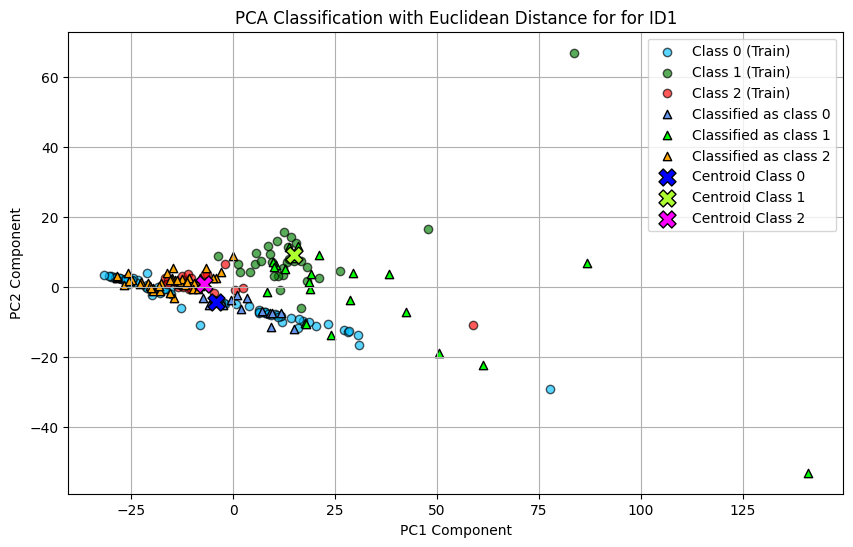

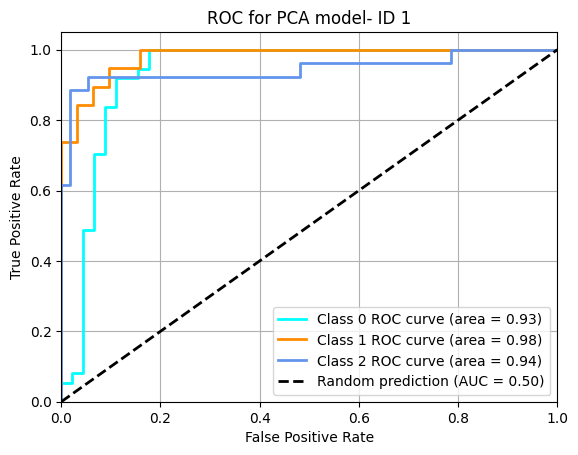

              precision    recall  f1-score   support

           0       0.77      0.27      0.40        37
           1       0.74      0.89      0.81        19
           2       0.52      0.92      0.67        26

    accuracy                           0.62        82
   macro avg       0.68      0.70      0.63        82
weighted avg       0.68      0.62      0.58        82



In [207]:
#PCA
id2_X_train_pca, id2_pca_centroids, id2_pca_y_score, id2_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id2_pca_y_class_score))

LDA

Training time: 343.4157 ms
Testing/prediction time: 1.9820 ms
Accuracy: 64.63%


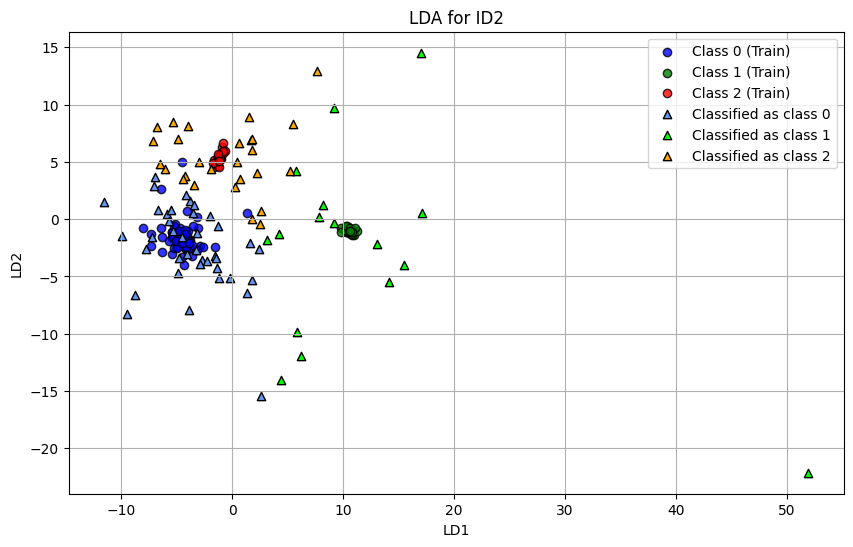

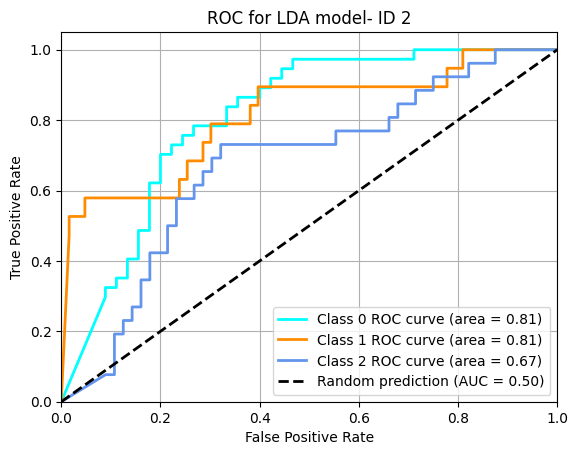

              precision    recall  f1-score   support

           0       0.72      0.76      0.74        37
           1       0.69      0.58      0.63        19
           2       0.52      0.54      0.53        26

    accuracy                           0.65        82
   macro avg       0.64      0.62      0.63        82
weighted avg       0.65      0.65      0.65        82



In [208]:
#Training the model and plotting the predictions
id2_lda_result, id2_lda_X_lda, id2_lda_y_score, id2_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 2')

#Classification Report
print(classification_report(y_test, id2_lda_y_class_score))


QDA

Training time: 28.0802 ms
Testing/prediction time: 5.4717 ms
Accuracy: 48.78%


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


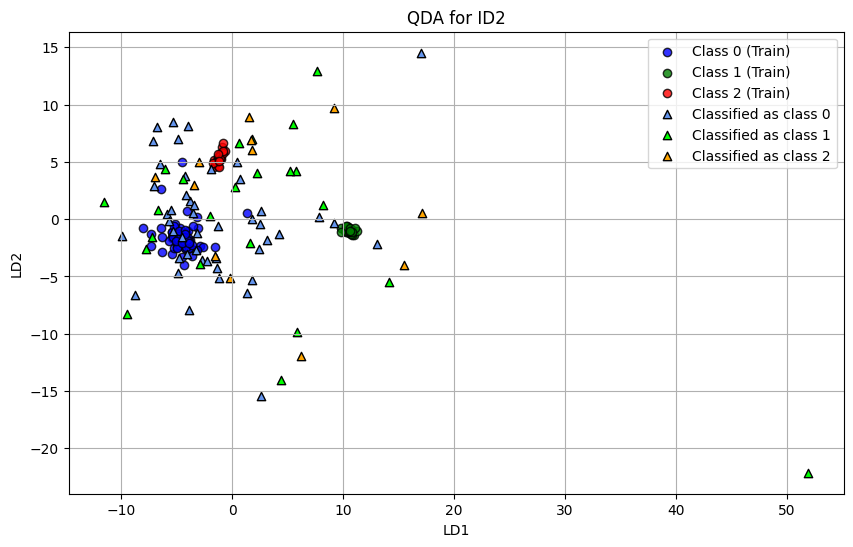

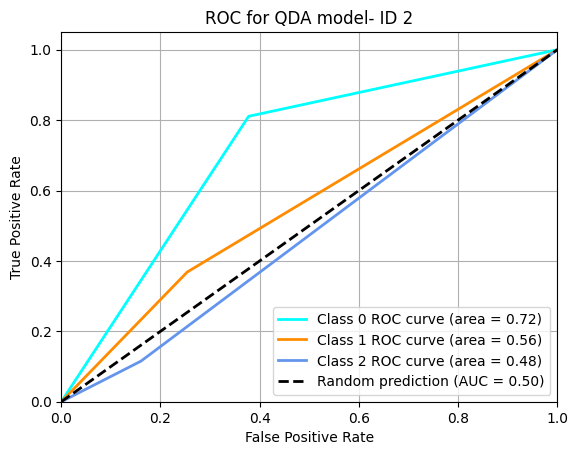

              precision    recall  f1-score   support

           0       0.64      0.81      0.71        37
           1       0.30      0.37      0.33        19
           2       0.25      0.12      0.16        26

    accuracy                           0.49        82
   macro avg       0.40      0.43      0.40        82
weighted avg       0.44      0.49      0.45        82



In [209]:
#Training the model and plotting the predictions
id2_qda_result, id2_qda_X_qda, id2_qda_y_score, id2_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 2')

#Classification Report
print(classification_report(y_test, id2_qda_y_class_score))

PLS

Training time: 14.3509 ms
Testing/prediction time: 4.1499 ms


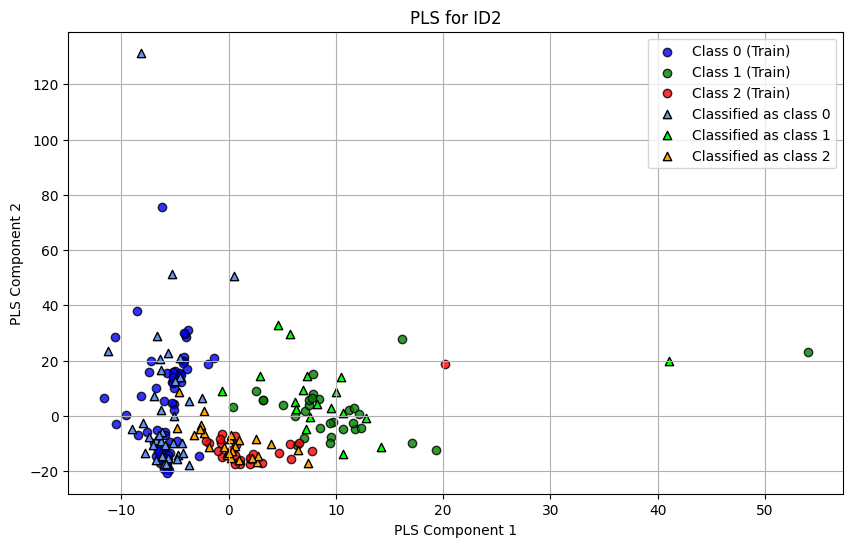

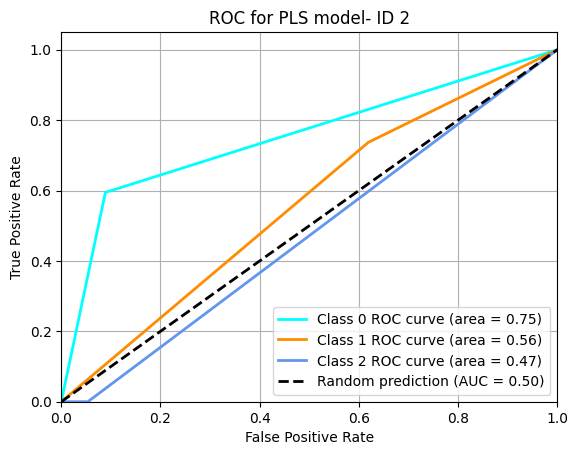

              precision    recall  f1-score   support

           0       0.85      0.59      0.70        37
           1       0.26      0.74      0.39        19
           2       0.00      0.00      0.00        26

    accuracy                           0.44        82
   macro avg       0.37      0.44      0.36        82
weighted avg       0.44      0.44      0.41        82



In [210]:
#Training the model and plotting the predictions
id2_pls_result, id2_pls_X_pls, id2_pls_y_score, id2_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 2')

#Unbinarizing the data
id2_pls_y_class_score = np.argmax(np.array(id2_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id2_pls_y_class_score))

SVM

Training time: 33.0215 ms
Testing/prediction time: 12.3756 ms
Accuracy: 92.68%


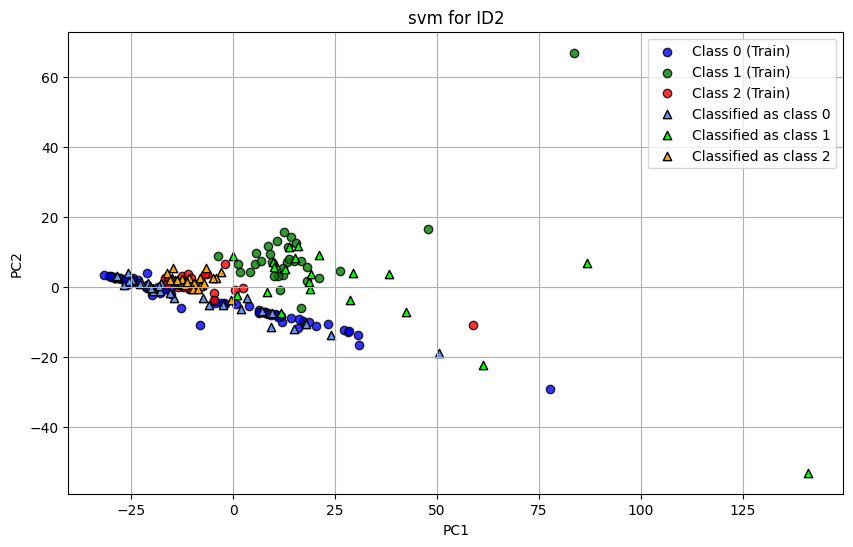

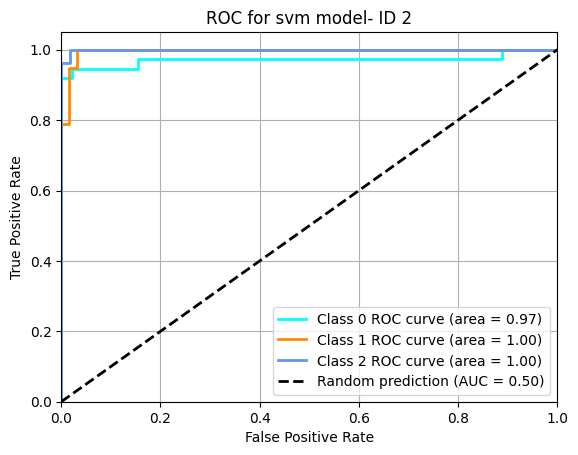

              precision    recall  f1-score   support

           0       0.92      0.95      0.93        37
           1       0.86      1.00      0.93        19
           2       1.00      0.85      0.92        26

    accuracy                           0.93        82
   macro avg       0.93      0.93      0.93        82
weighted avg       0.93      0.93      0.93        82



In [211]:
# SVM
#Training the model and plotting the predictions
id2_svm_result, id2_svm_X_svm, id2_svm_y_score, id2_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 2' )
#Classification Report
print(classification_report(y_test, id2_svm_y_class_score))

ANN

Training time: 1897.3582 ms
3/3 [==============================] - 0s 7ms/step
Testing/prediction time: 181.6468 ms


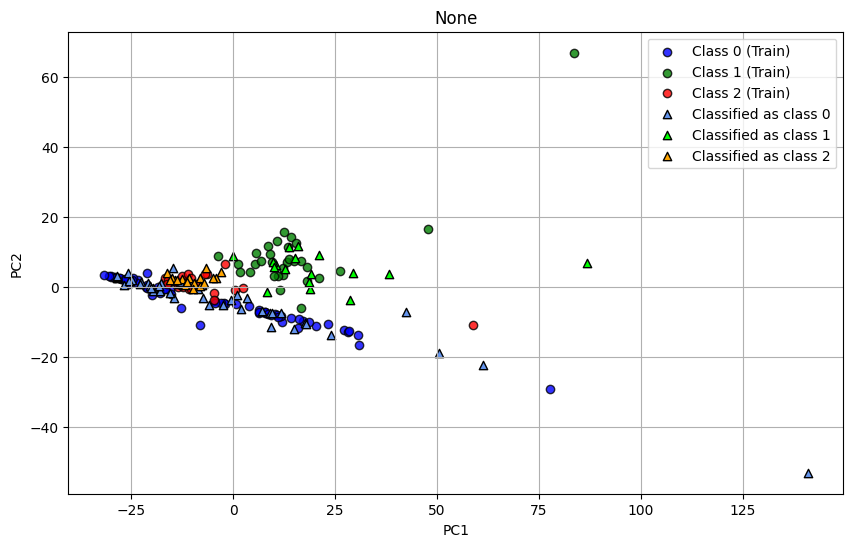

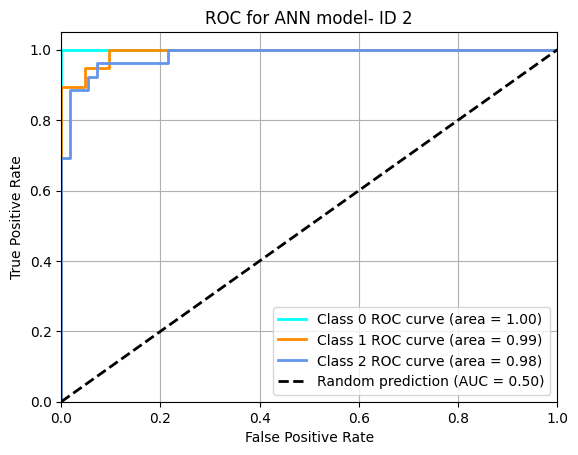

              precision    recall  f1-score   support

           0       0.79      1.00      0.88        37
           1       1.00      0.89      0.94        19
           2       1.00      0.69      0.82        26

    accuracy                           0.88        82
   macro avg       0.93      0.86      0.88        82
weighted avg       0.90      0.88      0.88        82



In [212]:
#ANN
id2_ann_model, id2_ann_y_score, id2_ann_y_class_score, id2_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title=None)

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 2')

#Classification Report
print(classification_report(y_test, id2_ann_y_class_score))

## RAW (Left)

In [215]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID2-RAW1-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID2-RAW2-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'][500:])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento

#Reto Femoral
rf1 = pd.read_csv('/content/ID2-RAW1-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID2-RAW2-RF-Esquerdo-25ContracoesSucessivas .txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id2_df = pd.DataFrame(dados)
# Filtrando as linhas onde 'Sinal' é um array vazio
id2_df = id2_df[id2_df['Sinal'].apply(lambda x: len(x) != 0)]

id2_df

,Label,Sinal,Classe
1,BF_Contraction_number_1,"[11.15262410510013, 16.03262410510024, 11.1526...",1
2,BF_Contraction_number_2,"[1.3726241050999306, 3.517375894899942, 16.032...",1
3,BF_Contraction_number_3,"[6.262624105100258, 6.262624105100258, 6.26262...",1
4,BF_Contraction_number_4,"[30.702624105099858, 25.812624105099985, 20.92...",1
5,BF_Contraction_number_5,"[45.36262410510017, 35.58262410509997, 35.5826...",1
...,...,...,...
177,RF_BaseLine_number_46,"[2.2622637219428725, 2.627736278057, 12.407736...",0
178,RF_BaseLine_number_47,"[7.152263721942745, 12.032263721942854, 16.922...",0
179,RF_BaseLine_number_48,"[51.13226372194276, 51.13226372194276, 46.2522...",0
180,RF_BaseLine_number_49,"[46.25226372194311, 7.152263721942745, 12.4077...",0


Applying the models

In [216]:
#Shuffling the data
X = np.array(id2_df['Sinal'].tolist())
y = np.array(id2_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 84.2962 ms
Testing/prediction time: 10.3292 ms


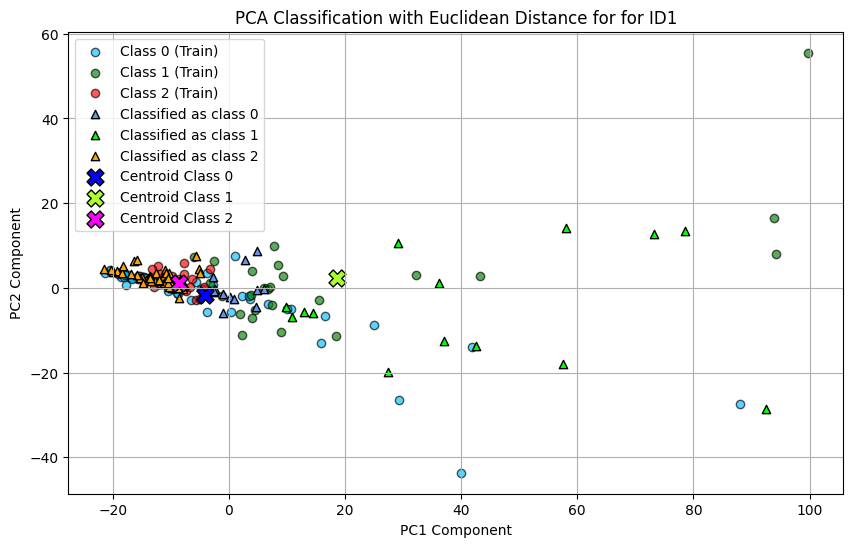

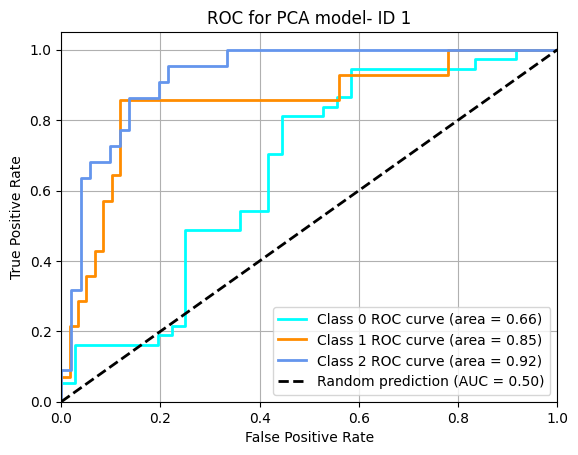

              precision    recall  f1-score   support

           0       0.54      0.19      0.28        37
           1       0.57      0.57      0.57        14
           2       0.48      1.00      0.65        22

    accuracy                           0.51        73
   macro avg       0.53      0.59      0.50        73
weighted avg       0.53      0.51      0.45        73



In [223]:
#PCA
id2_X_train_pca, id2_pca_centroids, id2_pca_y_score, id2_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id2_pca_y_class_score))

LDA

Training time: 119.9710 ms
Testing/prediction time: 8.0965 ms
Accuracy: 64.38%


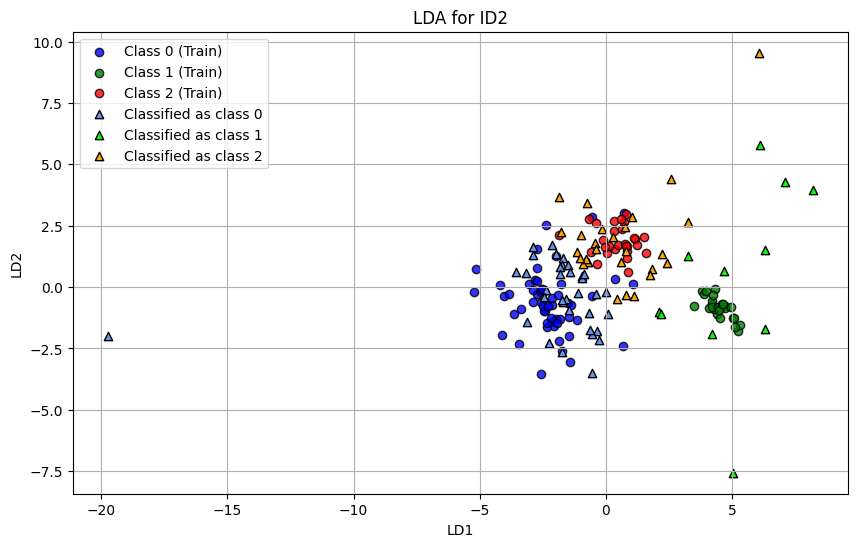

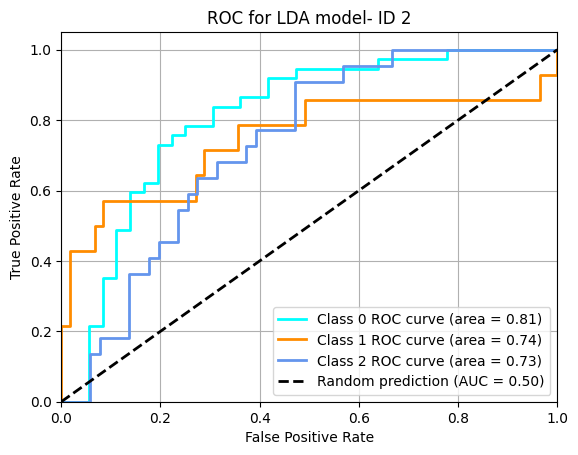

              precision    recall  f1-score   support

           0       0.77      0.73      0.75        37
           1       0.64      0.50      0.56        14
           2       0.48      0.59      0.53        22

    accuracy                           0.64        73
   macro avg       0.63      0.61      0.61        73
weighted avg       0.66      0.64      0.65        73



In [218]:
#Training the model and plotting the predictions
id2_lda_result, id2_lda_X_lda, id2_lda_y_score, id2_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 2')

#Classification Report
print(classification_report(y_test, id2_lda_y_class_score))


QDA

Training time: 34.6236 ms
Testing/prediction time: 10.8349 ms
Accuracy: 49.32%


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


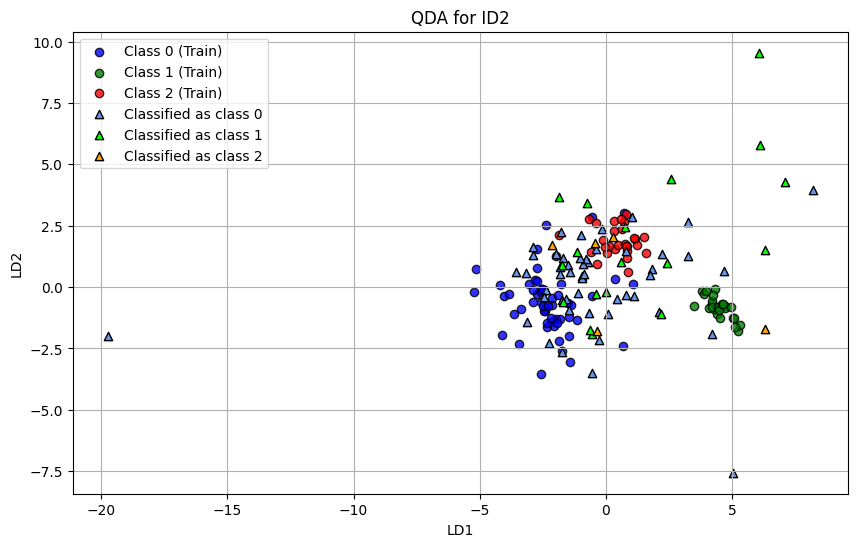

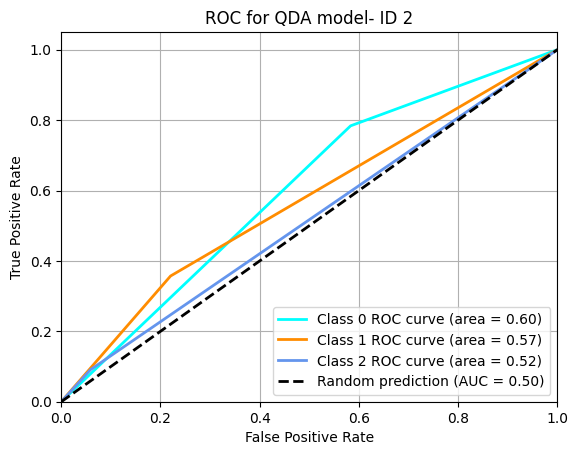

              precision    recall  f1-score   support

           0       0.58      0.78      0.67        37
           1       0.28      0.36      0.31        14
           2       0.40      0.09      0.15        22

    accuracy                           0.49        73
   macro avg       0.42      0.41      0.38        73
weighted avg       0.47      0.49      0.44        73



In [219]:
#Training the model and plotting the predictions
id2_qda_result, id2_qda_X_qda, id2_qda_y_score, id2_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 2')

#Classification Report
print(classification_report(y_test, id2_qda_y_class_score))

PLS

Training time: 11.6735 ms
Testing/prediction time: 6.2237 ms


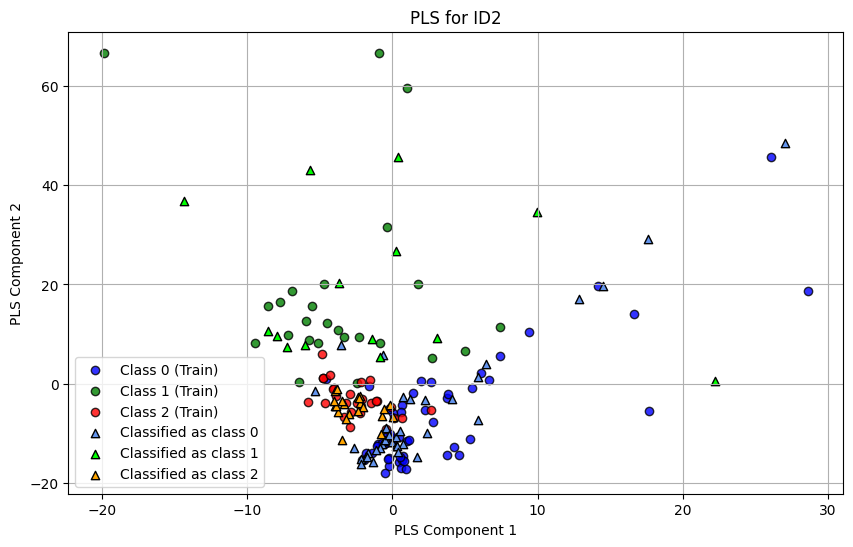

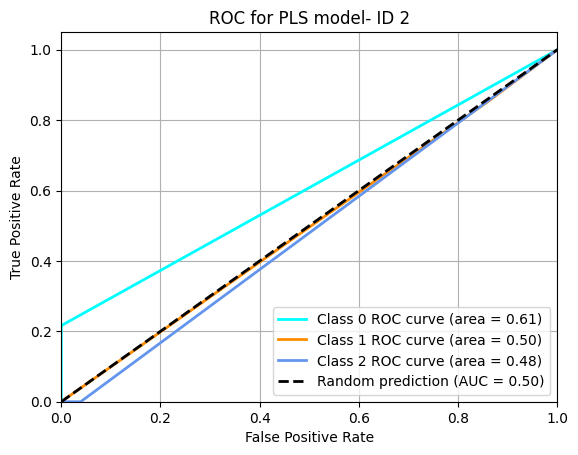

              precision    recall  f1-score   support

           0       1.00      0.22      0.36        37
           1       0.19      0.86      0.31        14
           2       0.00      0.00      0.00        22

    accuracy                           0.27        73
   macro avg       0.40      0.36      0.22        73
weighted avg       0.54      0.27      0.24        73



In [220]:
#Training the model and plotting the predictions
id2_pls_result, id2_pls_X_pls, id2_pls_y_score, id2_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 2')

#Unbinarizing the data
id2_pls_y_class_score = np.argmax(np.array(id2_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id2_pls_y_class_score))

SVM

Training time: 66.4272 ms
Testing/prediction time: 27.1161 ms
Accuracy: 67.12%


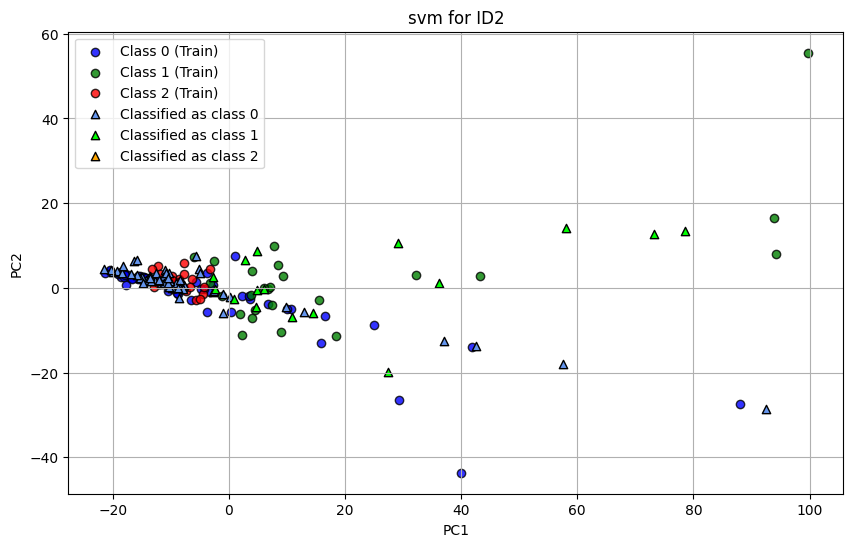

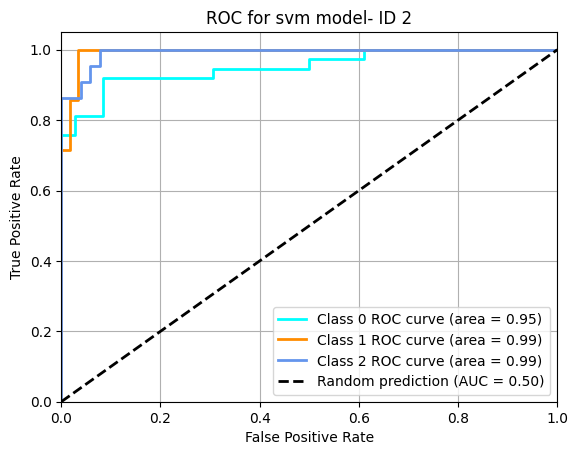

              precision    recall  f1-score   support

           0       0.61      0.95      0.74        37
           1       0.88      1.00      0.93        14
           2       0.00      0.00      0.00        22

    accuracy                           0.67        73
   macro avg       0.50      0.65      0.56        73
weighted avg       0.48      0.67      0.56        73



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [221]:
# SVM
#Training the model and plotting the predictions
id2_svm_result, id2_svm_X_svm, id2_svm_y_score, id2_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID2')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 2' )
#Classification Report
print(classification_report(y_test, id2_svm_y_class_score))

ANN

Training time: 3658.6773 ms
3/3 [==============================] - 0s 4ms/step
Testing/prediction time: 137.4676 ms


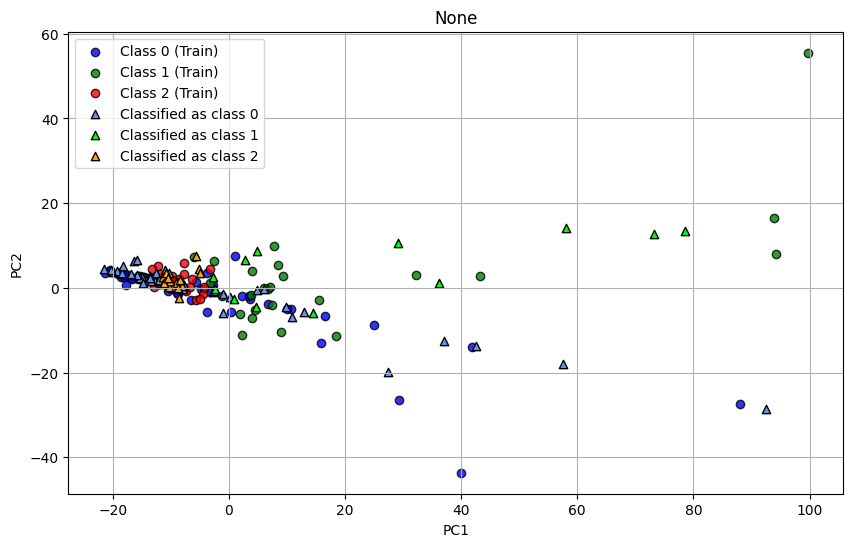

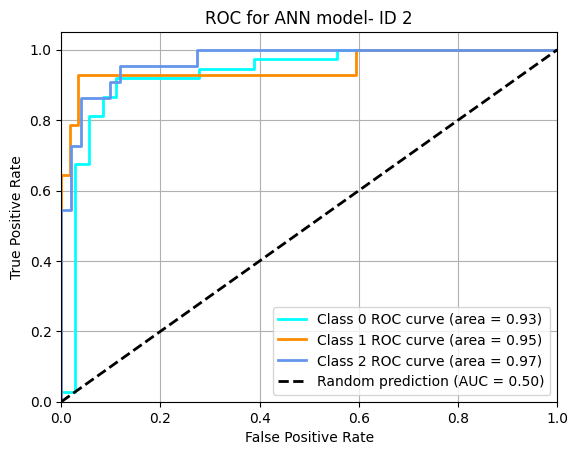

              precision    recall  f1-score   support

           0       0.78      0.95      0.85        37
           1       0.92      0.79      0.85        14
           2       0.94      0.68      0.79        22

    accuracy                           0.84        73
   macro avg       0.88      0.80      0.83        73
weighted avg       0.85      0.84      0.83        73



In [222]:
#ANN
id2_ann_model, id2_ann_y_score, id2_ann_y_class_score, id2_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title=None)

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id2_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 2')

#Classification Report
print(classification_report(y_test, id2_ann_y_class_score))

# Indivíduo 3- Roberto

## RAW (Right)

In [224]:
#Biceps femoral

bf1 = pd.read_csv('/content/ID3-RAW1-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID3-RAW2-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 100, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID3-RAW1-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID3-RAW2-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 70, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id3_df = pd.DataFrame(dados)
id3_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[61.743428136689545, 56.85342813668922, 47.073...",1
1,BF_Contraction_number_1,"[11.576571863310619, 32.41342813668916, 32.413...",1
2,BF_Contraction_number_2,"[6.686571863310746, 1.7965718633108736, 17.753...",1
3,BF_Contraction_number_3,"[37.30342813668949, 37.30342813668949, 7.97342...",1
4,BF_Contraction_number_4,"[37.30342813668949, 42.19342813668936, 51.9634...",1
...,...,...,...
203,RF_BaseLine_number_47,"[7.793455410015213, 27.34345541001494, 32.2334...",0
204,RF_BaseLine_number_48,"[27.34345541001494, 17.573455410014958, 12.683...",0
205,RF_BaseLine_number_49,"[61.563455410015195, 61.563455410015195, 66.44...",0
206,RF_BaseLine_number_50,"[51.783455410014994, 51.783455410014994, 46.89...",0


Applying the models

In [225]:
#Shuffling the data
X = np.array(id3_df['Sinal'].tolist())
y = np.array(id3_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 81.5263 ms
Testing/prediction time: 1.7135 ms


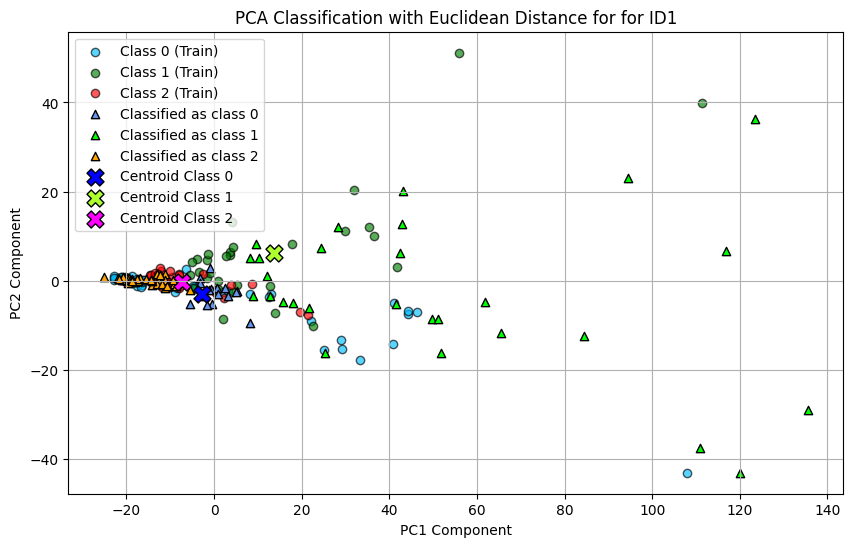

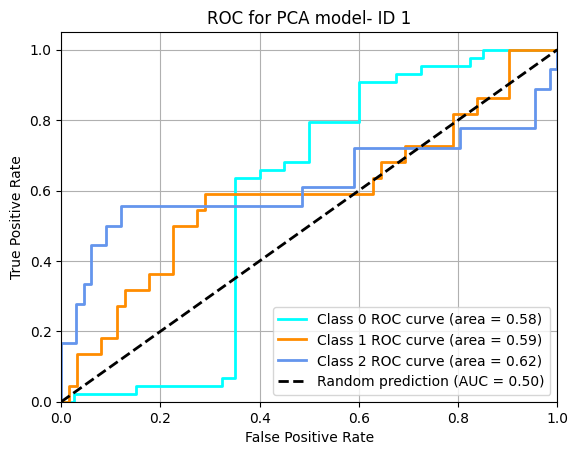

              precision    recall  f1-score   support

           0       0.19      0.07      0.10        44
           1       0.39      0.50      0.44        22
           2       0.25      0.56      0.34        18

    accuracy                           0.29        84
   macro avg       0.28      0.37      0.29        84
weighted avg       0.25      0.29      0.24        84



In [226]:
#PCA
id3_X_train_pca, id3_pca_centroids, id3_pca_y_score, id3_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id3_pca_y_class_score))

LDA

Training time: 38.0576 ms
Testing/prediction time: 5.2371 ms
Accuracy: 46.43%


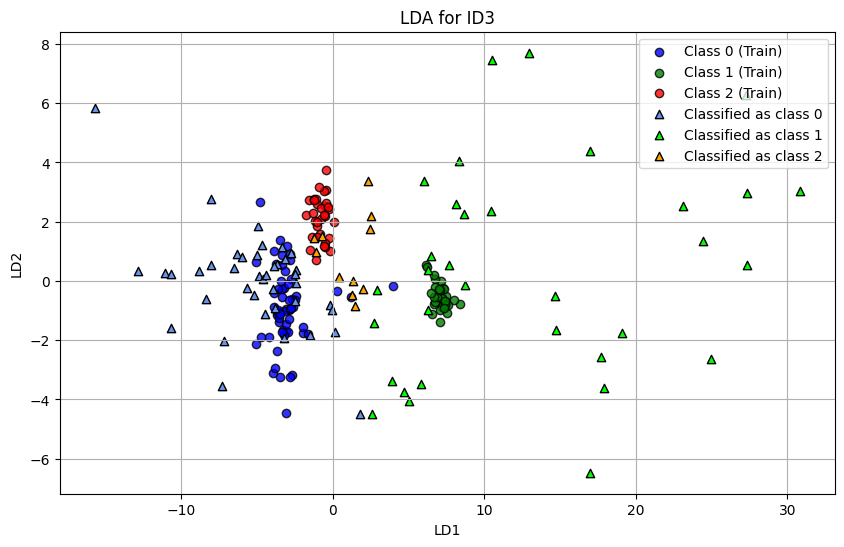

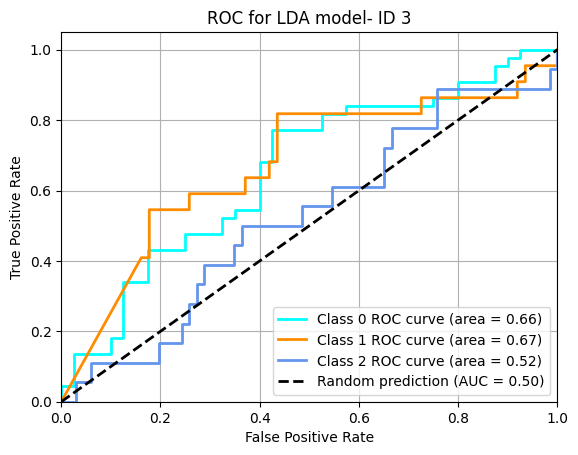

              precision    recall  f1-score   support

           0       0.60      0.55      0.57        44
           1       0.39      0.59      0.47        22
           2       0.18      0.11      0.14        18

    accuracy                           0.46        84
   macro avg       0.39      0.42      0.39        84
weighted avg       0.46      0.46      0.45        84



In [227]:
# LDA
#Training the model and plotting the predictions
id3_lda_result, id3_lda_X_lda, id3_lda_y_score, id3_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 3')

#Classification Report
print(classification_report(y_test, id3_lda_y_class_score))

QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 43.2942 ms
Testing/prediction time: 30.5645 ms
Accuracy: 40.48%


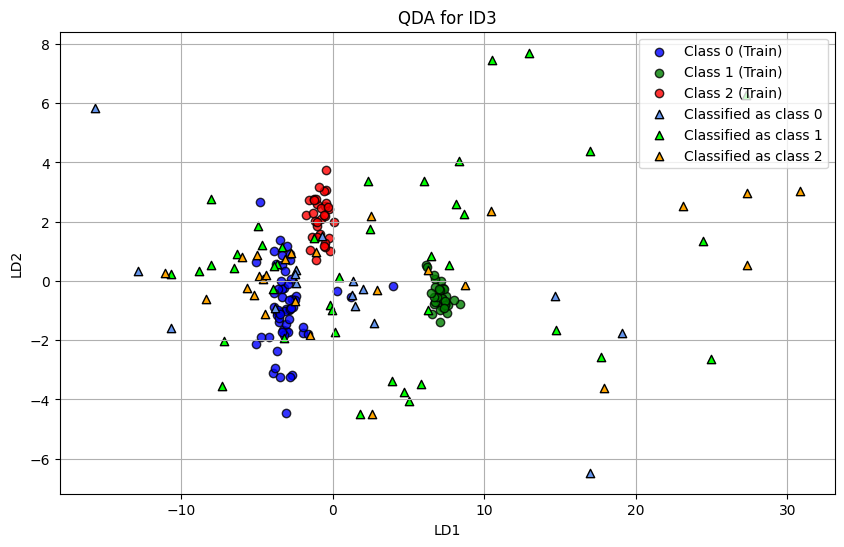

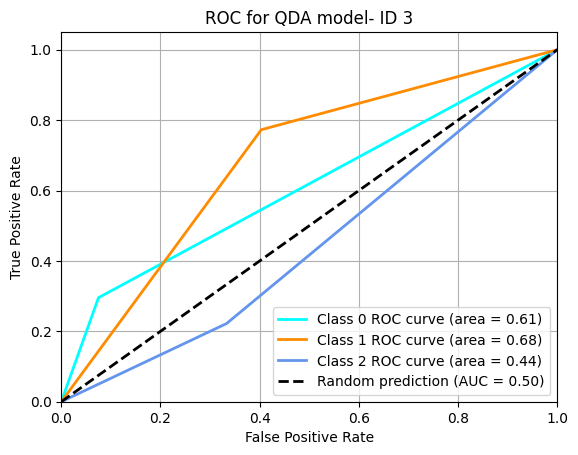

              precision    recall  f1-score   support

           0       0.81      0.30      0.43        44
           1       0.40      0.77      0.53        22
           2       0.15      0.22      0.18        18

    accuracy                           0.40        84
   macro avg       0.46      0.43      0.38        84
weighted avg       0.56      0.40      0.41        84



In [228]:
# QDA
#Training the model and plotting the predictions
id3_qda_result, id3_qda_X_qda, id3_qda_y_score, id3_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 3')

#Classification Report
print(classification_report(y_test, id3_qda_y_class_score))

PLS

Training time: 15.0428 ms
Testing/prediction time: 3.7627 ms


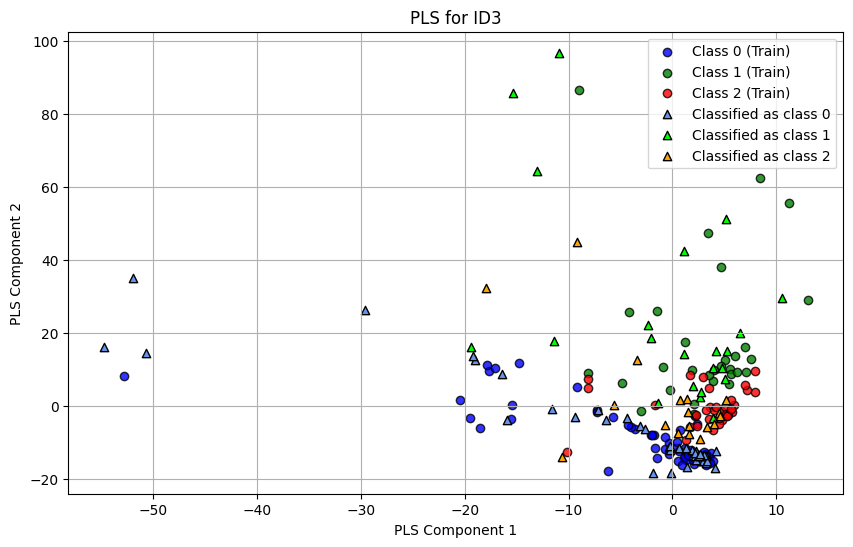

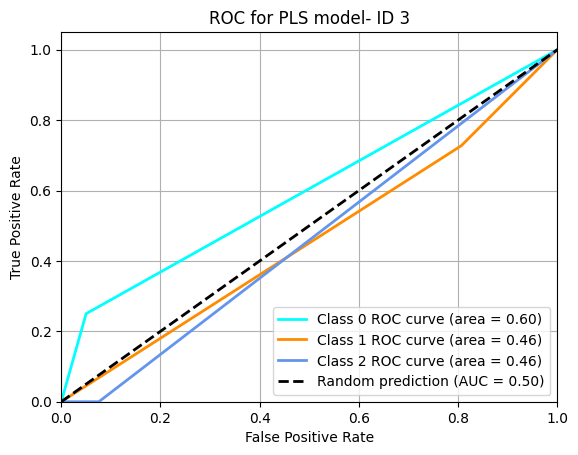

              precision    recall  f1-score   support

           0       0.85      0.25      0.39        44
           1       0.24      0.73      0.36        22
           2       0.00      0.00      0.00        18

    accuracy                           0.32        84
   macro avg       0.36      0.33      0.25        84
weighted avg       0.51      0.32      0.30        84



In [229]:
# PLS
#Training the model and plotting the predictions
id3_pls_result, id3_pls_X_pls, id3_pls_y_score, id3_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 3')

#Unbinarizing the data
id3_pls_y_class_score = np.argmax(np.array(id3_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id3_pls_y_class_score))

SVM

Training time: 39.5548 ms
Testing/prediction time: 16.4428 ms
Accuracy: 77.38%


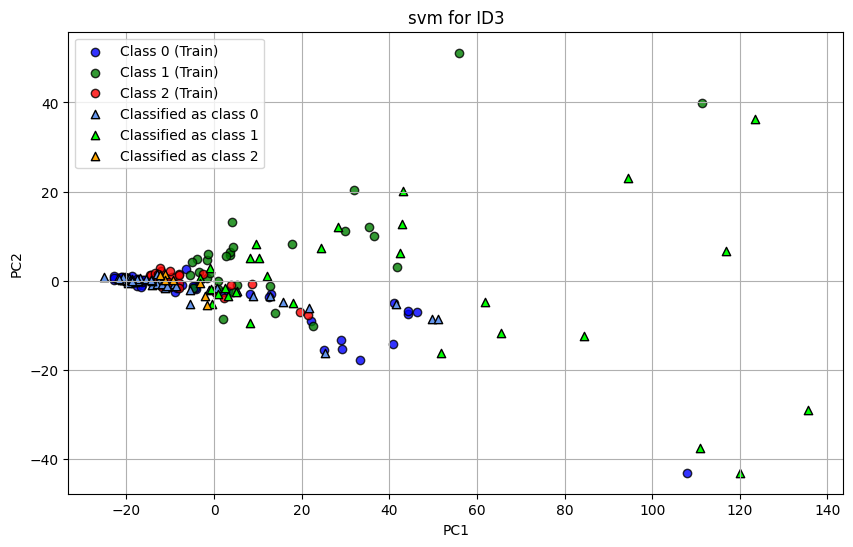

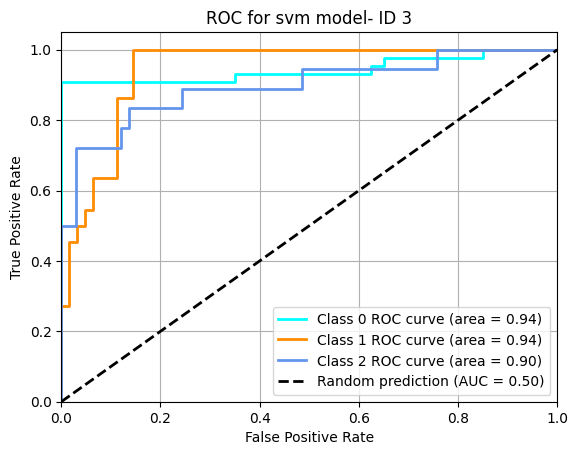

              precision    recall  f1-score   support

           0       0.83      0.91      0.87        44
           1       0.69      0.91      0.78        22
           2       0.71      0.28      0.40        18

    accuracy                           0.77        84
   macro avg       0.75      0.70      0.68        84
weighted avg       0.77      0.77      0.75        84



In [230]:
# SVM
#Training the model and plotting the predictions
id3_svm_result, id3_svm_X_svm, id3_svm_y_score, id3_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 3' )
#Classification Report
print(classification_report(y_test, id3_svm_y_class_score))

ANN

Training time: 2409.0910 ms
3/3 [==============================] - 0s 4ms/step
Testing/prediction time: 249.7561 ms


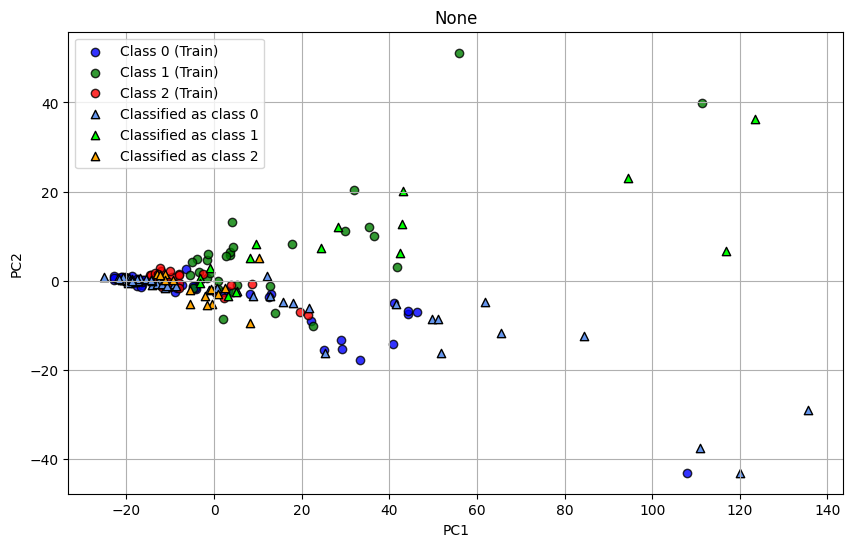

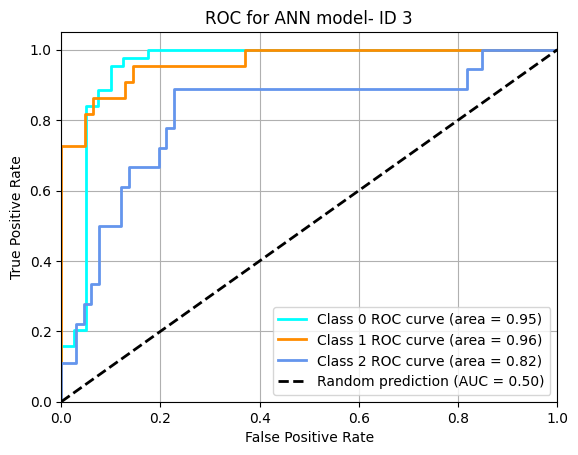

              precision    recall  f1-score   support

           0       0.81      1.00      0.90        44
           1       1.00      0.68      0.81        22
           2       0.60      0.50      0.55        18

    accuracy                           0.81        84
   macro avg       0.80      0.73      0.75        84
weighted avg       0.82      0.81      0.80        84



In [231]:
# ANN
id3_ann_model, id3_ann_y_score, id3_ann_y_class_score, id3_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title=None)

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 3')

#Classification Report
print(classification_report(y_test, id3_ann_y_class_score))

## RAW (Left) !!!!!!!!!!!!!!!!!!!!!!!!!

In [239]:
#Biceps femoral

bf1 = pd.read_csv('/content/ID3-RAW1-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID3-RAW2-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 100, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID3-RAW1-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID3-RAW2-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 70, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id3_df = pd.DataFrame(dados)
# Filtrando as linhas onde 'Sinal' é um array vazio
id3_df = id3_df[id3_df['Sinal'].apply(lambda x: len(x) != 0)]
id3_df = id3_df[id3_df['Sinal'].apply(lambda x: len(x) != None)]
id3_df = id3_df.dropna(subset=['Sinal'])
id3_df = id3_df[~id3_df['Sinal'].isna()]

id3_df

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


,Label,Sinal,Classe
0,BF_Contraction_number_0,"[25.555800701019507, 10.895800701019652, 6.005...",1
1,BF_Contraction_number_1,"[35.33580070101971, 10.895800701019652, 3.7741...",1
2,BF_Contraction_number_2,"[15.785800701019525, 6.00580070101978, 3.77419...",1
3,BF_Contraction_number_3,"[6.00580070101978, 8.65419929898053, 13.544199...",1
4,BF_Contraction_number_4,"[8.65419929898053, 18.434199298980275, 13.5441...",1
...,...,...,...
153,RF_BaseLine_number_50,"[49.57346983263051, 54.45346983263062, 54.4534...",0
154,RF_BaseLine_number_51,"[28.63653016736953, 38.40653016736951, 33.5165...",0
155,RF_BaseLine_number_52,"[15.353469832630708, 10.473469832630599, 0.693...",0
156,RF_BaseLine_number_53,"[20.24346983263058, 10.473469832630599, 5.5834...",0


Applying the models

In [233]:
#Shuffling the data
X = np.array(id3_df['Sinal'].tolist())
y = np.array(id3_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (157,) + inhomogeneous part.

PCA

In [ ]:
#PCA
id3_X_train_pca, id3_pca_centroids, id3_pca_y_score, id3_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID1')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID 1')
#Classification Report
print(classification_report(y_test, id3_pca_y_class_score))

LDA

In [ ]:
# LDA
#Training the model and plotting the predictions
id3_lda_result, id3_lda_X_lda, id3_lda_y_score, id3_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID 3')

#Classification Report
print(classification_report(y_test, id3_lda_y_class_score))

QDA

In [ ]:
# QDA
#Training the model and plotting the predictions
id3_qda_result, id3_qda_X_qda, id3_qda_y_score, id3_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID 3')

#Classification Report
print(classification_report(y_test, id3_qda_y_class_score))

PLS

In [ ]:
# PLS
#Training the model and plotting the predictions
id3_pls_result, id3_pls_X_pls, id3_pls_y_score, id3_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID 3')

#Unbinarizing the data
id3_pls_y_class_score = np.argmax(np.array(id3_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id3_pls_y_class_score))

SVM

In [ ]:
# SVM
#Training the model and plotting the predictions
id3_svm_result, id3_svm_X_svm, id3_svm_y_score, id3_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID3')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID 3' )
#Classification Report
print(classification_report(y_test, id3_svm_y_class_score))

ANN

In [ ]:
# ANN
id3_ann_model, id3_ann_y_score, id3_ann_y_class_score, id3_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title=None)

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id3_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID 3')

#Classification Report
print(classification_report(y_test, id3_ann_y_class_score))

# Indivíduo 4- Manoela

## RAW (Right)

In [27]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID5-RAW1-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID5-RAW2-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID5-RAW1-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID5-RAW2-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id5_df = pd.DataFrame(dados)

id5_df = id5_df[id5_df['Sinal'].apply(lambda x: len(x) != 0)]
id5_df


,Label,Sinal,Classe
0,BF_Contraction_number_0,"[19.005114109211718, 19.005114109211718, 14.12...",1
1,BF_Contraction_number_1,"[54.30488589078868, 44.5348858907887, 20.09488...",1
2,BF_Contraction_number_2,"[4.3451141092114085, 29.864885890788628, 39.64...",1
3,BF_Contraction_number_3,"[73.85488589078841, 83.63488589078861, 88.5148...",1
4,BF_Contraction_number_4,"[49.414885890788355, 24.98488589078852, 24.984...",1
...,...,...,...
179,RF_BaseLine_number_41,"[8.074818829270953, 3.18481882927108, 6.585181...",0
180,RF_BaseLine_number_42,"[1.7051811707287925, 3.18481882927108, 3.18481...",0
181,RF_BaseLine_number_43,"[16.3651811707291, 1.7051811707287925, 3.18481...",0
182,RF_BaseLine_number_44,"[22.734818829271262, 17.854818829271153, 17.85...",0


Applying the models

In [28]:
#Shuffling the data
X = np.array(id5_df['Sinal'].tolist())
y = np.array(id5_df['Classe'])
X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 78.5592 ms
Testing/prediction time: 1.8630 ms


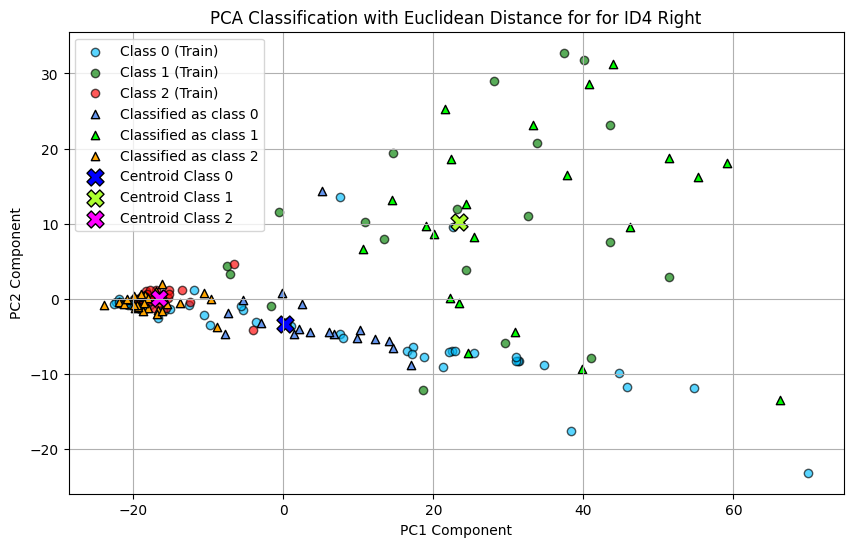

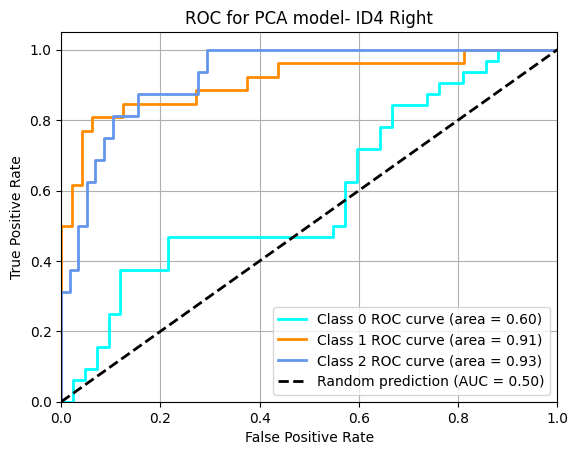

              precision    recall  f1-score   support

           0       0.61      0.34      0.44        32
           1       0.86      0.73      0.79        26
           2       0.47      1.00      0.64        16

    accuracy                           0.62        74
   macro avg       0.65      0.69      0.62        74
weighted avg       0.67      0.62      0.61        74



In [29]:
#PCA
id4_X_train_pca, id4_pca_centroids, id4_pca_y_score, id4_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID4 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id4_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID4 Right')
#Classification Report
print(classification_report(y_test, id4_pca_y_class_score))

LDA

Training time: 897.3684 ms
Testing/prediction time: 8.1565 ms
Accuracy: 71.62%


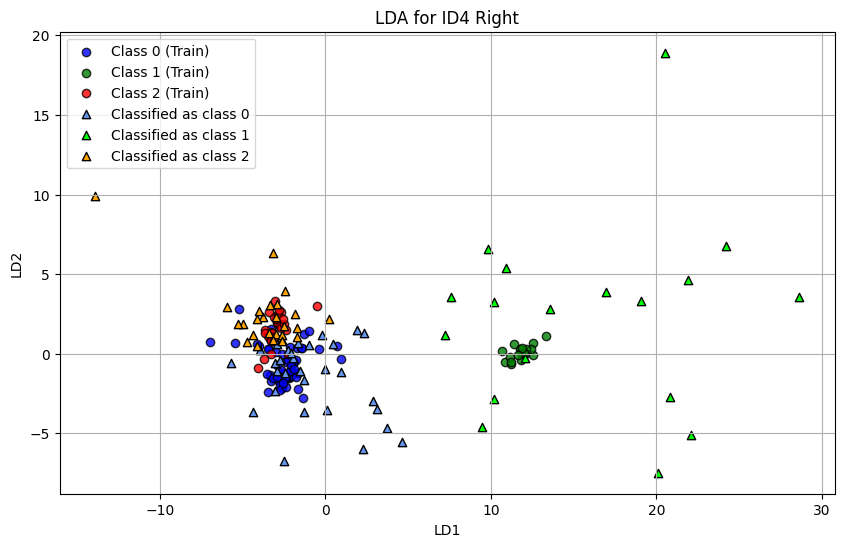

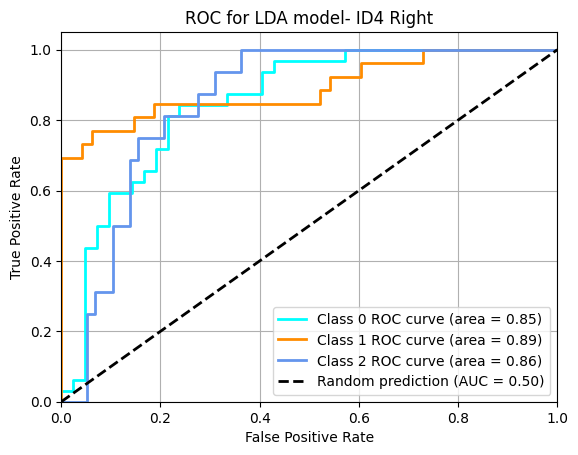

              precision    recall  f1-score   support

           0       0.73      0.69      0.71        32
           1       1.00      0.69      0.82        26
           2       0.50      0.81      0.62        16

    accuracy                           0.72        74
   macro avg       0.74      0.73      0.72        74
weighted avg       0.78      0.72      0.73        74



In [30]:
# LDA
#Training the model and plotting the predictions
id5_lda_result, id5_lda_X_lda, id5_lda_y_score, id5_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID4 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID4 Right')

#Classification Report
print(classification_report(y_test, id5_lda_y_class_score))

QDA

Training time: 106.0805 ms
Testing/prediction time: 18.7752 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 50.00%


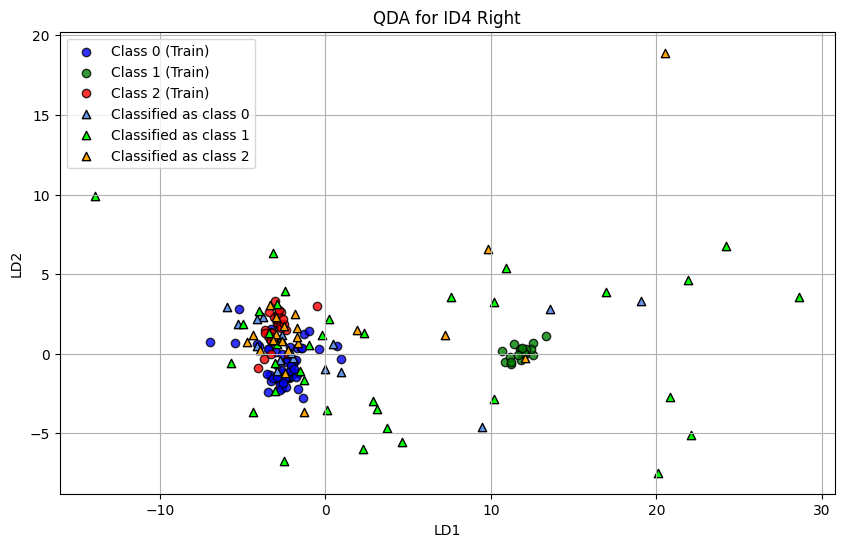

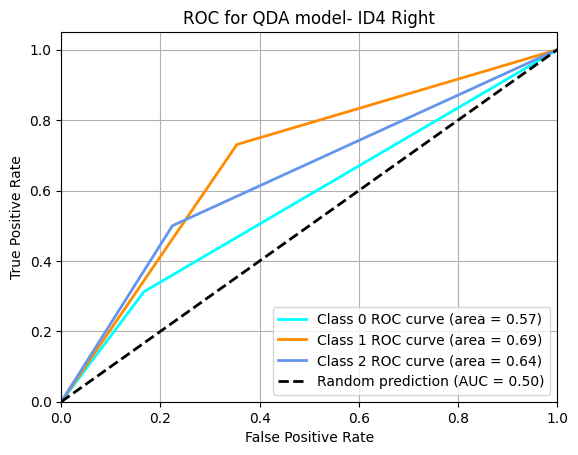

              precision    recall  f1-score   support

           0       0.59      0.31      0.41        32
           1       0.53      0.73      0.61        26
           2       0.38      0.50      0.43        16

    accuracy                           0.50        74
   macro avg       0.50      0.51      0.48        74
weighted avg       0.52      0.50      0.49        74



In [31]:
# QDA
#Training the model and plotting the predictions
id5_qda_result, id5_qda_X_qda, id5_qda_y_score, id5_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID4 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID4 Right')

#Classification Report
print(classification_report(y_test, id5_qda_y_class_score))

PLS

Training time: 22.2313 ms
Testing/prediction time: 5.7769 ms


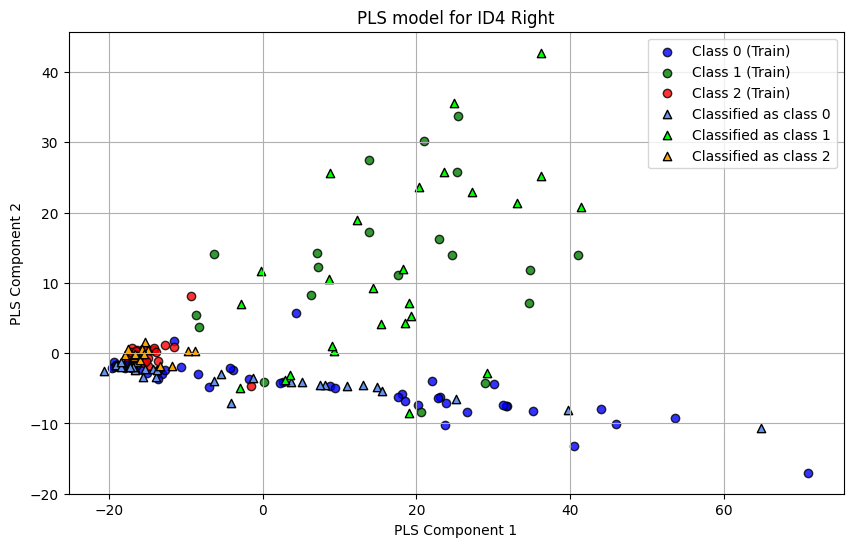

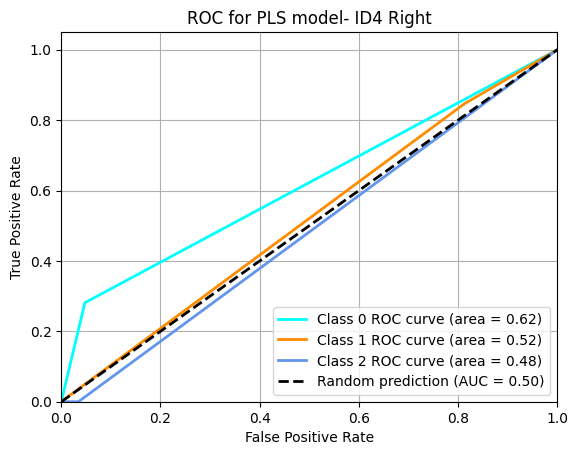

              precision    recall  f1-score   support

           0       0.82      0.28      0.42        32
           1       0.36      0.85      0.51        26
           2       0.00      0.00      0.00        16

    accuracy                           0.42        74
   macro avg       0.39      0.38      0.31        74
weighted avg       0.48      0.42      0.36        74



In [32]:
# PLS
#Training the model and plotting the predictions
id5_pls_result, id5_pls_X_pls, id5_pls_y_score, id5_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS model for ID4 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID4 Right')

#Unbinarizing the data
id5_pls_y_class_score = np.argmax(np.array(id5_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id5_pls_y_class_score))

SVM

Training time: 89.4167 ms
Testing/prediction time: 42.4182 ms
Accuracy: 75.68%


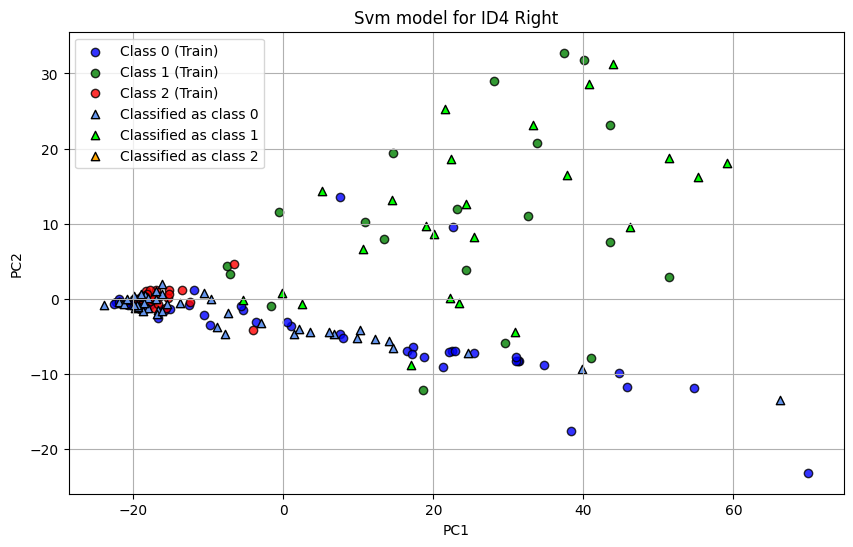

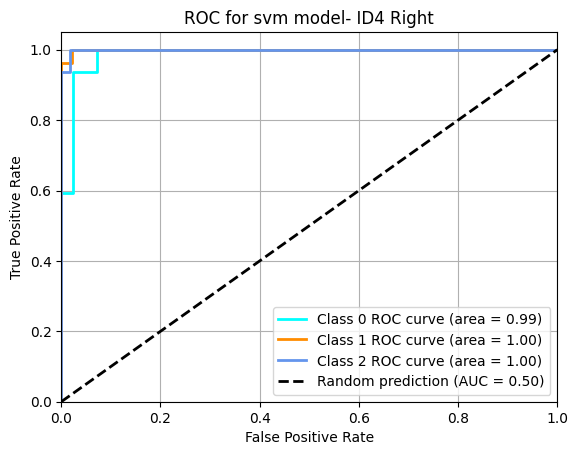

              precision    recall  f1-score   support

           0       0.64      1.00      0.78        32
           1       1.00      0.92      0.96        26
           2       0.00      0.00      0.00        16

    accuracy                           0.76        74
   macro avg       0.55      0.64      0.58        74
weighted avg       0.63      0.76      0.67        74



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [33]:
# SVM
#Training the model and plotting the predictions
id5_svm_result, id5_svm_X_svm, id5_svm_y_score, id5_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='Svm model for ID4 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID4 Right' )
#Classification Report
print(classification_report(y_test, id5_svm_y_class_score))

ANN

Training time: 6199.4517 ms
3/3 [==============================] - 0s 6ms/step
Testing/prediction time: 256.1114 ms


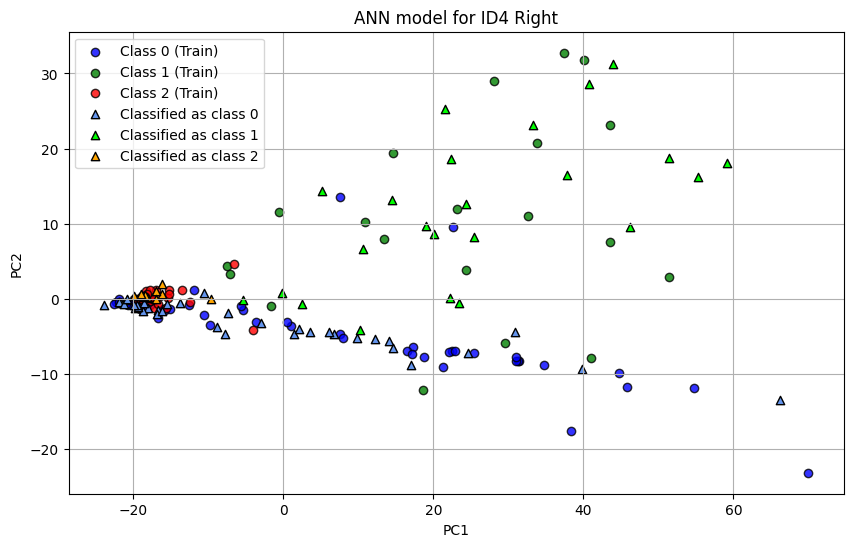

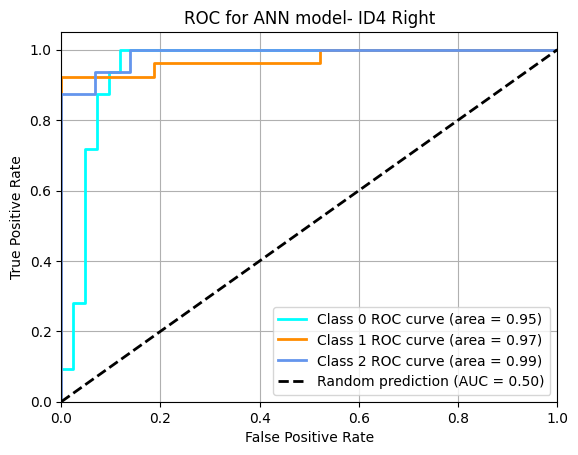

              precision    recall  f1-score   support

           0       0.78      1.00      0.88        32
           1       1.00      0.88      0.94        26
           2       1.00      0.62      0.77        16

    accuracy                           0.88        74
   macro avg       0.93      0.84      0.86        74
weighted avg       0.91      0.88      0.88        74



In [34]:
# ANN
id5_ann_model, id5_ann_y_score, id5_ann_y_class_score, id5_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title='ANN model for ID4 Right')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID4 Right')

#Classification Report
print(classification_report(y_test, id5_ann_y_class_score))

## RAW (Left)

In [35]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID5-RAW1-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID5-RAW2-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID5-RAW1-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID5-RAW2-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-25, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id5_df = pd.DataFrame(dados)
id5_df = id5_df[id5_df['Sinal'].apply(lambda x: len(x) != 0)]
id5_df


,Label,Sinal,Classe
0,BF_Contraction_number_0,"[14.266028344070037, 4.4860283440702915, 9.376...",1
1,BF_Contraction_number_1,"[38.70602834407009, 33.81602834407022, 33.8160...",1
2,BF_Contraction_number_2,"[15.06397165592989, 4.4860283440702915, 0.3939...",1
3,BF_Contraction_number_3,"[5.28397165592969, 24.833971655929872, 34.6139...",1
4,BF_Contraction_number_4,"[33.81602834407022, 28.926028344070346, 33.816...",1
...,...,...,...
139,RF_BaseLine_number_34,"[34.072880486442955, 14.522880486443228, 9.632...",0
140,RF_BaseLine_number_35,"[9.632880486443355, 9.632880486443355, 14.5228...",0
141,RF_BaseLine_number_36,"[4.742880486443028, 14.522880486443228, 4.7428...",0
142,RF_BaseLine_number_37,"[9.632880486443355, 4.742880486443028, 9.63288...",0


Applying the models

In [36]:
#Shuffling the data
X = np.array(id5_df['Sinal'].tolist())
y = np.array(id5_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)
#Spliting into train x test and Standardize the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 167.6815 ms
Testing/prediction time: 18.8470 ms


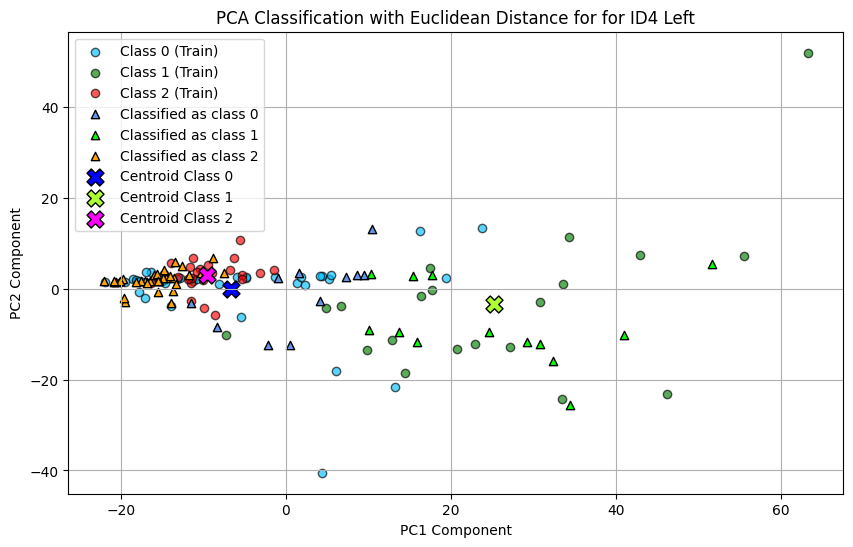

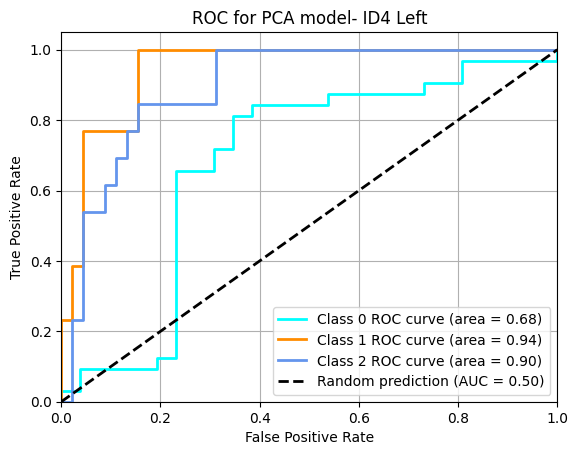

              precision    recall  f1-score   support

           0       0.64      0.22      0.33        32
           1       0.77      0.77      0.77        13
           2       0.35      0.92      0.51        13

    accuracy                           0.50        58
   macro avg       0.59      0.64      0.54        58
weighted avg       0.60      0.50      0.47        58



In [37]:
#PCA
id4_X_train_pca, id4_pca_centroids, id4_pca_y_score, id4_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID4 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id4_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID4 Left')
#Classification Report
print(classification_report(y_test, id4_pca_y_class_score))

LDA

Training time: 321.7783 ms
Testing/prediction time: 2.4726 ms
Accuracy: 55.17%


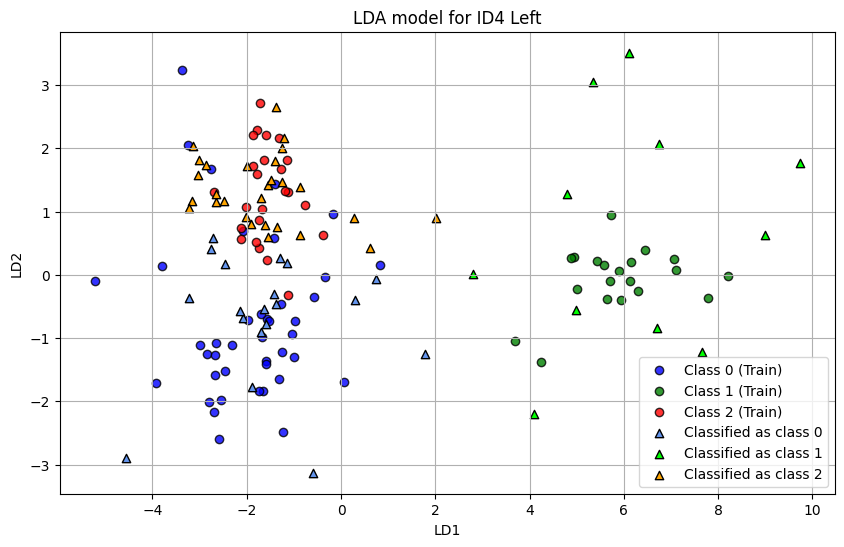

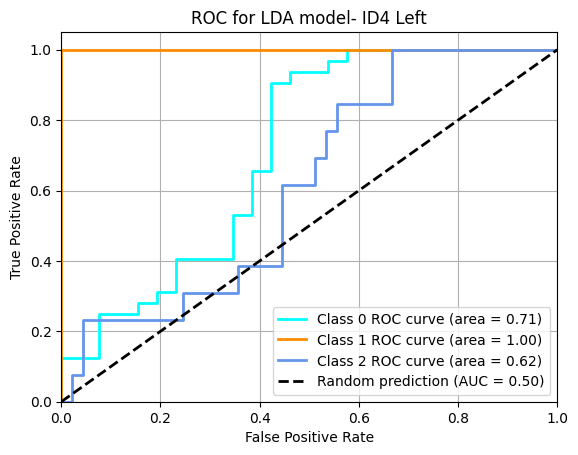

              precision    recall  f1-score   support

           0       0.68      0.41      0.51        32
           1       1.00      0.85      0.92        13
           2       0.29      0.62      0.39        13

    accuracy                           0.55        58
   macro avg       0.66      0.62      0.61        58
weighted avg       0.67      0.55      0.57        58



In [38]:
# LDA
#Training the model and plotting the predictions
id5_lda_result, id5_lda_X_lda, id5_lda_y_score, id5_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA model for ID4 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID4 Left')

#Classification Report
print(classification_report(y_test, id5_lda_y_class_score))

QDA

Training time: 43.3249 ms
Testing/prediction time: 10.3917 ms


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy: 39.66%


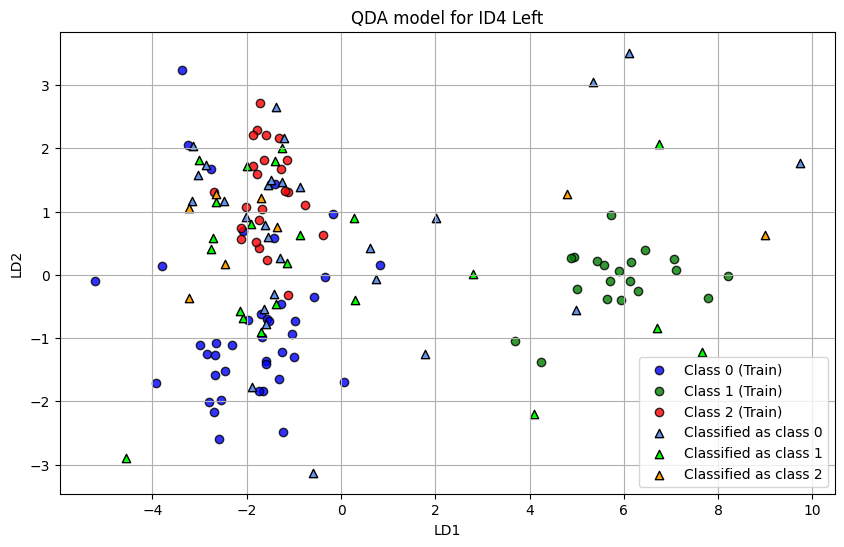

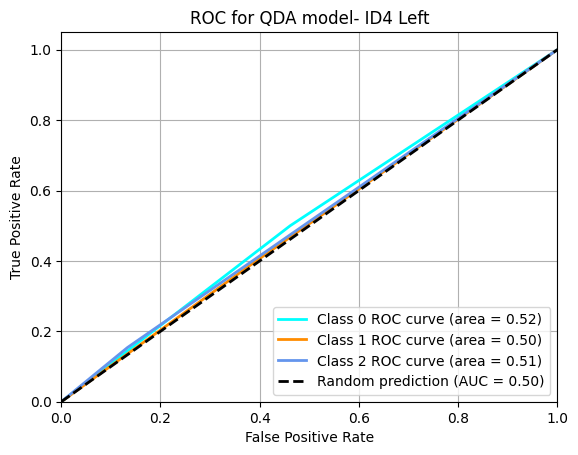

              precision    recall  f1-score   support

           0       0.57      0.50      0.53        32
           1       0.23      0.38      0.29        13
           2       0.25      0.15      0.19        13

    accuracy                           0.40        58
   macro avg       0.35      0.35      0.34        58
weighted avg       0.42      0.40      0.40        58



In [39]:
# QDA
#Training the model and plotting the predictions
id5_qda_result, id5_qda_X_qda, id5_qda_y_score, id5_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA model for ID4 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID4 Left')

#Classification Report
print(classification_report(y_test, id5_qda_y_class_score))

PLS

Training time: 9.2623 ms
Testing/prediction time: 4.4267 ms


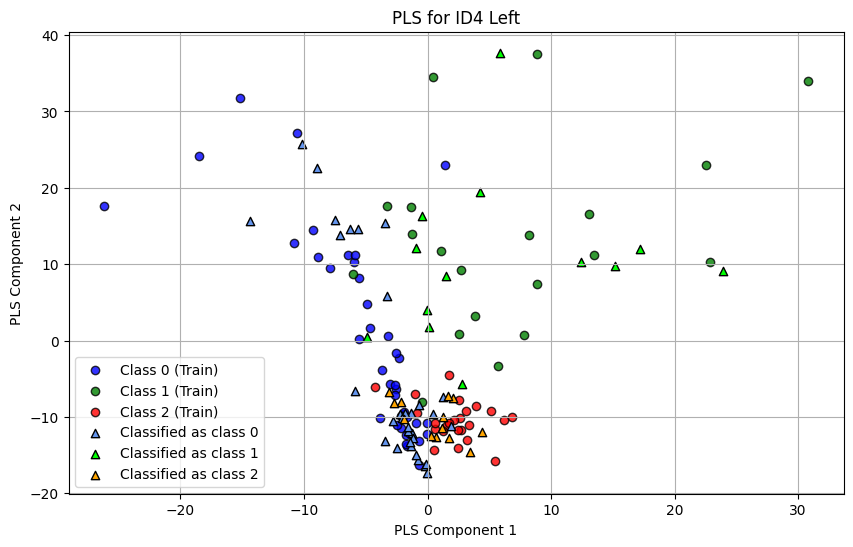

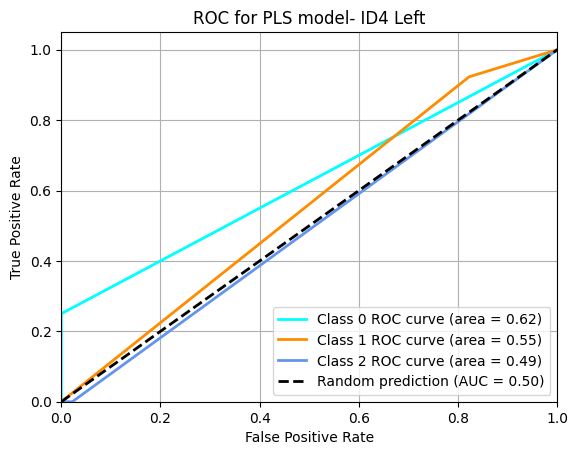

              precision    recall  f1-score   support

           0       1.00      0.25      0.40        32
           1       0.24      0.92      0.39        13
           2       0.00      0.00      0.00        13

    accuracy                           0.34        58
   macro avg       0.41      0.39      0.26        58
weighted avg       0.61      0.34      0.31        58



In [40]:
# PLS
#Training the model and plotting the predictions
id5_pls_result, id5_pls_X_pls, id5_pls_y_score, id5_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID4 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID4 Left')

#Unbinarizing the data
id5_pls_y_class_score = np.argmax(np.array(id5_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id5_pls_y_class_score))

SVM

Training time: 61.7414 ms
Testing/prediction time: 24.9152 ms
Accuracy: 75.86%


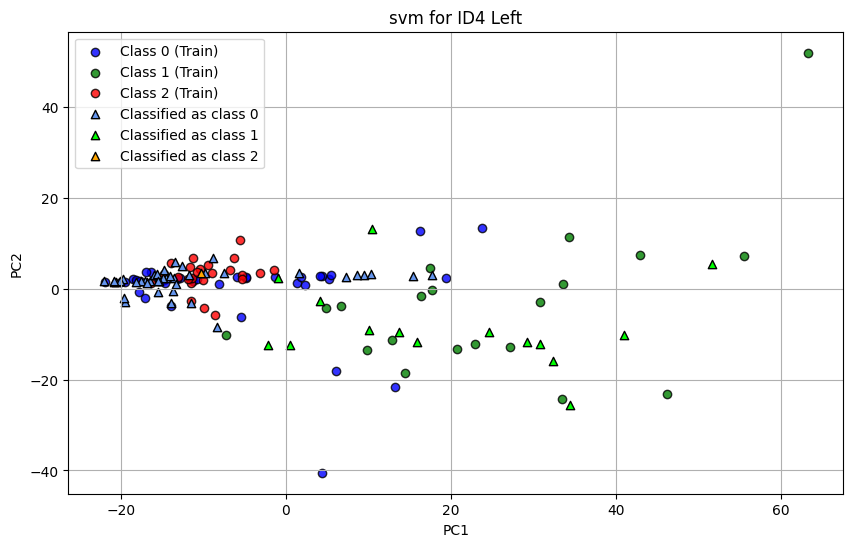

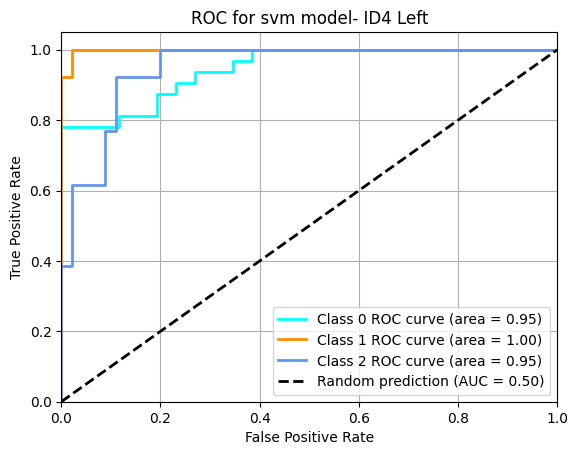

              precision    recall  f1-score   support

           0       0.71      0.94      0.81        32
           1       0.87      1.00      0.93        13
           2       1.00      0.08      0.14        13

    accuracy                           0.76        58
   macro avg       0.86      0.67      0.63        58
weighted avg       0.81      0.76      0.69        58



In [41]:
# SVM
#Training the model and plotting the predictions
id5_svm_result, id5_svm_X_svm, id5_svm_y_score, id5_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='svm for ID4 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID4 Left' )
#Classification Report
print(classification_report(y_test, id5_svm_y_class_score))

ANN

Training time: 7156.6808 ms


2/2 [==============================] - 0s 20ms/step
Testing/prediction time: 787.5795 ms


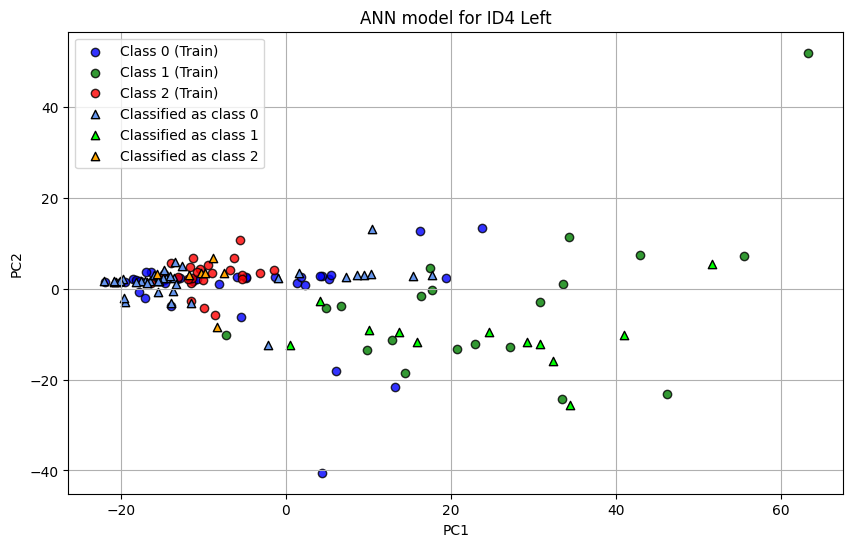

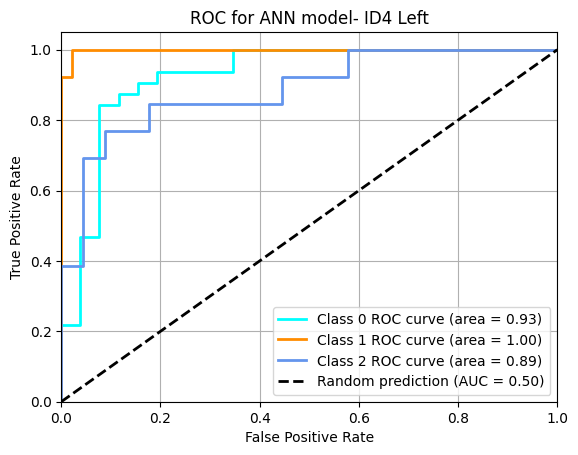

              precision    recall  f1-score   support

           0       0.77      0.94      0.85        32
           1       1.00      0.92      0.96        13
           2       0.71      0.38      0.50        13

    accuracy                           0.81        58
   macro avg       0.83      0.75      0.77        58
weighted avg       0.81      0.81      0.79        58



In [42]:
# ANN
id5_ann_model, id5_ann_y_score, id5_ann_y_class_score, id5_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title='ANN model for ID4 Left')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID4 Left')

#Classification Report
print(classification_report(y_test, id5_ann_y_class_score))

# Indivíduo 5- Maria Clara

## RAW (Right)

In [46]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID6-RAW1-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID6-RAW2-BF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-50, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID6-RAW3-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID6-RAW2-RF-Direito-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-50, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id6_df = pd.DataFrame(dados)
id6_df


,Label,Sinal,Classe
0,BF_Contraction_number_0,"[49.10328193793612, 49.10328193793612, 53.9932...",1
1,BF_Contraction_number_1,"[19.32671806206372, 14.436718062063846, 19.326...",1
2,BF_Contraction_number_2,"[19.77328193793619, 19.77328193793619, 10.0032...",1
3,BF_Contraction_number_3,"[53.993281937936445, 78.42328193793628, 102.86...",1
4,BF_Contraction_number_4,"[10.003281937936208, 0.22328193793600803, 0.22...",1
...,...,...,...
175,RF_BaseLine_number_46,"[3.5043767808920165, 3.5043767808920165, 3.504...",0
176,RF_BaseLine_number_47,"[3.5043767808920165, 3.5043767808920165, 3.504...",0
177,RF_BaseLine_number_48,"[3.5043767808920165, 1.3756232191080926, 1.375...",0
178,RF_BaseLine_number_49,"[6.265623219107965, 3.5043767808920165, 3.5043...",0


Applying the models

In [45]:
#Shuffling the data
X = np.array(id6_df['Sinal'].tolist())
y = np.array(id6_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 113.2126 ms
Testing/prediction time: 1.6365 ms


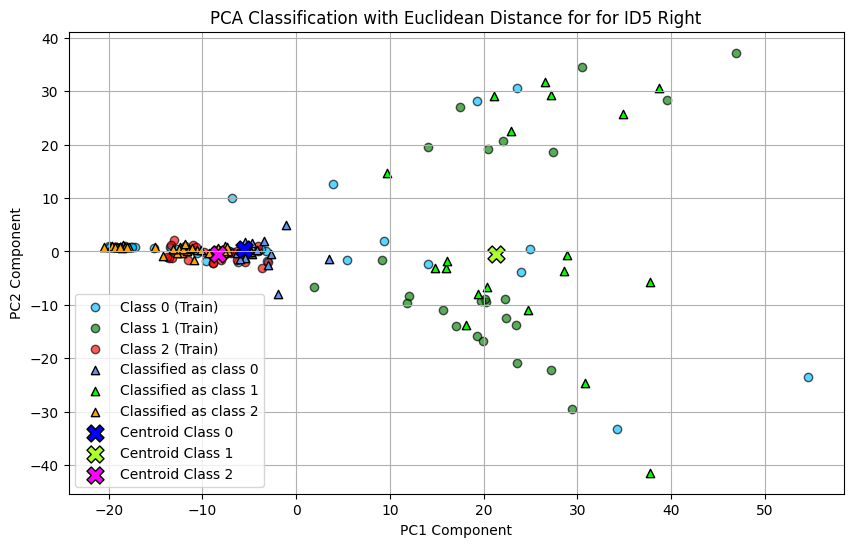

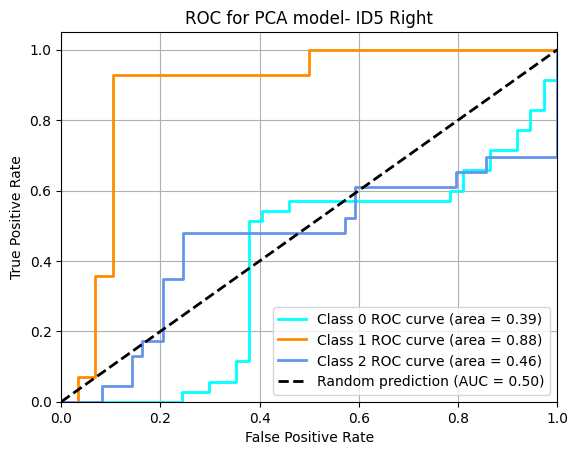

              precision    recall  f1-score   support

           0       0.20      0.09      0.12        35
           1       0.68      0.93      0.79        14
           2       0.29      0.48      0.36        23

    accuracy                           0.38        72
   macro avg       0.39      0.50      0.42        72
weighted avg       0.32      0.38      0.33        72



In [47]:
#PCA
id5_X_train_pca, id5_pca_centroids, id5_pca_y_score, id5_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID5 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID5 Right')
#Classification Report
print(classification_report(y_test, id5_pca_y_class_score))

LDA

Training time: 253.0551 ms
Testing/prediction time: 1.7607 ms
Accuracy: 54.17%


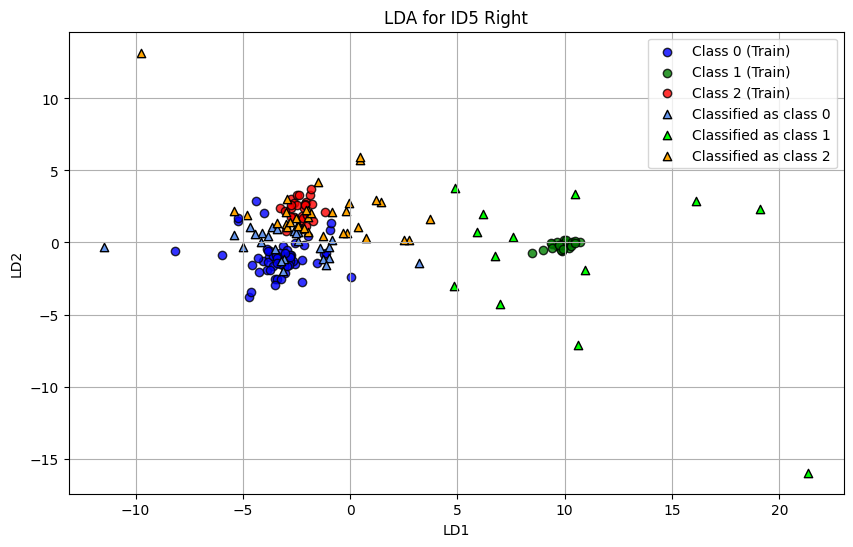

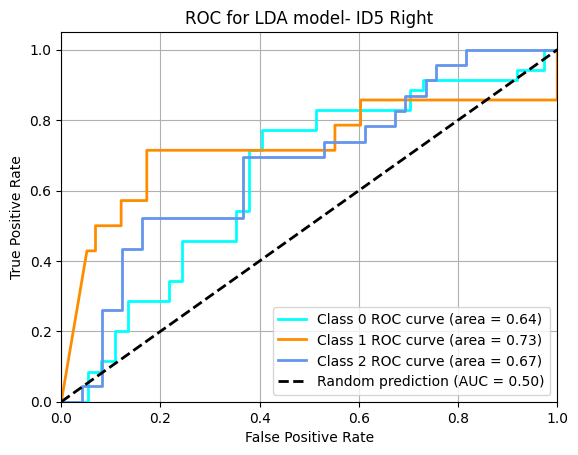

              precision    recall  f1-score   support

           0       0.64      0.46      0.53        35
           1       0.54      0.50      0.52        14
           2       0.47      0.70      0.56        23

    accuracy                           0.54        72
   macro avg       0.55      0.55      0.54        72
weighted avg       0.57      0.54      0.54        72



In [48]:
# LDA
#Training the model and plotting the predictions
id6_lda_result, id6_lda_X_lda, id6_lda_y_score, id6_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID5 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID5 Right')

#Classification Report
print(classification_report(y_test, id6_lda_y_class_score))

QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 47.0800 ms
Testing/prediction time: 9.9087 ms
Accuracy: 58.33%


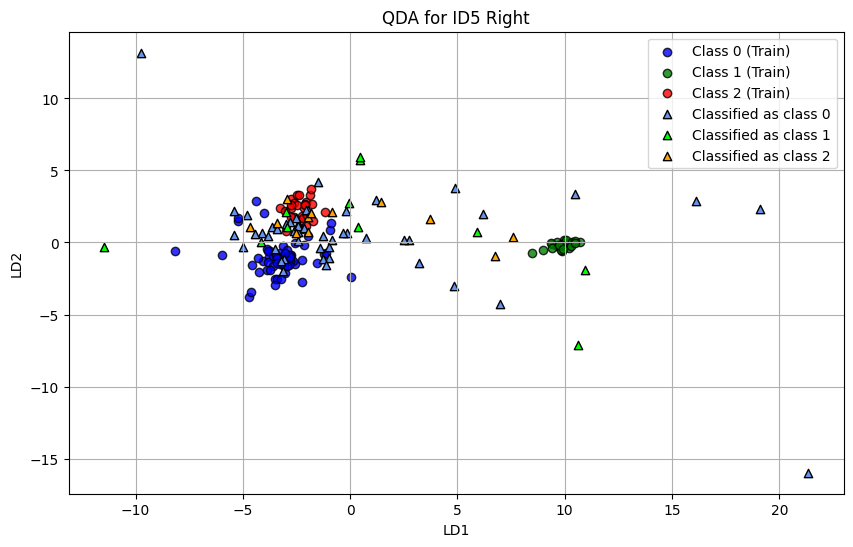

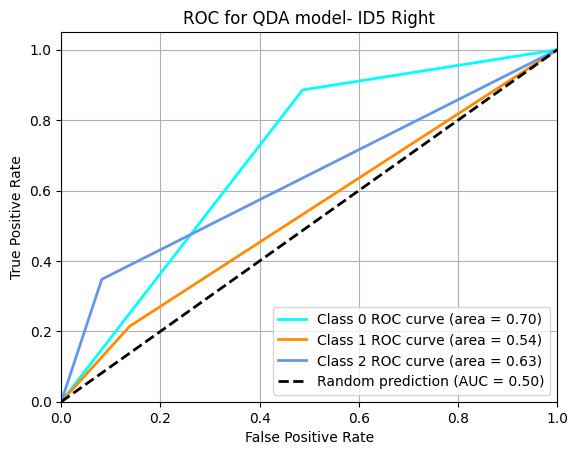

              precision    recall  f1-score   support

           0       0.63      0.89      0.74        35
           1       0.27      0.21      0.24        14
           2       0.67      0.35      0.46        23

    accuracy                           0.58        72
   macro avg       0.52      0.48      0.48        72
weighted avg       0.57      0.58      0.55        72



In [49]:
# QDA
#Training the model and plotting the predictions
id6_qda_result, id6_qda_X_qda, id6_qda_y_score, id6_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID5 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID5 Right')

#Classification Report
print(classification_report(y_test, id6_qda_y_class_score))

PLS

Training time: 18.8665 ms
Testing/prediction time: 7.0944 ms


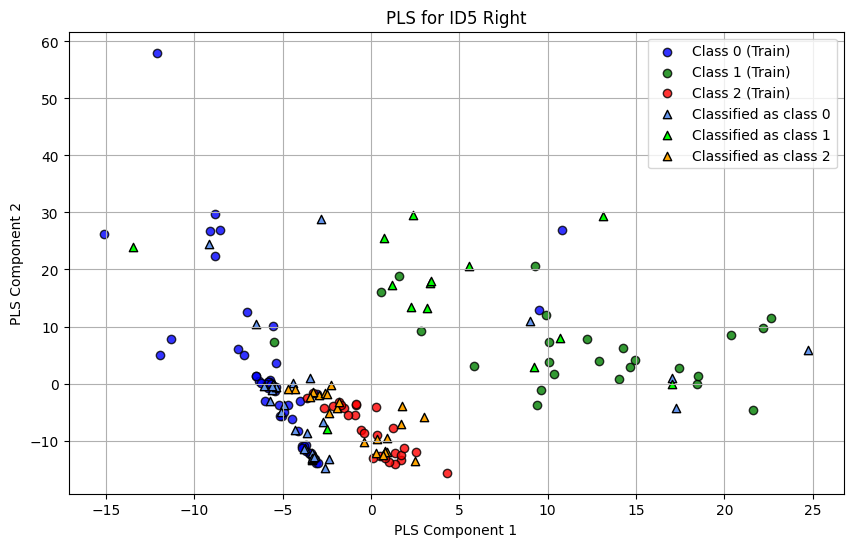

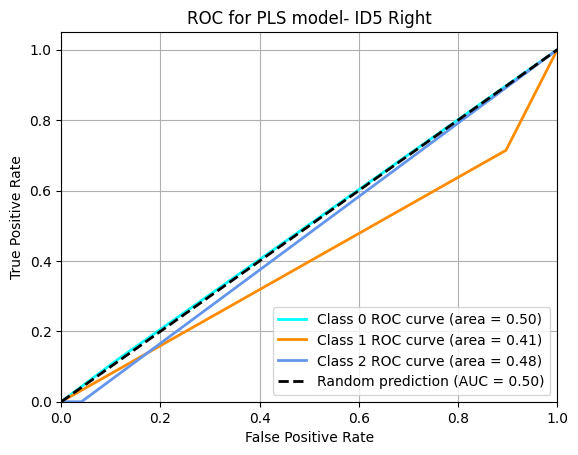

              precision    recall  f1-score   support

           0       0.50      0.11      0.19        35
           1       0.16      0.71      0.26        14
           2       0.00      0.00      0.00        23

    accuracy                           0.19        72
   macro avg       0.22      0.28      0.15        72
weighted avg       0.27      0.19      0.14        72



In [50]:
# PLS
#Training the model and plotting the predictions
id6_pls_result, id6_pls_X_pls, id6_pls_y_score, id6_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID5 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID5 Right')

#Unbinarizing the data
id6_pls_y_class_score = np.argmax(np.array(id6_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id6_pls_y_class_score))

SVM

Training time: 87.2283 ms
Testing/prediction time: 37.4568 ms
Accuracy: 72.22%


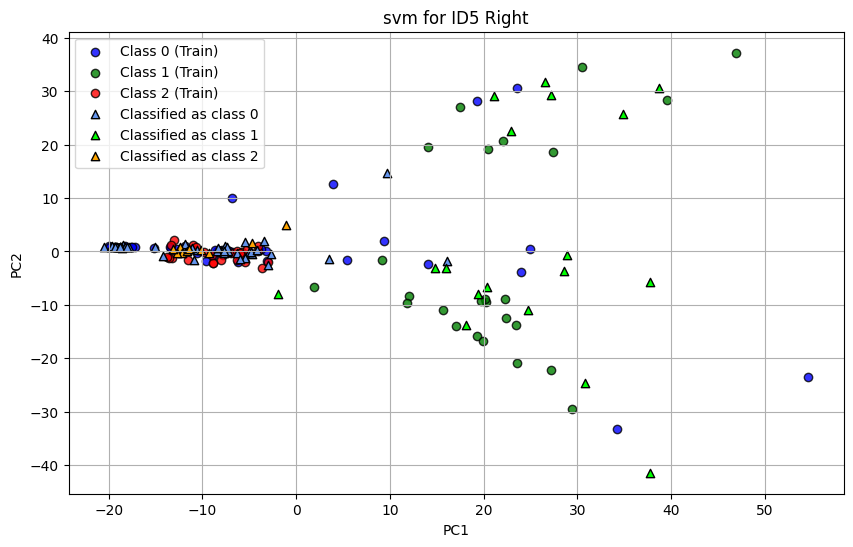

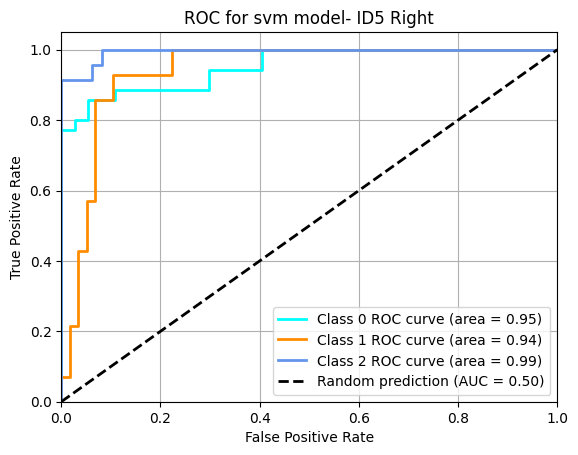

              precision    recall  f1-score   support

           0       0.68      0.86      0.76        35
           1       0.67      0.86      0.75        14
           2       1.00      0.43      0.61        23

    accuracy                           0.72        72
   macro avg       0.78      0.72      0.71        72
weighted avg       0.78      0.72      0.71        72



In [51]:
# SVM
#Training the model and plotting the predictions
id6_svm_result, id6_svm_X_svm, id6_svm_y_score, id6_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title = 'svm for ID5 Right')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID5 Right' )
#Classification Report
print(classification_report(y_test, id6_svm_y_class_score))

ANN

Training time: 2814.0671 ms
3/3 [==============================] - 0s 6ms/step
Testing/prediction time: 220.8538 ms


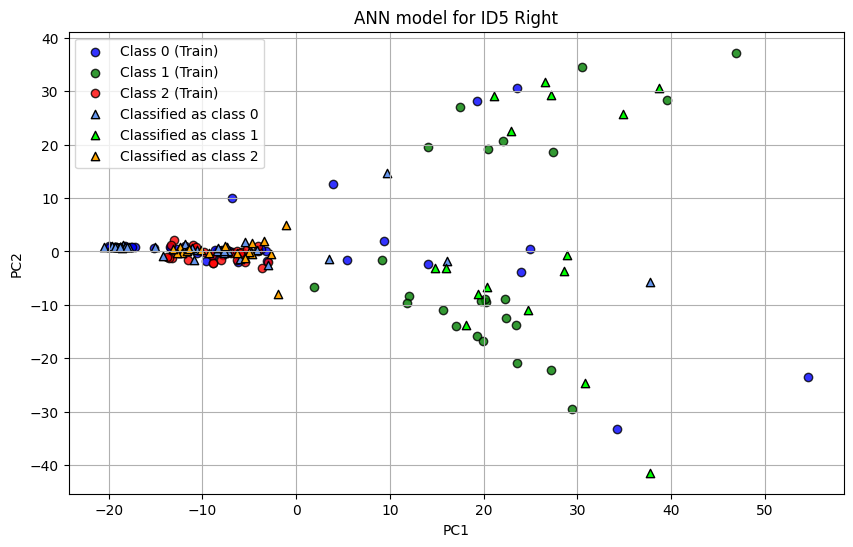

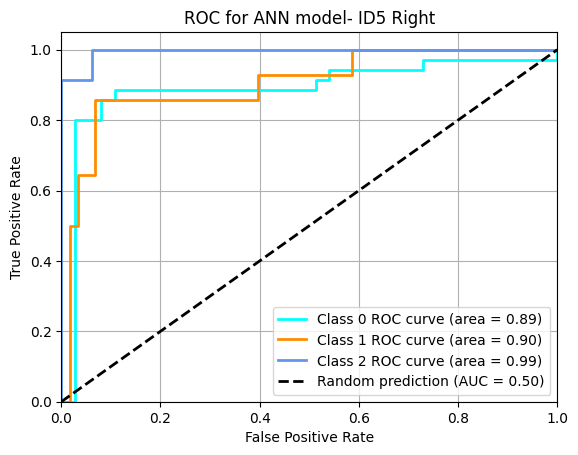

              precision    recall  f1-score   support

           0       0.82      0.89      0.85        35
           1       0.75      0.86      0.80        14
           2       1.00      0.78      0.88        23

    accuracy                           0.85        72
   macro avg       0.86      0.84      0.84        72
weighted avg       0.86      0.85      0.85        72



In [52]:
# ANN
id6_ann_model, id6_ann_y_score, id6_ann_y_class_score, id6_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title='ANN model for ID5 Right')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID5 Right')

#Classification Report
print(classification_report(y_test, id6_ann_y_class_score))

## RAW (Left)

In [54]:
# Lendo os arquivos e colocando em uma so df
#Biceps femoral

bf1 = pd.read_csv('/content/ID6-RAW1-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
bf2 = pd.read_csv('/content/ID6-RAW2-BF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


bf_combined = pd.concat([bf1, bf2], ignore_index=True)


#Dividing Data
bf_amplitude = np.array(bf_combined['Amplitude (mV)'])
bf_amplitudeN= bf_amplitude- np.mean(bf_amplitude)
bf_peaks, bf_baseline, bf_contractions, bf_vector_baseline, bf_normalized_baseline_vector, bf_vector_contractions= data_division(data = abs(bf_amplitudeN),
                  peaks_height = 150, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-50, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
bf_contracao = [{'Label': f'BF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 1} for i, sinal in enumerate(bf_vector_contractions)]
bf_relaxamento = [{'Label': f'BF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(bf_normalized_baseline_vector)]

bf_data= bf_contracao + bf_relaxamento
#Reto Femoral
rf1 = pd.read_csv('/content/ID6-RAW3-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')
rf2 = pd.read_csv('/content/ID6-RAW2-RF-Esquerdo-25ContracoesSucessivas.txt', delimiter = '\t')


rf_combined = pd.concat([rf1, rf2], ignore_index=True)


#Dividing Data
rf_amplitude = np.array(rf_combined['Amplitude (mV)'])
rf_amplitudeN= rf_amplitude- np.mean(rf_amplitude)
rf_peaks, rf_baseline, rf_contractions, rf_vector_baseline, rf_normalized_baseline_vector, rf_vector_contractions= data_division(data = abs(rf_amplitudeN),
                  peaks_height = 50, peaks_dist = 1000,
                  contraction_division_window = contraction_division_window-50, baseline_overlap = 0,
                  plot = False)

#Lists to future dataset structure
rf_contracao = [{'Label': f'RF_Contraction_number_{i}', 'Sinal': sinal, 'Classe': 2} for i, sinal in enumerate(rf_vector_contractions)]
rf_relaxamento = [{'Label': f'RF_BaseLine_number_{i}', 'Sinal': sinal, 'Classe': 0} for i, sinal in enumerate(rf_normalized_baseline_vector)]

rf_data= rf_contracao + rf_relaxamento
#Juntando os dois
dados = bf_data + rf_data
id6_df = pd.DataFrame(dados)
id6_df

,Label,Sinal,Classe
0,BF_Contraction_number_0,"[7.41441328455312, 2.5244132845532476, 12.1455...",1
1,BF_Contraction_number_1,"[7.41441328455312, 12.29441328455323, 12.29441...",1
2,BF_Contraction_number_2,"[31.844413284552957, 17.184413284553102, 7.255...",1
3,BF_Contraction_number_3,"[26.805586715447134, 21.915586715446807, 2.365...",1
4,BF_Contraction_number_4,"[36.575586715447116, 31.695586715447007, 26.80...",1
...,...,...,...
189,RF_BaseLine_number_42,"[2.9075509488684474, 7.79755094886832, 1.98244...",0
190,RF_BaseLine_number_43,"[12.67755094886843, 2.9075509488684474, 1.9824...",0
191,RF_BaseLine_number_44,"[6.872449051131753, 11.762449051131625, 6.8724...",0
192,RF_BaseLine_number_45,"[2.9075509488684474, 7.79755094886832, 2.90755...",0


Applying the models

In [55]:
#Shuffling the data
X = np.array(id6_df['Sinal'].tolist())
y = np.array(id6_df['Classe'])

X,y,_ = shuffering(x= X, y= y, times = 11)

#Spliting into train x test and Standardize the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

The data was shuffled 10 times with the last random state parameter being also 10


PCA

Training time: 39.1281 ms
Testing/prediction time: 11.9472 ms


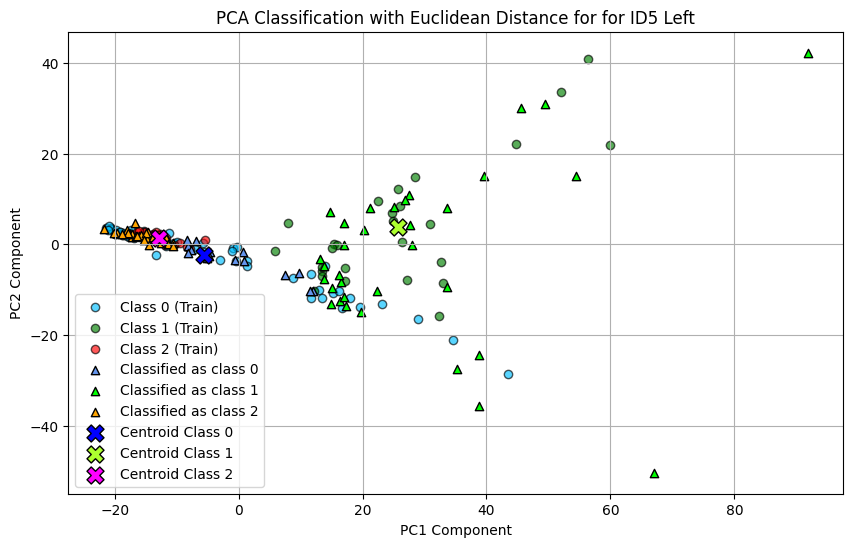

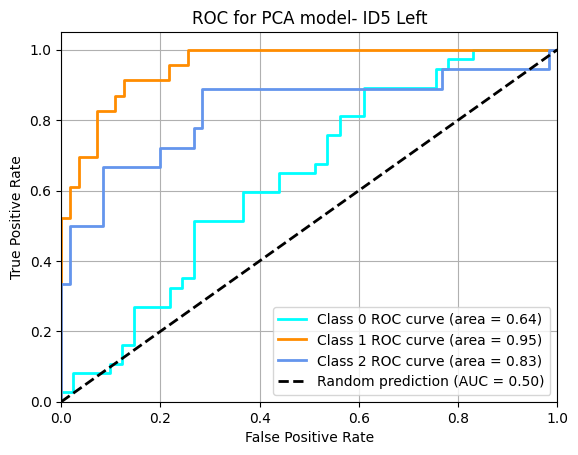

              precision    recall  f1-score   support

           0       0.60      0.24      0.35        37
           1       0.67      0.96      0.79        23
           2       0.43      0.72      0.54        18

    accuracy                           0.56        78
   macro avg       0.57      0.64      0.56        78
weighted avg       0.58      0.56      0.52        78



In [56]:
#PCA
id5_X_train_pca, id5_pca_centroids, id5_pca_y_score, id5_pca_y_class_score = apply_pca(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='for ID5 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id5_pca_y_score, y_test = y_test,title= 'ROC for PCA model- ID5 Left')
#Classification Report
print(classification_report(y_test, id5_pca_y_class_score))

LDA

Training time: 239.1217 ms
Testing/prediction time: 3.6893 ms
Accuracy: 74.36%


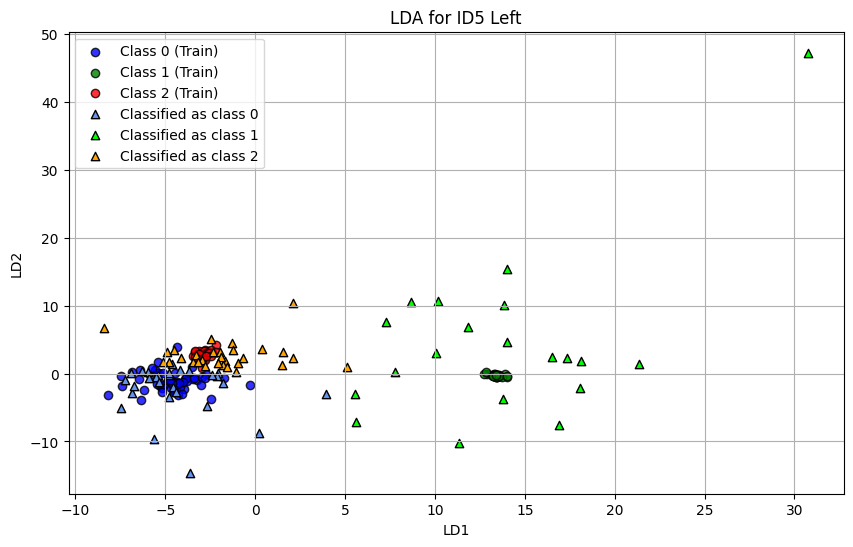

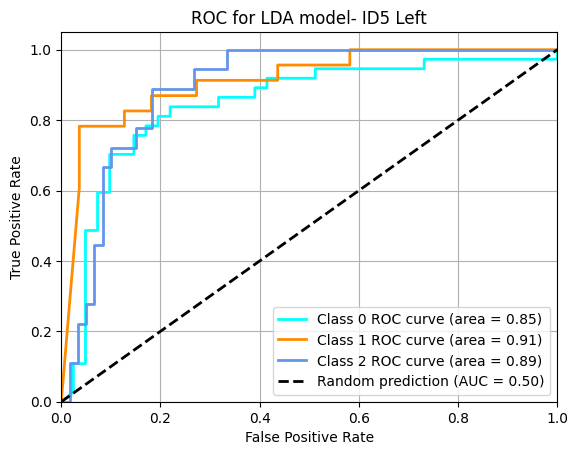

              precision    recall  f1-score   support

           0       0.86      0.65      0.74        37
           1       0.90      0.78      0.84        23
           2       0.53      0.89      0.67        18

    accuracy                           0.74        78
   macro avg       0.76      0.77      0.75        78
weighted avg       0.80      0.74      0.75        78



In [57]:
# LDA
#Training the model and plotting the predictions
id6_lda_result, id6_lda_X_lda, id6_lda_y_score, id6_lda_y_class_score = apply_lda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='LDA for ID5 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_lda_y_score, y_test = y_test,title= 'ROC for LDA model- ID5 Left')

#Classification Report
print(classification_report(y_test, id6_lda_y_class_score))

QDA

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Training time: 43.8669 ms
Testing/prediction time: 20.8361 ms
Accuracy: 60.26%


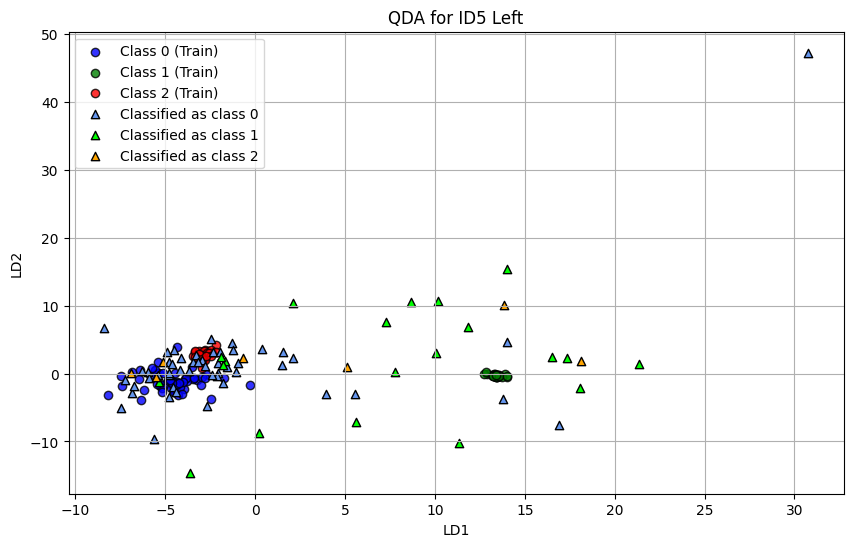

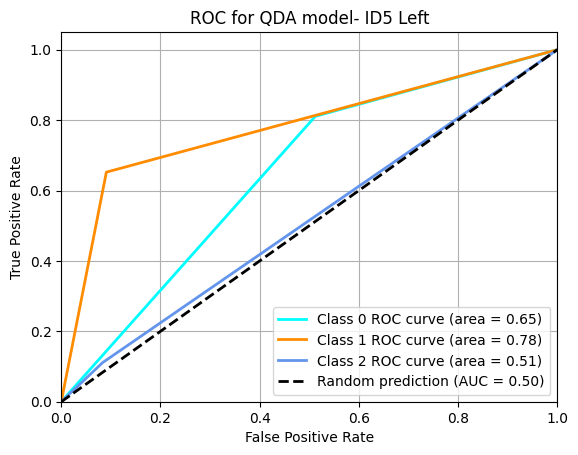

              precision    recall  f1-score   support

           0       0.59      0.81      0.68        37
           1       0.75      0.65      0.70        23
           2       0.29      0.11      0.16        18

    accuracy                           0.60        78
   macro avg       0.54      0.52      0.51        78
weighted avg       0.57      0.60      0.57        78



In [58]:
# QDA
#Training the model and plotting the predictions
id6_qda_result, id6_qda_X_qda, id6_qda_y_score, id6_qda_y_class_score = apply_qda(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='QDA for ID5 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_qda_y_score, y_test = y_test,title= 'ROC for QDA model- ID5 Left')

#Classification Report
print(classification_report(y_test, id6_qda_y_class_score))

PLS

Training time: 24.8837 ms
Testing/prediction time: 3.4003 ms


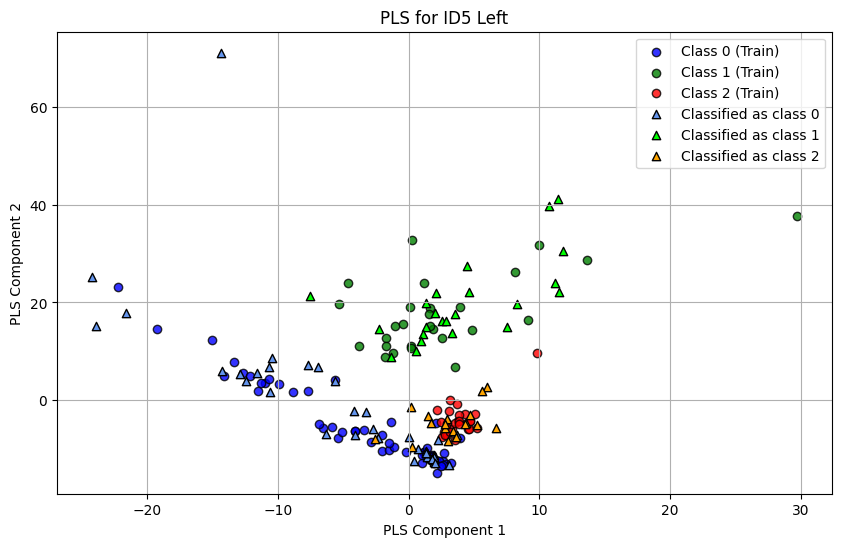

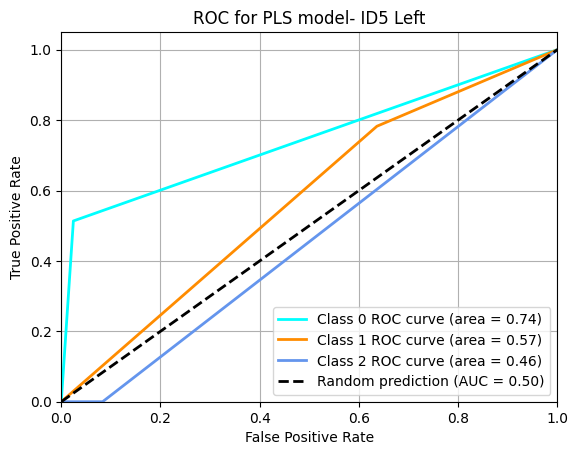

              precision    recall  f1-score   support

           0       0.95      0.51      0.67        37
           1       0.34      0.78      0.47        23
           2       0.00      0.00      0.00        18

    accuracy                           0.47        78
   macro avg       0.43      0.43      0.38        78
weighted avg       0.55      0.47      0.46        78



In [59]:
# PLS
#Training the model and plotting the predictions
id6_pls_result, id6_pls_X_pls, id6_pls_y_score, id6_pls_y_class_score = apply_pls(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title='PLS for ID5 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_pls_y_score, y_test = y_test,title= 'ROC for PLS model- ID5 Left')

#Unbinarizing the data
id6_pls_y_class_score = np.argmax(np.array(id6_pls_y_score), axis=1)

#Classification Report
print(classification_report(y_test, id6_pls_y_class_score))

SVM

Training time: 81.9316 ms
Testing/prediction time: 33.0014 ms
Accuracy: 82.05%


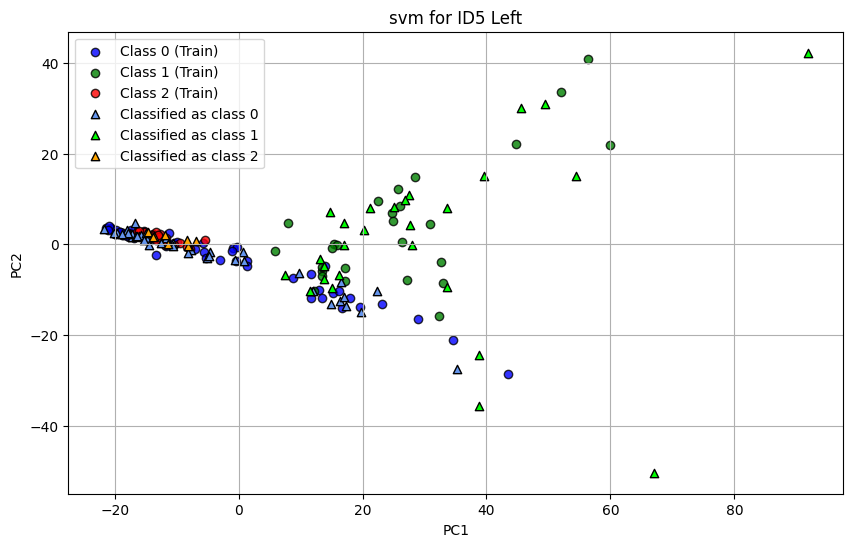

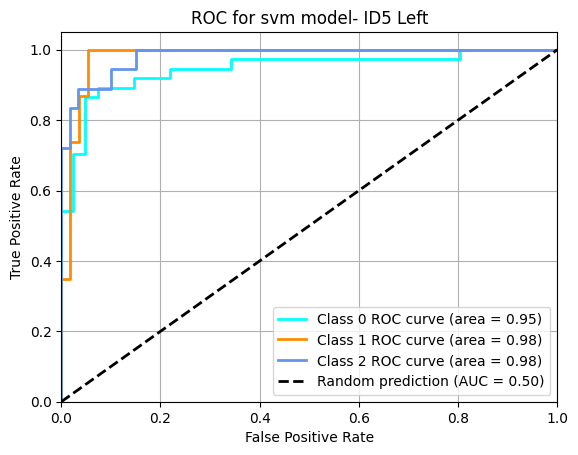

              precision    recall  f1-score   support

           0       0.77      0.89      0.82        37
           1       0.85      1.00      0.92        23
           2       1.00      0.44      0.62        18

    accuracy                           0.82        78
   macro avg       0.87      0.78      0.79        78
weighted avg       0.85      0.82      0.80        78



In [60]:
# SVM
#Training the model and plotting the predictions
id6_svm_result, id6_svm_X_svm, id6_svm_y_score, id6_svm_y_class_score = apply_svm(X=X_train,
                                                                                  y=y_train,
                                                                                  X_test=X_test,
                                                                                  y_test = y_test,
                                                                                  plot = True,
                                                                                  title = 'svm for ID5 Left')
#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_svm_y_score, y_test = y_test,title= 'ROC for svm model- ID5 Left' )
#Classification Report
print(classification_report(y_test, id6_svm_y_class_score))

ANN

Training time: 8519.1283 ms
3/3 [==============================] - 0s 7ms/step
Testing/prediction time: 437.7351 ms


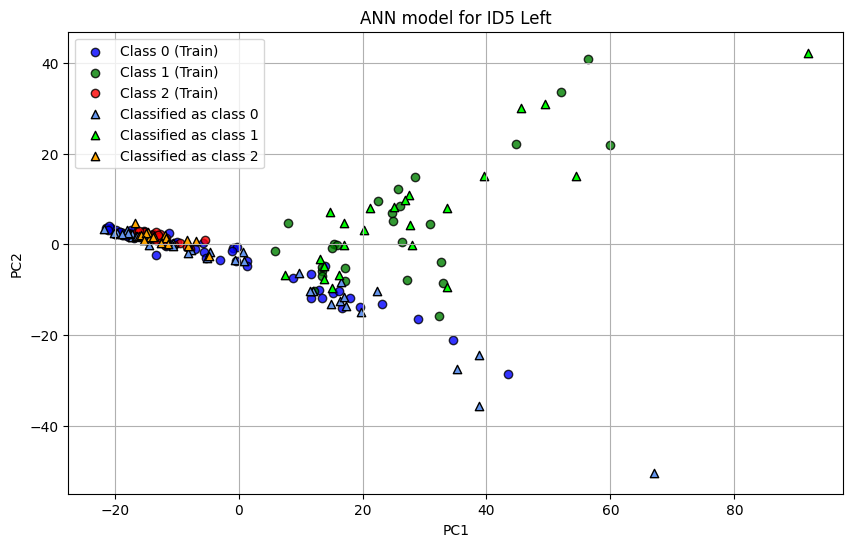

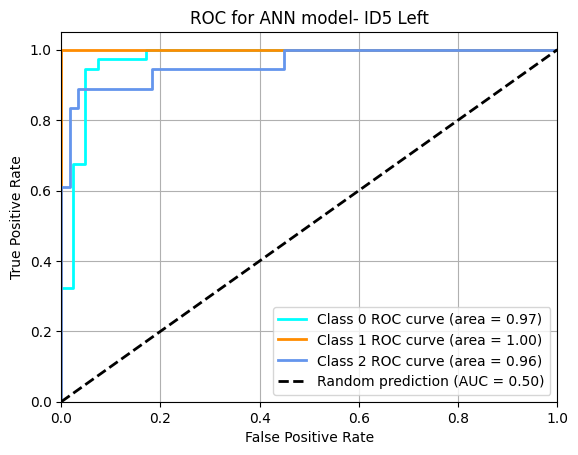

              precision    recall  f1-score   support

           0       0.92      0.95      0.93        37
           1       1.00      1.00      1.00        23
           2       0.88      0.83      0.86        18

    accuracy                           0.94        78
   macro avg       0.93      0.93      0.93        78
weighted avg       0.94      0.94      0.94        78



In [61]:
# ANN
id6_ann_model, id6_ann_y_score, id6_ann_y_class_score, id6_ann_history= build_and_apply_ann(X = X_train,
                                                                                    y=y_train,
                                                                                    X_test=X_test,
                                                                                    y_test=y_test,
                                                                                    epochs=50,
                                                                                    batch_size=32,
                                                                                    plot=True, title='ANN model for ID5 Left')

#Evaluating the model plotting ROC Curve
plot_ROC(probs= id6_ann_y_score, y_test = y_test,title= 'ROC for ANN model- ID5 Left')

#Classification Report
print(classification_report(y_test, id6_ann_y_class_score))